# Data mining project 22/23

## Import libraries

In [ ]:
#pip install --upgrade scikit-learn

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# zscore
from scipy.stats import zscore
# kmeans, bisecting kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans
# scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform

In [2]:
from sklearn.metrics import *
from sklearn.cluster import BisectingKMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph
from sklearn.neighbors import NearestNeighbors

In [4]:
df_ini = pd.read_csv(r"C:\Users\Steffania\Documents\Projects 1st semester\DM Project\ravdess_dm1_dataset\ravdess_features.csv")

In [5]:
df = df_ini.copy()

In [6]:
df.shape # shape of dataset (rows, columns)

(2452, 38)

In [7]:
nunique = df.nunique()
nunique

modality                  1
vocal_channel             2
emotion                   8
emotional_intensity       2
statement                 2
repetition                2
actor                    24
sex                       2
channels                  2
sample_width              1
frame_rate                1
frame_width               2
length_ms                95
frame_count             158
intensity               989
zero_crossings_sum     2176
mfcc_mean              2451
mfcc_std               2449
mfcc_min               2451
mfcc_max               2449
sc_mean                2451
sc_std                 2451
sc_min                 1431
sc_max                 2423
sc_kur                 2451
sc_skew                2451
stft_mean              2451
stft_std               2451
stft_min               1431
stft_max                  1
stft_kur               2451
stft_skew              2451
mean                   2450
std                    2451
min                    2148
max                 

In [8]:
to_delete = []
for key, value in nunique.items():
    if(value == 1):
        print("To delete: ", key)
        to_delete.append(key)
    if(value > 1 and value < 100):
        print("To evaluate: ", key)

To delete:  modality
To evaluate:  vocal_channel
To evaluate:  emotion
To evaluate:  emotional_intensity
To evaluate:  statement
To evaluate:  repetition
To evaluate:  actor
To evaluate:  sex
To evaluate:  channels
To delete:  sample_width
To delete:  frame_rate
To evaluate:  frame_width
To evaluate:  length_ms
To delete:  stft_max


In [9]:
df = df.drop(columns=to_delete)

In [10]:
df = df.drop(columns='mean')

In [11]:
def get_emotion_positivity(x):
    if(x == 'fearful' or x == 'angry' or x =='sad' or x == 'disgust'):
        return -1;
    if(x == 'happy' or x == 'surprised'): # is calm positive?
        return 1;
    return 0;

df["emotion_positivity"] = df["emotion"].map(get_emotion_positivity)
df["emotion_positivity"]

0      -1
1      -1
2       1
3       1
4       1
       ..
2447    0
2448    0
2449   -1
2450    1
2451    0
Name: emotion_positivity, Length: 2452, dtype: int64

In [12]:
df["length"] = df["length_ms"] / 1000
df = df.drop(columns=["length_ms"])

In [13]:
#replacement of one of the variables
df["zero_crossings_rate"] = df["zero_crossings_sum"] / df["length"]
df["zero_crossings_rate"]

0       4547.765587
1       3561.987705
2       4008.349390
3       3194.116030
4       3437.102634
           ...     
2447    2143.539631
2448    2148.885159
2449    1863.905325
2450    2599.946481
2451    2456.867344
Name: zero_crossings_rate, Length: 2452, dtype: float64

In [14]:
df = df.drop(columns=["zero_crossings_sum"])

In [15]:
df['statement'] = df['statement'].replace(['Dogs are sitting by the door'], '0')
df['statement'] = df['statement'].replace(['Kids are talking by the door'], '1')

## Pairwise correlations and eventual elimination of variables

We drop _frame_rate_ column because there is just _length_ that measures the length of audio and of course _frame_rate_ is proportional to _length_.

In [16]:
df_num = df.copy() # copy of all numerical and ratio-scaled attributes

In [17]:
df_num = df_num.drop(columns = ["vocal_channel", "emotion", "emotional_intensity", "statement", "repetition", "actor", "sex", "channels", "frame_width"])
df_num.T

,0,1,2,3,4,5,6,7,8,9,...,2442,2443,2444,2445,2446,2447,2448,2449,2450,2451
frame_count,179379.000000,187387.000000,224224.000000,174575.000000,211411.000000,171371.000000,180980.000000,164965.000000,180981.000000,209810.000000,...,233834.000000,184184.000000,168168.000000,155356.000000,240240.000000,221021.000000,200200.000000,251451.000000,179379.000000,184184.000000
intensity,-36.793432,NaN,-32.290737,-49.019839,-31.214503,-36.312244,NaN,-49.095042,-45.906837,NaN,...,-29.512788,-47.141749,NaN,NaN,-36.811776,NaN,-43.342901,NaN,-45.751265,-40.018044
mfcc_mean,-33.485947,-29.502108,-30.532463,-36.059555,-31.405996,-30.500889,-30.177172,-36.048576,-33.899364,-29.462296,...,-22.787794,-28.682810,-25.771196,-25.815453,-24.805220,-30.225578,-31.160332,-26.135280,-28.242815,-29.019236
mfcc_std,134.654860,130.485630,126.577110,159.725160,122.125824,132.581730,139.507460,167.652130,159.197620,116.833786,...,113.349300,154.492430,157.241900,147.116780,138.314590,158.845500,157.499700,138.133210,159.943400,149.188950
mfcc_min,-755.223450,-713.985600,-726.060360,-842.946350,-700.702760,-719.165470,-767.193600,-910.497440,-879.260000,-645.926200,...,-659.389100,-859.211730,-821.105700,-798.653700,-782.337340,-855.924200,-825.374100,-768.365360,-868.095760,-799.510100
mfcc_max,171.690920,205.007700,165.456530,190.036090,161.134000,213.681920,228.327150,220.383730,207.632170,167.967530,...,202.859280,197.396960,251.228530,214.569700,219.623290,208.184970,220.794900,235.539380,219.843500,219.527800
sc_mean,5792.550744,5197.620555,4830.743037,5376.446478,5146.012474,4251.116912,5718.247598,6085.206268,6349.352394,5486.705835,...,3918.703428,4659.880471,5604.753887,4645.862618,4369.123635,5886.647366,6602.742127,4654.156076,5524.736973,6082.676123
sc_std,3328.055457,4040.931570,3332.131300,4053.663073,3442.724109,3833.178183,4008.803978,3737.829447,4014.630498,3602.202957,...,3149.520778,3663.074145,3300.232336,3055.279038,3194.246906,4114.260257,4191.727090,4231.511986,3596.031841,3963.725117
sc_min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,991.364402,...,979.297084,0.000000,818.317638,511.528673,840.068705,0.000000,0.000000,0.000000,760.822547,0.000000
sc_max,13541.959028,12000.290443,12007.751173,12048.223893,12025.582707,12063.200741,12840.225341,12000.006162,12081.507260,11999.999998,...,11981.598019,12192.374121,10834.058255,10919.537644,11191.358052,12210.517144,12064.561791,12207.179884,11981.912464,12199.773419


In [ ]:
#sns.pairplot(df_num)
#plt.savefig("pairplot_df_num.png")
#plt.show()

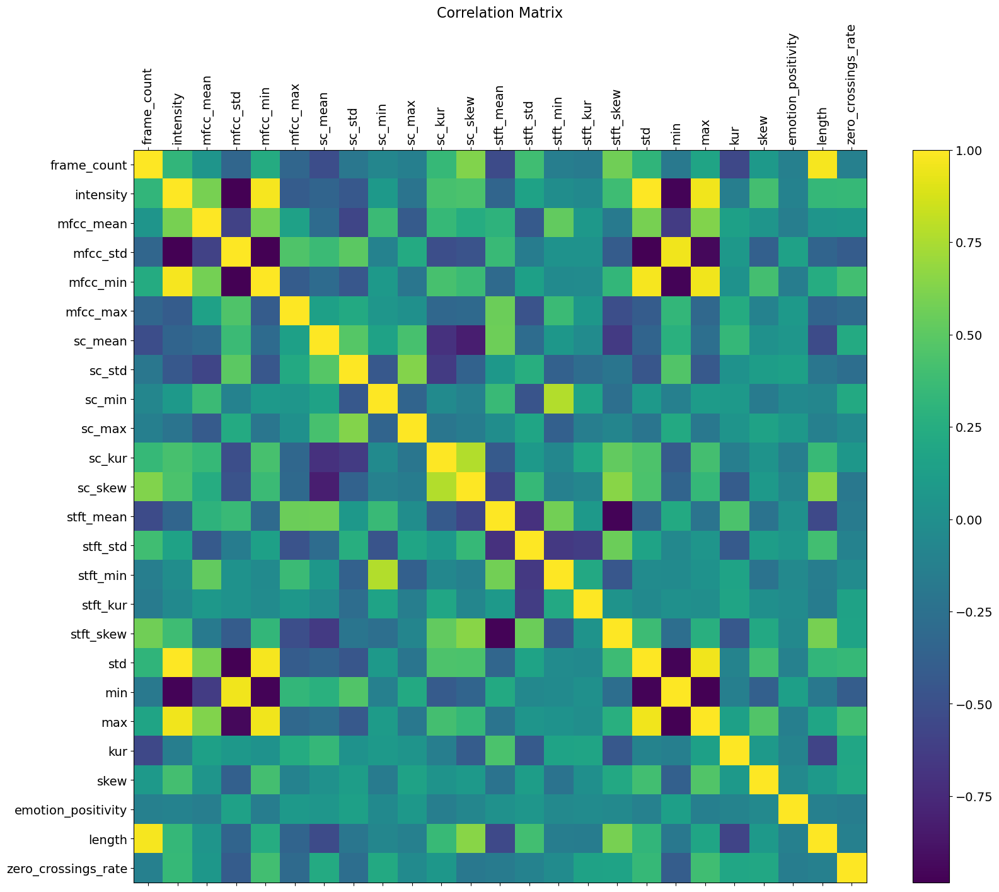

In [18]:
f = plt.figure(figsize=(19, 15))
plt.matshow(df_num.corr("spearman"), fignum=f.number)
plt.xticks(range(df_num.select_dtypes(['number']).shape[1]), df_num.select_dtypes(['number']).columns, fontsize=14, rotation=90)
plt.yticks(range(df_num.select_dtypes(['number']).shape[1]), df_num.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

In [19]:
corr = df_num[["intensity", "mfcc_min", "min"]].corr("spearman")
corr.style.background_gradient(cmap='coolwarm')

,intensity,mfcc_min,min
intensity,1.000000,0.972007,-0.961140
mfcc_min,0.972007,1.000000,-0.968147
min,-0.961140,-0.968147,1.000000


In [20]:
eps = 0.90
alg = "spearman"
print("CORRELATION > ",eps,":")
corr = (df_num.corr(alg))
for index, row in corr.iterrows():
    for k, v in row.items():
        if(v > eps and index != k):
            print(index, k, corr[index][k])
    
print("")
print("CORRELATION < -",eps,":")
neg_corr = (df_num.corr(alg))
for index, row in neg_corr.iterrows():
    for k, v in row.items():
        if(v  < -eps and index != k):
            print(index, k, v)

CORRELATION >  0.9 :
frame_count length 0.9694081506422678
intensity mfcc_min 0.9720070418854267
intensity std 0.9999988455591777
intensity max 0.9552185922229272
mfcc_std min 0.9547151225687327
mfcc_min intensity 0.9720070418854267
mfcc_min std 0.9724503071103804
mfcc_min max 0.9583612373172553
std intensity 0.9999988455591777
std mfcc_min 0.9724503071103804
std max 0.9544963167048637
min mfcc_std 0.9547151225687327
max intensity 0.9552185922229272
max mfcc_min 0.9583612373172553
max std 0.9544963167048637
length frame_count 0.9694081506422678

CORRELATION < - 0.9 :
intensity mfcc_std -0.9813062948153148
intensity min -0.9611396824111241
mfcc_std intensity -0.9813062948153148
mfcc_std mfcc_min -0.9779520449582015
mfcc_std std -0.9807939916108984
mfcc_std max -0.943372431555634
mfcc_min mfcc_std -0.9779520449582015
mfcc_min min -0.9681466324554384
stft_mean stft_skew -0.9678858272596078
stft_skew stft_mean -0.9678858272596078
std mfcc_std -0.9807939916108984
std min -0.961377185614126


In [21]:
correlation_drop_cols = ["std", "mfcc_min", "max", "mfcc_std", "stft_skew", "min", "frame_count"]
df_num = df_num.drop(columns=correlation_drop_cols)

In [22]:
df_norm = pd.DataFrame()
for v in df_num:
    df_norm[v] = zscore(df_num[v].dropna())
df_norm

,intensity,mfcc_mean,mfcc_max,sc_mean,sc_std,sc_min,sc_max,sc_kur,sc_skew,stft_mean,stft_std,stft_min,stft_kur,kur,skew,emotion_positivity,length,zero_crossings_rate
0,0.098457,-1.057340,-1.057499,0.711365,-0.064439,-1.086454,1.703404,0.038205,-0.276260,-0.734194,0.175121,-0.470414,0.155401,-0.271707,0.706632,-0.843294,-0.593700,1.620277
2,0.631358,-0.395268,-1.297313,-0.387835,-0.057416,-1.086454,0.176451,0.021814,0.250069,-1.164234,0.879278,-0.470414,0.023533,-0.955886,0.771504,1.589361,0.967652,0.986986
3,-1.348558,-1.634256,-0.351829,0.235821,1.185831,-1.086454,0.216732,-0.620262,-0.707327,-0.830805,1.227743,-0.470414,-0.932231,0.277804,-0.072046,1.589361,-0.760869,0.031052
4,0.758732,-0.591085,-1.463584,-0.027530,0.133143,-1.086454,0.194198,-0.043494,0.418278,-0.725426,0.811334,-0.470414,-0.561131,-0.562166,1.018217,1.589361,0.521312,0.316326
5,0.155406,-0.388191,0.557738,-1.050260,0.805921,-1.086454,0.231638,0.049107,0.585822,-1.528791,0.584186,-0.470414,0.707241,0.237831,0.168043,-0.843294,-0.872872,0.274410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2443,-1.126283,0.019361,-0.068684,-0.583105,0.512820,-1.086454,0.360201,0.320212,0.446676,0.211668,-0.329648,-0.470414,0.302232,0.742574,-1.038630,0.373033,-0.426532,-0.543516
2446,0.096286,0.888586,0.786280,-0.915396,-0.295000,0.567478,-0.636082,-0.585773,0.216862,-0.116744,0.401370,-0.238789,-0.843525,-0.948797,0.606874,-0.843294,1.525994,-0.439393
2448,-0.676684,-0.536015,0.831348,1.637291,1.423725,-1.086454,0.232993,-0.824295,-1.310056,1.395340,-1.053415,-0.470414,1.047797,1.710890,2.466580,0.373033,0.131810,-1.196080
2450,-0.961717,0.117993,0.794751,0.405295,0.397302,0.411457,0.150734,-0.564072,-0.402231,1.248063,-0.954492,-0.146330,-0.137849,0.401086,-0.137898,1.589361,-0.593700,-0.666520


## Fixing missing values

### Intensity 

In [21]:
df_m = df.copy()
v1 = df.iloc[6]['intensity']
nanv = str(v1)
def isNan(value):
    return str(value) == nanv

In [22]:
for lab, row in df_m.iterrows() :
    inte = row['intensity']
    if (row['emotional_intensity'] =='normal') and (isNan(inte) == True) :
        df_m.loc[lab, 'intensity'] = -40.578409
    if (row['emotional_intensity'] =='strong') and (isNan(inte) == True) :
        df_m.loc[lab, 'intensity'] = -34.271315

### Vocal channel

In [23]:
for lab, row in df_m.iterrows() :
    inte = row['intensity']
    if (row['emotion'] =='surprised') and (row['vocal_channel'] !='speech') :
        df_m.loc[lab, 'vocal_channel'] = 'speech'
    if (row['emotion'] =='disgust') and (row['vocal_channel'] !='speech') :
        df_m.loc[lab, 'vocal_channel'] = 'speech'

In [25]:
df_num2 = df_m.copy()
df_num2 = df_num2.drop(columns = ["vocal_channel", "emotion", "emotional_intensity", "statement", "repetition", "actor", "sex", "channels", "frame_width","mfcc_min", "max", "mfcc_std", "stft_skew", "min"])
df_num2 = df_num2.drop(columns = ['frame_count'])

## DBScan

In [25]:
def partition_df(df, attribute, drop_categorical = True, normalize = True):
    tmp = df.copy()
    ret = {}
    to_delete = ["vocal_channel", "emotion", "emotional_intensity", "statement", "repetition", "actor", "sex", "channels", "frame_width", "emotion_positivity"]
    partitions = tmp[attribute].unique()
    for p in partitions:
        ret[p] = df[(tmp[attribute] == p)]
        #for v in ret[p]:
        #    if(v in outliers_to_remove)
        #        ret[p][v] = clean_outliers(tmp, v)
        if(drop_categorical):
            ret[p] = ret[p].drop(columns = to_delete)
            if(normalize):
                for v in ret[p]:
                    ret[p][v] = zscore(ret[p][v].dropna())
                
    return ret

In [24]:
#df_part = df_norm.copy()
#df_part["sex"] = df["sex"]
#df_part["emotion_positivity"] = df["emotion_positivity"]
#df_part["emotional_intensity"] = df["emotional_intensity"]
#df_part.T

,0,2,3,4,5,7,8,13,14,15,...,2438,2439,2440,2441,2442,2443,2446,2448,2450,2451
intensity,0.098457,0.631358,-1.348558,0.758732,0.155406,-1.357459,-0.98013,-2.026256,-0.733545,0.245707,...,-1.305177,-0.728685,-0.743336,1.297006,0.960133,-1.126283,0.096286,-0.676684,-0.961717,-0.283181
mfcc_mean,-1.05734,-0.395268,-1.634256,-0.591085,-0.388191,-1.631794,-1.150014,-1.356778,-2.116519,-0.823284,...,-0.28937,0.517484,0.538685,1.758138,1.340825,0.019361,0.888586,-0.536015,0.117993,-0.056054
mfcc_max,-1.057499,-1.297313,-0.351829,-1.463584,0.557738,0.815532,0.325027,-1.740848,-1.164866,-0.833014,...,1.118028,1.330328,1.454646,0.094798,0.141431,-0.068684,0.78628,0.831348,0.794751,0.782607
sc_mean,0.711365,-0.387835,0.235821,-0.02753,-1.05026,1.045826,1.347705,0.355325,-0.966208,-0.248378,...,2.019462,0.607517,0.298355,-1.30103,-1.430158,-0.583105,-0.915396,1.637291,0.405295,1.042934
sc_std,-0.064439,-0.057416,1.185831,0.133143,0.805921,0.641629,1.118575,-0.731186,0.082613,0.261168,...,0.402658,-0.169445,-0.512277,-1.159617,-0.372066,0.51282,-0.295,1.423725,0.397302,1.030862
sc_min,-1.086454,-1.086454,-1.086454,-1.086454,-1.086454,-1.086454,-1.086454,-1.086454,-1.086454,-1.086454,...,0.530083,0.358332,0.651561,0.160336,0.841591,-1.086454,0.567478,-1.086454,0.411457,-1.086454
sc_max,1.703404,0.176451,0.216732,0.194198,0.231638,0.168743,0.249858,0.198487,0.177374,0.274089,...,0.147046,-1.157523,-0.070086,-1.458047,0.150421,0.360201,-0.636082,0.232993,0.150734,0.367565
sc_kur,0.038205,0.021814,-0.620262,-0.043494,0.049107,-0.801472,-0.815632,1.160545,0.774579,-0.049919,...,-0.523679,-0.658453,-0.474603,0.77202,1.850079,0.320212,-0.585773,-0.824295,-0.564072,-0.626587
sc_skew,-0.27626,0.250069,-0.707327,0.418278,0.585822,-1.306701,-1.19318,1.253786,1.385199,0.580027,...,-1.83907,-1.645892,-1.134505,1.262319,2.213627,0.446676,0.216862,-1.310056,-0.402231,-0.569138
stft_mean,-0.734194,-1.164234,-0.830805,-0.725426,-1.528791,0.138848,0.717073,0.232318,-1.549968,-0.810788,...,2.204723,1.877179,1.167588,0.151425,-0.500596,0.211668,-0.116744,1.39534,1.248063,0.958383


#### Partition 1: Sex 

In [29]:
#Dataframe with Feminine values
df_F= partition_df(df,"sex")['F'].drop(columns = "intensity")
df_F.T

,0,1,2,3,4,5,6,7,8,9,...,2377,2378,2379,2380,2381,2382,2383,2384,2385,2386
frame_count,-0.447352,-0.227907,0.781546,-0.578997,0.430428,-0.666797,-0.403480,-0.842343,-0.403452,0.386556,...,0.430428,0.957091,1.439881,0.825446,0.035438,-0.140107,-0.403452,0.298783,1.000991,0.957119
mfcc_mean,-0.564283,0.428443,0.171690,-1.205596,-0.045984,0.179558,0.260225,-1.202860,-0.667302,0.438364,...,-0.155584,-0.346370,-1.701679,-0.709245,-1.155978,0.609698,0.818324,-0.265836,-0.687440,-1.187868
mfcc_std,0.007035,-0.198926,-0.392008,1.245515,-0.611903,-0.095378,0.246755,1.637110,1.219455,-0.873332,...,-0.011629,-0.182038,1.200591,-0.045624,1.444734,0.044743,-0.719906,-0.077410,-0.067910,0.435884
mfcc_min,-0.090621,0.317265,0.197833,-0.958296,0.448647,0.266031,-0.209019,-1.626449,-1.317477,0.990447,...,-0.001003,0.139113,-1.431459,0.059361,-1.419819,-0.339581,0.737546,-0.010649,-0.094938,-0.502926
mfcc_max,-0.550233,0.853898,-0.812980,0.222922,-0.995153,1.219472,1.836693,1.501919,0.964506,-0.707155,...,0.436365,-0.115507,-1.051944,-0.576484,-0.439749,1.178350,0.064913,-0.906469,-0.735161,-1.005997
sc_mean,0.760878,-0.013641,-0.491266,0.219167,-0.080827,-1.245861,0.664146,1.141876,1.485759,0.362709,...,-1.023987,-0.433322,0.387850,-1.386535,0.758231,0.236568,0.487081,0.190730,0.262040,-1.450500
sc_std,-0.190105,1.211669,-0.182090,1.236704,0.035376,0.803150,1.148494,0.615660,1.159951,0.348969,...,-0.307291,-0.533439,0.679473,0.272798,-0.191123,-0.244547,-0.198424,-0.365693,0.203930,-0.755195
sc_min,-0.744726,-0.744726,-0.744726,-0.744726,-0.744726,-0.744726,-0.744726,-0.744726,-0.744726,1.120001,...,-0.744726,-0.744726,1.704934,-0.744726,-0.744726,-0.744726,1.811166,-0.744726,1.564361,-0.744726
sc_max,1.575577,-0.039764,-0.031946,0.010461,-0.013263,0.026153,0.840310,-0.040061,0.045334,-0.040068,...,0.220424,0.127516,0.027763,-0.134756,-0.040068,0.034924,0.009216,-0.014816,0.374725,-0.040068
sc_kur,0.063234,-0.721779,0.045286,-0.657822,-0.026230,0.075172,-0.669262,-0.856257,-0.871763,-0.257467,...,0.489113,0.531904,-0.440668,0.144551,0.112725,0.255264,-0.059393,0.665844,-0.728463,1.617778


In [30]:
#Dataframe with Masculine values
df_M= partition_df(df,"sex")['M'].drop(columns = "intensity")
df_M.T

,67,68,69,70,71,72,73,74,75,76,...,2442,2443,2444,2445,2446,2447,2448,2449,2450,2451
frame_count,0.579976,0.104006,0.493417,0.926134,2.397269,-0.415216,-0.674841,0.493417,0.753068,-0.198871,...,1.142479,-0.198871,-0.631561,-0.977691,1.315544,0.796321,0.233819,1.618421,-0.328683,-0.198871
mfcc_mean,0.178369,-0.481146,-1.045196,0.067810,0.168401,-0.971308,-1.565576,-1.146638,-0.012461,1.149042,...,1.036681,-0.653581,0.181258,0.168568,0.458230,-1.095935,-1.363954,0.076865,-0.527423,-0.750044
mfcc_std,0.106340,-0.086520,0.329858,0.219399,0.187579,0.859515,0.909231,0.741835,-0.507741,-1.153663,...,-1.255148,0.761054,0.895791,0.399613,-0.031734,0.974374,0.908424,-0.040623,1.028176,0.501159
mfcc_min,-0.129861,0.535279,-0.112366,-0.261746,-0.368459,-0.873517,-0.635944,-0.797337,0.398753,0.872713,...,1.151622,-0.904579,-0.512463,-0.281429,-0.113532,-0.870750,-0.556386,0.030242,-0.995997,-0.290242
mfcc_max,-0.044382,-0.371663,-1.047424,-0.900275,0.883796,0.737016,-0.018845,0.151884,-0.661709,-1.741733,...,-0.519247,-0.795955,1.931024,0.073975,0.329978,-0.249460,0.389329,1.136249,0.341133,0.325141
sc_mean,-0.209797,0.804424,1.592475,-0.457178,-2.035224,0.398162,1.956198,0.461365,0.014817,-1.262054,...,-1.258056,-0.490450,0.488116,-0.504968,-0.791575,0.780061,1.521691,-0.496379,0.405246,0.983080
sc_std,0.481330,0.678427,0.423690,0.026109,-0.047508,1.319415,0.691560,1.344484,-0.130791,-2.234027,...,-0.249257,0.557124,-0.012610,-0.397235,-0.179028,1.265576,1.387215,1.449685,0.451854,1.029206
sc_min,0.422197,-1.619072,0.686415,0.457121,-1.619072,-1.619072,-1.619072,0.687915,0.835649,0.278280,...,0.638762,-1.619072,0.267613,-0.439709,0.317762,-1.619072,-1.619072,-1.619072,0.135055,-1.619072
sc_max,0.355510,0.510245,1.824026,-0.030752,1.719298,1.221526,0.470579,0.414001,0.381741,-1.931897,...,0.347636,0.556041,-0.787000,-0.702482,-0.433718,0.573980,0.429666,0.570681,0.347946,0.563358
sc_kur,-0.393402,-0.000459,-0.405069,-0.132421,1.784288,-0.635451,-0.291989,-1.001489,-0.322039,2.913969,...,1.700623,0.279867,-0.663046,-0.075635,-0.561503,-0.741293,-0.783013,-0.333443,-0.541349,-0.599406


In [93]:
col_df_F = list(df_F.columns)
pairs = []
l = len(col_df_F)
for i in range(l):
    for j in range(i+1,l):
        pairs.append([col_df_F[i],col_df_F[j]])
pairs

[['frame_count', 'mfcc_mean'],
 ['frame_count', 'mfcc_std'],
 ['frame_count', 'mfcc_min'],
 ['frame_count', 'mfcc_max'],
 ['frame_count', 'sc_mean'],
 ['frame_count', 'sc_std'],
 ['frame_count', 'sc_min'],
 ['frame_count', 'sc_max'],
 ['frame_count', 'sc_kur'],
 ['frame_count', 'sc_skew'],
 ['frame_count', 'stft_mean'],
 ['frame_count', 'stft_std'],
 ['frame_count', 'stft_min'],
 ['frame_count', 'stft_kur'],
 ['frame_count', 'stft_skew'],
 ['frame_count', 'std'],
 ['frame_count', 'min'],
 ['frame_count', 'max'],
 ['frame_count', 'kur'],
 ['frame_count', 'skew'],
 ['frame_count', 'length'],
 ['frame_count', 'zero_crossings_rate'],
 ['mfcc_mean', 'mfcc_std'],
 ['mfcc_mean', 'mfcc_min'],
 ['mfcc_mean', 'mfcc_max'],
 ['mfcc_mean', 'sc_mean'],
 ['mfcc_mean', 'sc_std'],
 ['mfcc_mean', 'sc_min'],
 ['mfcc_mean', 'sc_max'],
 ['mfcc_mean', 'sc_kur'],
 ['mfcc_mean', 'sc_skew'],
 ['mfcc_mean', 'stft_mean'],
 ['mfcc_mean', 'stft_std'],
 ['mfcc_mean', 'stft_min'],
 ['mfcc_mean', 'stft_kur'],
 ['mfcc

## Kth neighbor distance algorithm 

In [106]:
def dis_N_Minp(df, k):
    dist = pdist(df, 'euclidean')
    dist = squareform(dist)
    kth_distances = []
    for d in dist:  # d is a vector containing distances between the ith record and all the others
        index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
        kth_distances.append(d[index_kth_distance])  # store the distance in a list
    return kth_distances

In [107]:
def SilCurve(listv,df,k):
    dist_F = dis_N_Minp(df,k)
    plt.figure(figsize=(10,8))
    plt.plot(range(0, len(dist_F)), sorted(dist_F))
    plt.ylabel('distance from the {}th neighbor'.format(k))
    plt.title("{} vs {}".format(listv[0],listv[1]))
    plt.grid()         
    plt.show()

In [108]:
def Optimal_EpsMinP(MinP1,MinP2,eps1,eps2,step_eps,df):
    min_samples = np.arange(MinP1,MinP2,5)
    eps = np.arange(eps1,eps2, step_eps)
    output = []
    for ms in min_samples:
        for ep in eps:
            labels = DBSCAN(eps = ep, min_samples=ms).fit(df).labels_
            n_l = len(set(labels))
#            print([ms, eps,n_l])
#        if  n_l!= 2 and  n_l != 1:
            score = silhouette_score(df, labels)
            output.append((ms, ep, score))
    
    min_samples, eps, score = sorted(output, key=lambda x:x[-1])[-1]
    return (score, min_samples,round(eps,2))

## DBScan algorithm

In [69]:
def DBScanTest(var1,var2,eps_,minP):
    df_train = df_F[[var1,var2]]
    
    dbscan = DBSCAN(eps=eps_, min_samples=minP, metric='euclidean')
    dbscan.fit(df_train)

    hist, bins = np.histogram(dbscan.labels_, bins=range(-1, len(set(dbscan.labels_)) + 1))

    labels_c = dict(zip(bins, hist))
    
    df_clusters = df_train.copy()
    df_clusters['Labels'] = dbscan.labels_

    sns.scatterplot(data=df_clusters, x=var1, y=var2, hue=dbscan.labels_, 
    style=dbscan.labels_, palette="bright")
    plt.show()

#### 1. Analysis for Frame Count

['frame_count', 'mfcc_mean']


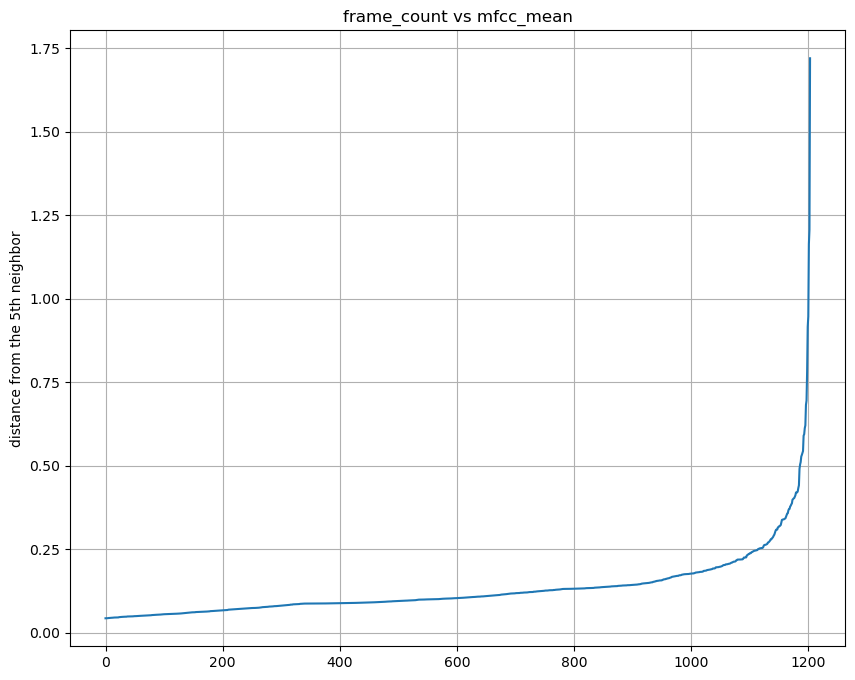

['frame_count', 'mfcc_std']


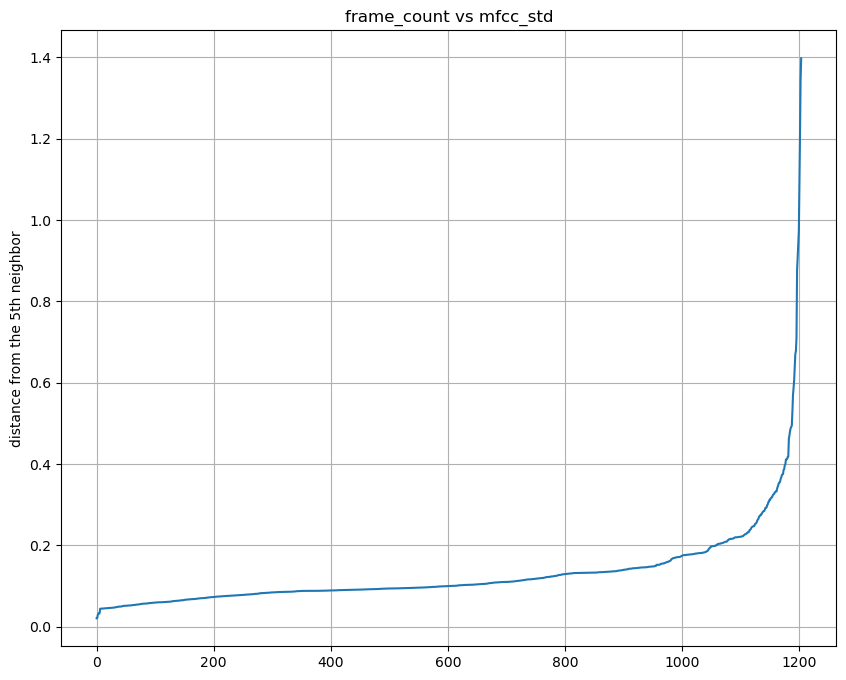

['frame_count', 'mfcc_min']


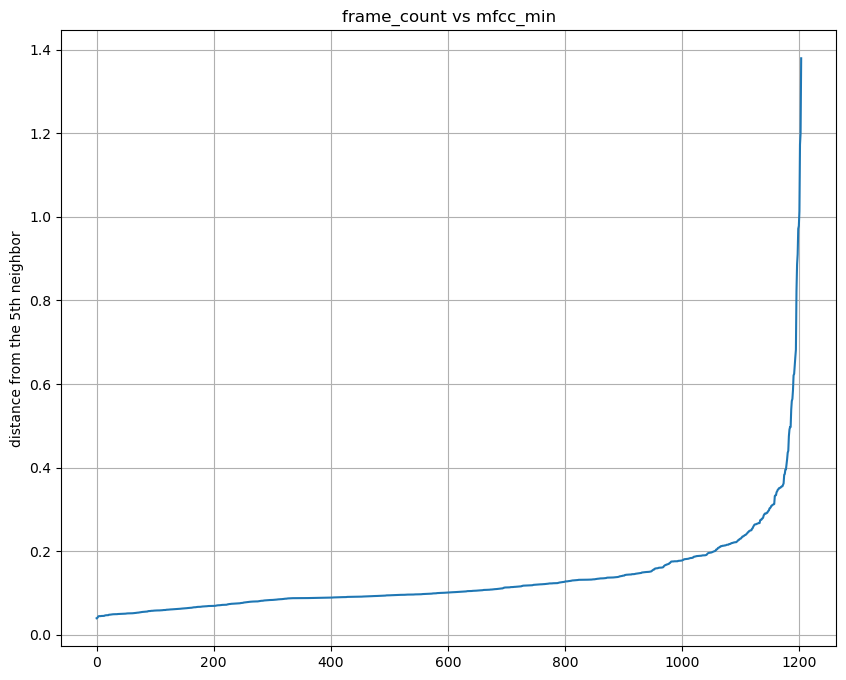

['frame_count', 'mfcc_max']


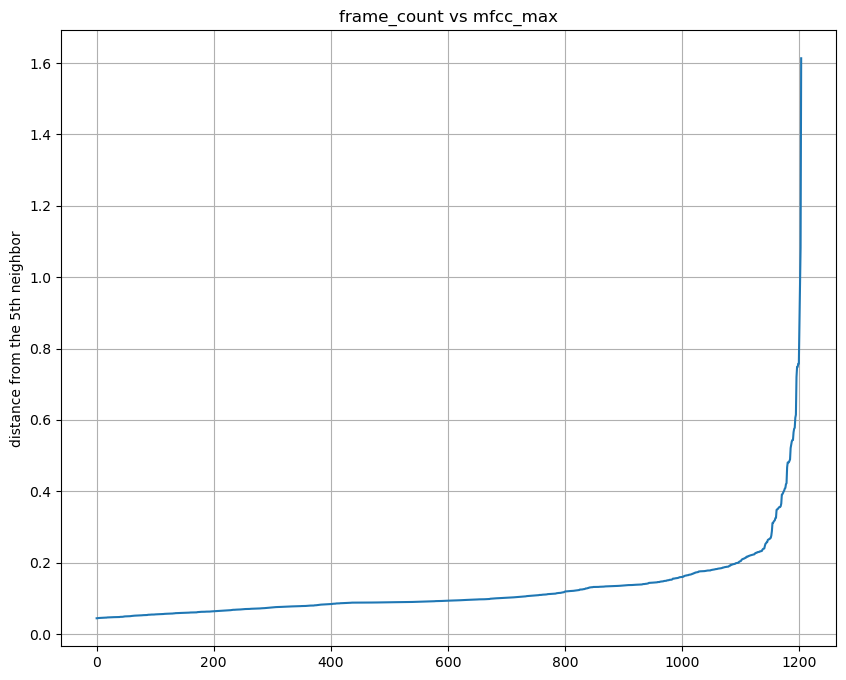

['frame_count', 'sc_mean']


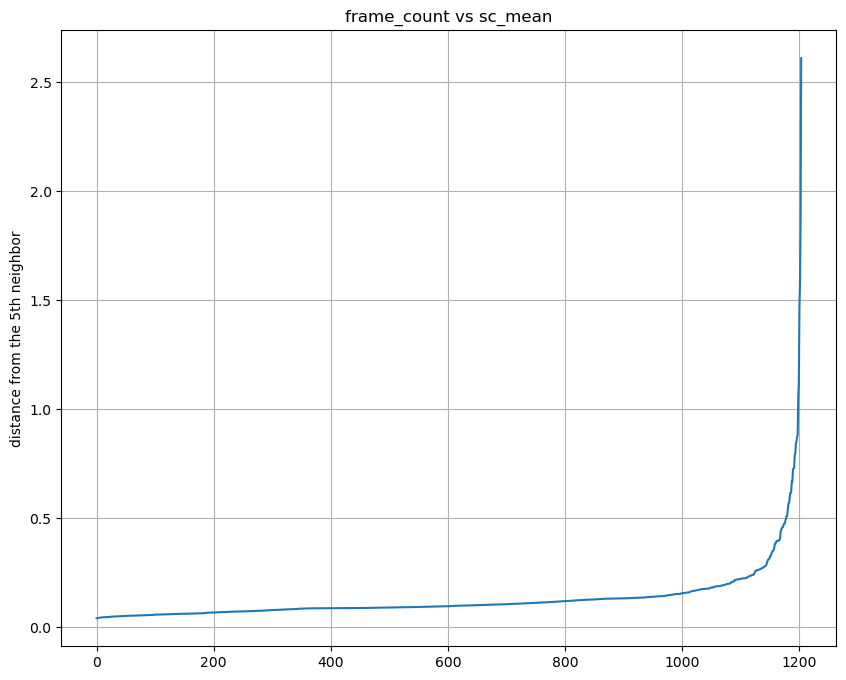

['frame_count', 'sc_std']


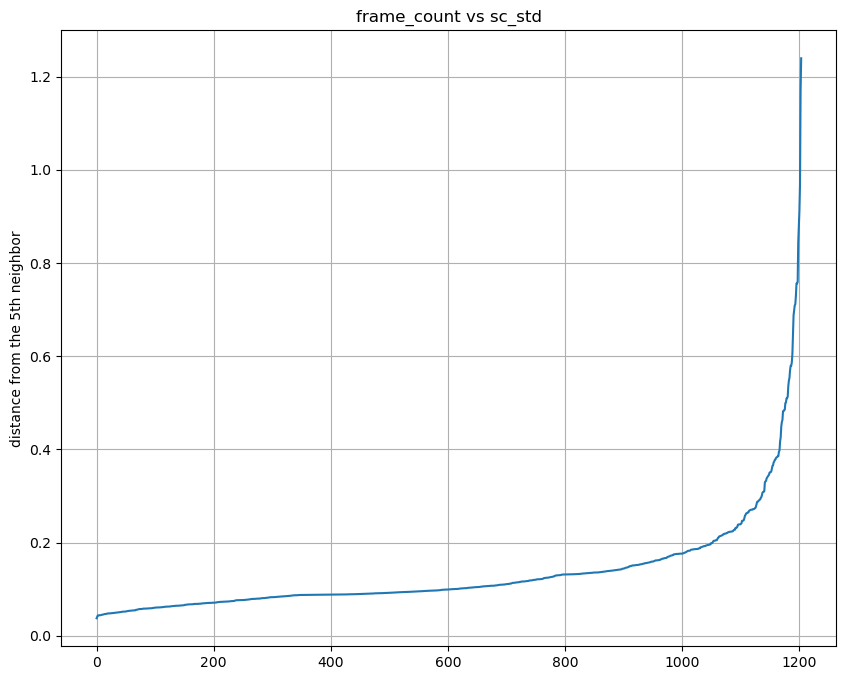

['frame_count', 'sc_min']


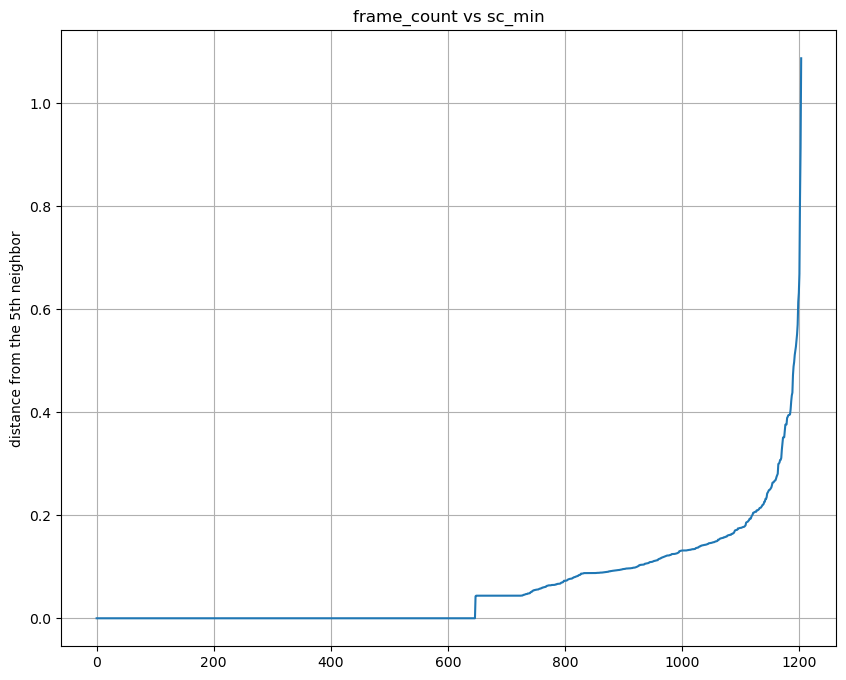

['frame_count', 'sc_max']


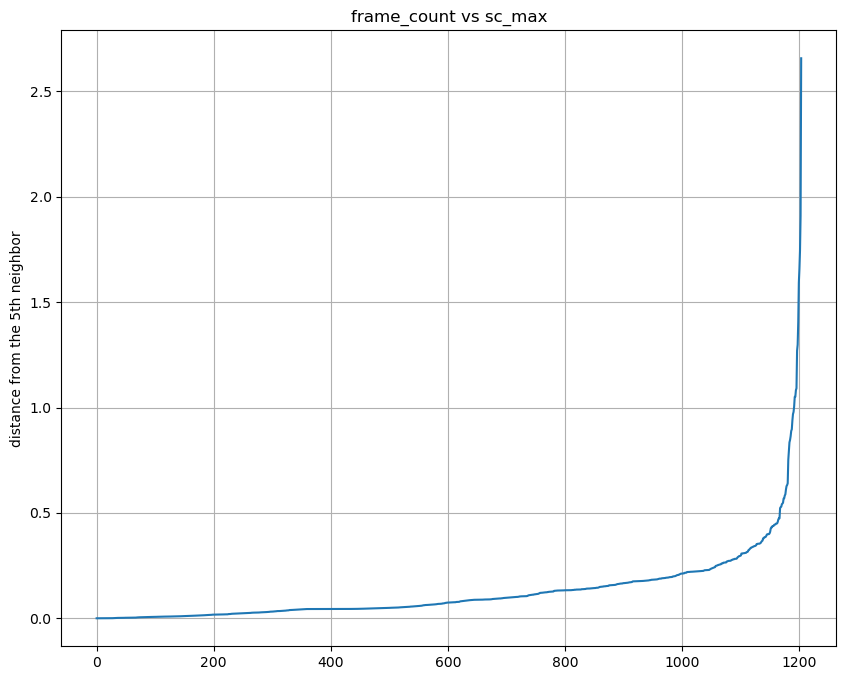

['frame_count', 'sc_kur']


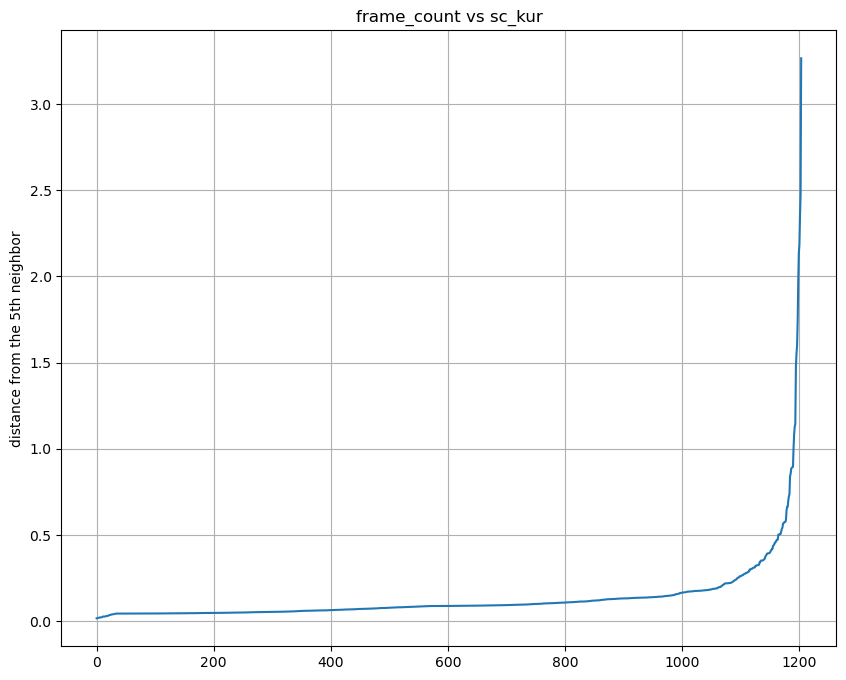

['frame_count', 'sc_skew']


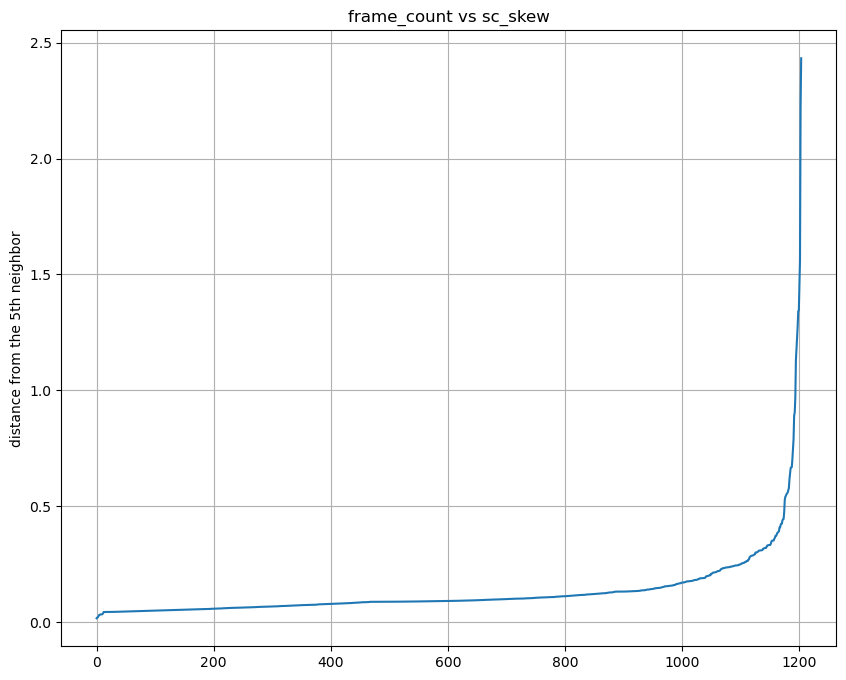

['frame_count', 'stft_mean']


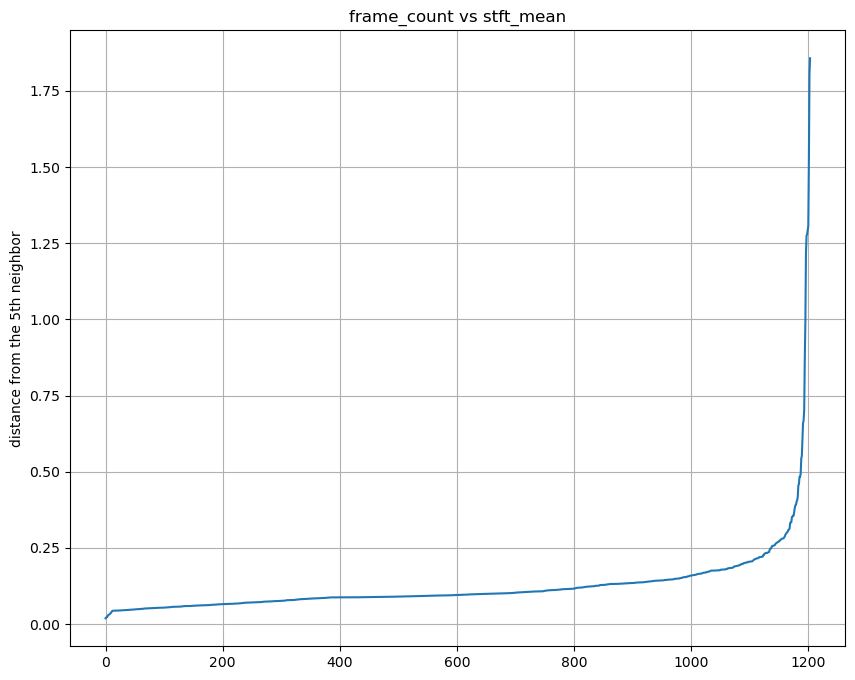

['frame_count', 'stft_std']


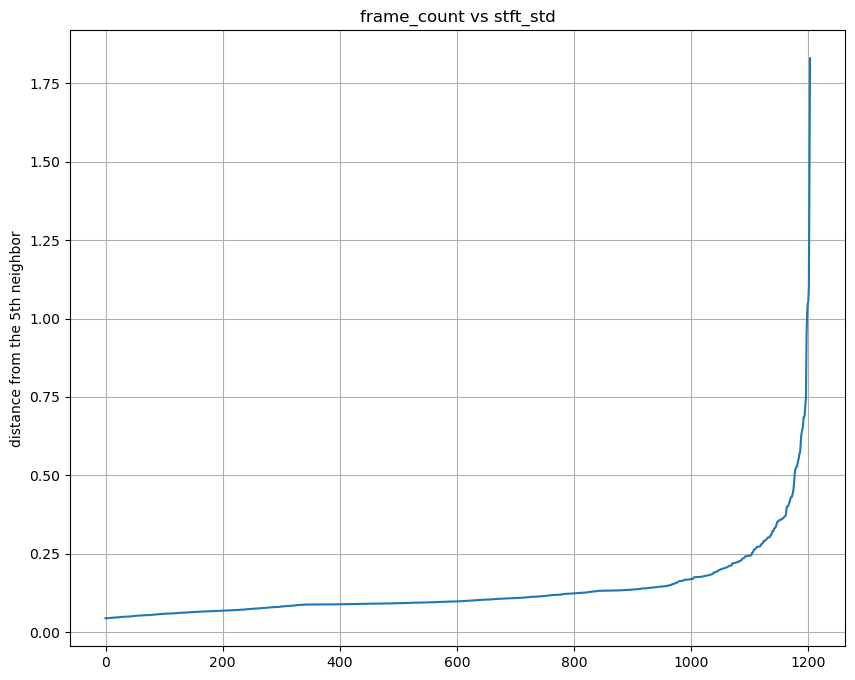

['frame_count', 'stft_min']


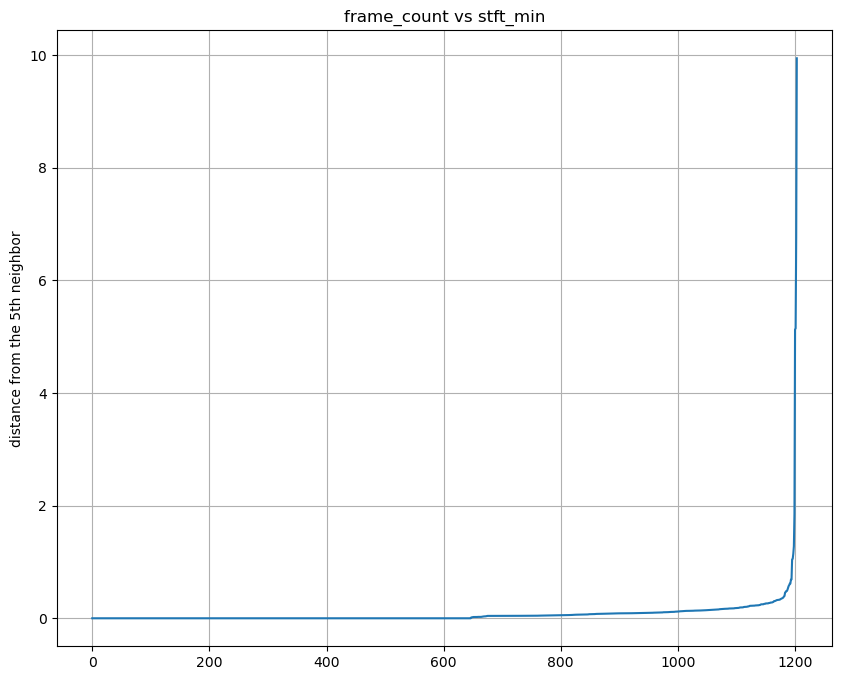

['frame_count', 'stft_kur']


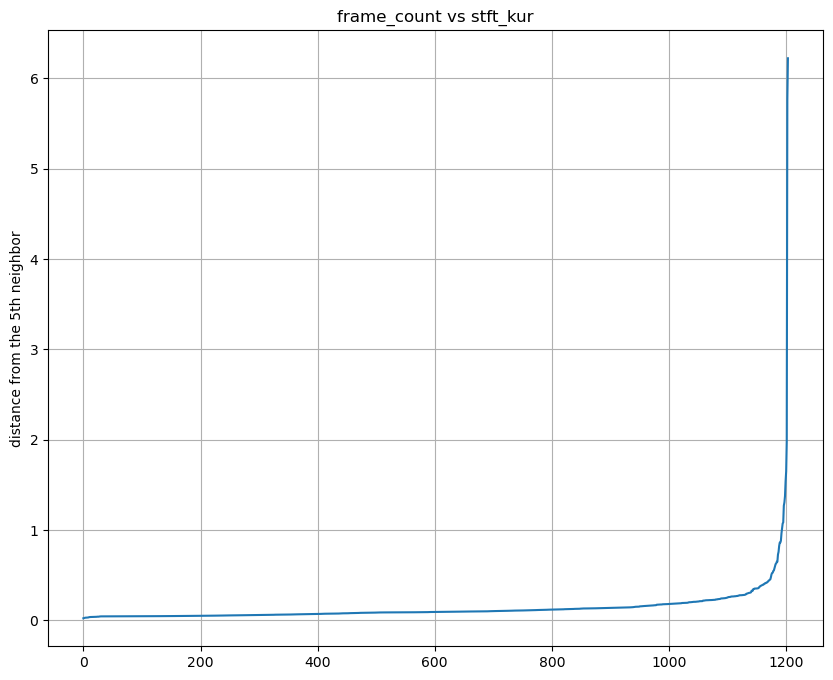

['frame_count', 'stft_skew']


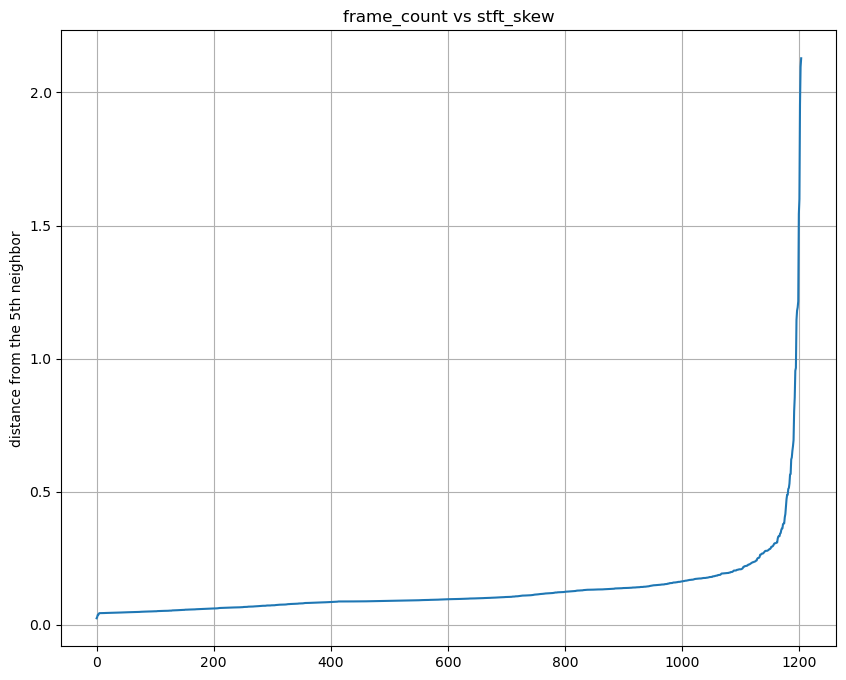

['frame_count', 'std']


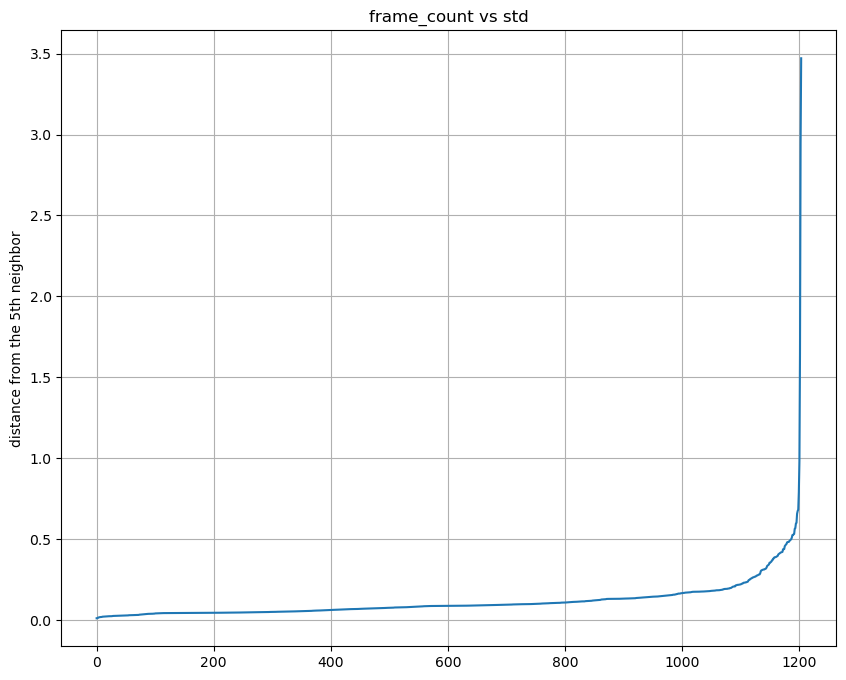

['frame_count', 'min']


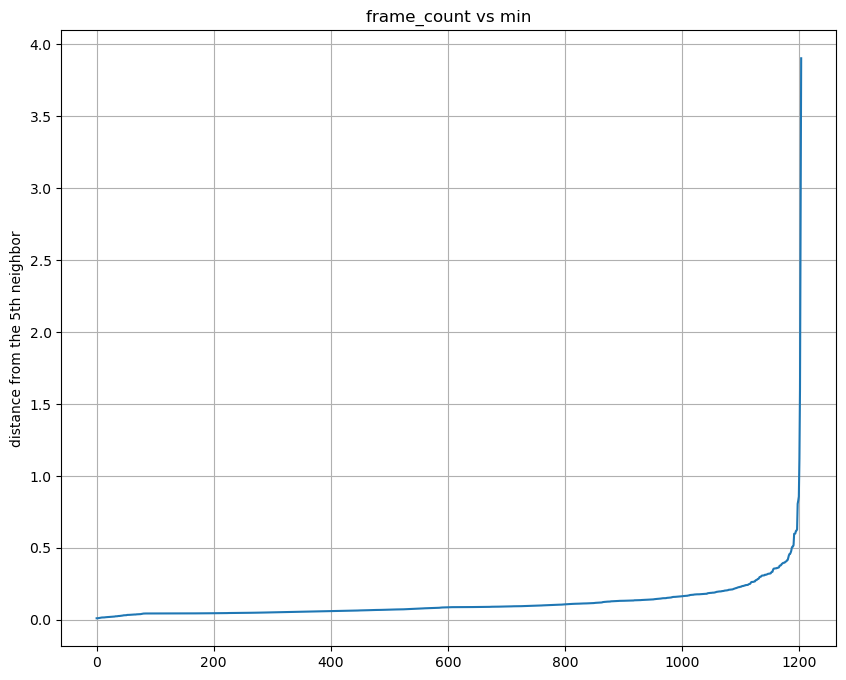

['frame_count', 'max']


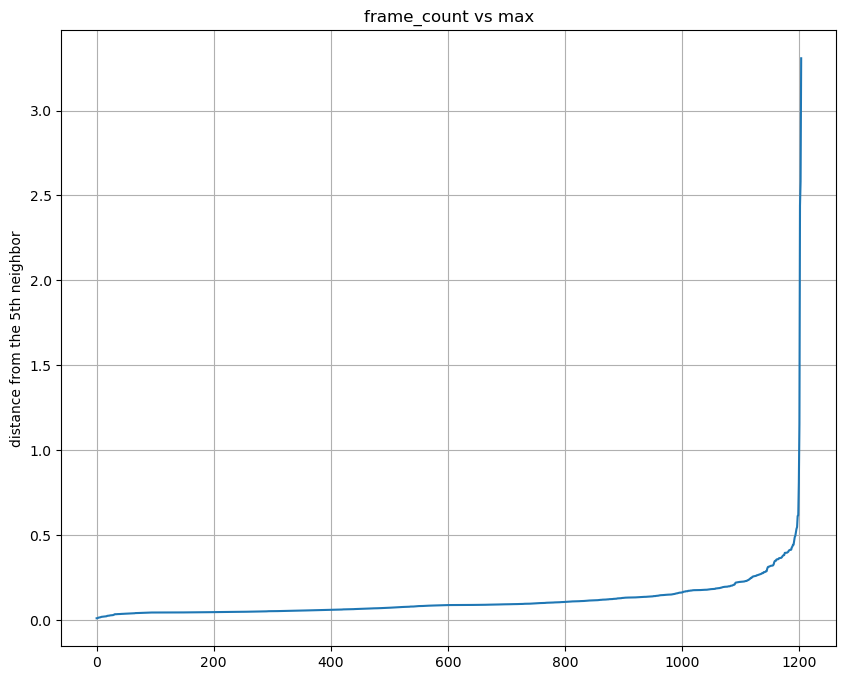

['frame_count', 'kur']


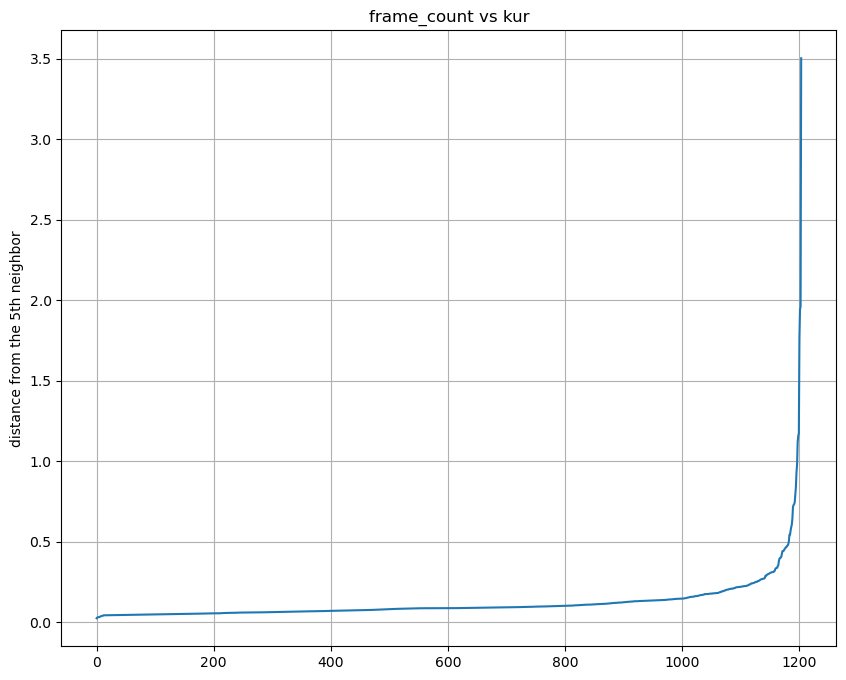

['frame_count', 'skew']


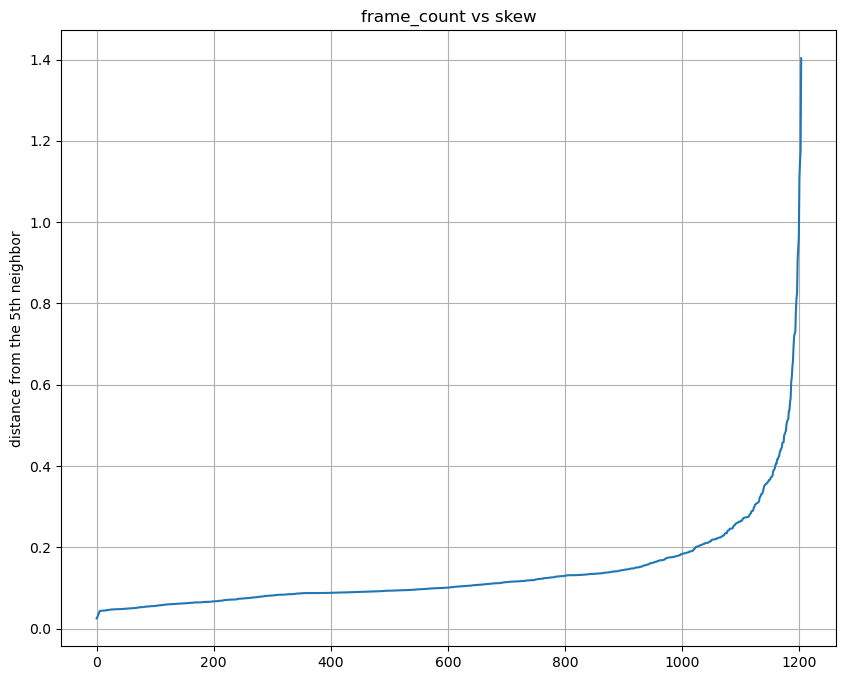

['frame_count', 'length']


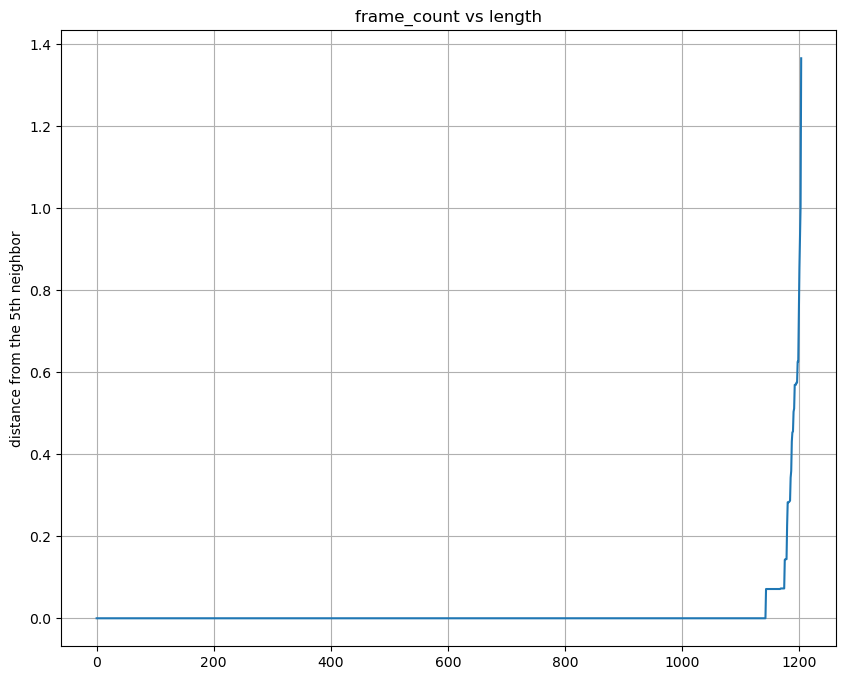

['frame_count', 'zero_crossings_rate']


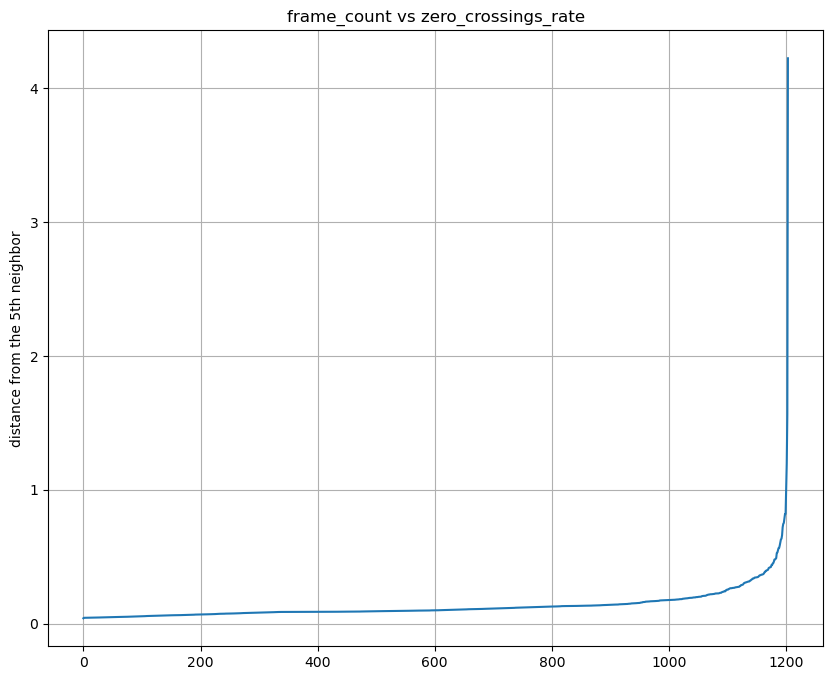

In [178]:
for pairs_ in pairs[0:22]:
    print(pairs_)
    df_train=df_F[pairs_]
    SilCurve(pairs_,df_train,5)

In [124]:
EpsMinP_values =[]
EpsMinP_values.append(Optimal_EpsMinP(3,15,0.1,0.5,0.1,df_F[['frame_count','mfcc_mean']]))
print('frame_count & mfcc_mean: ', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.5,0.1,df_F[['frame_count','mfcc_std']]))
print('frame_count & mfcc_std',EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.5,0.1,df_F[['frame_count','mfcc_min']]))
print('frame_count & mfcc_min', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.5,0.1,df_F[['frame_count','mfcc_max']]))
print('frame_count & mfcc_max', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.9,0.1,df_F[['frame_count','sc_mean']]))
print('frame_count & sc_mean', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.5,0.1,df_F[['frame_count','sc_std']]))
print('frame_count & sc_std', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.5,0.1,df_F[['frame_count','sc_min']]))
print('frame_count & sc_min', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.8,0.1,df_F[['frame_count','sc_max']]))
print('frame_count & sc_max', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.2,0.8,0.1,df_F[['frame_count','sc_kur']]))
print('frame_count & sc_kur', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.2,0.8,0.1,df_F[['frame_count','sc_skew']]))
print('frame_count & sc_skew', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.2,0.75,0.1,df_F[['frame_count', 'stft_mean']]))
print('frame_count & stft_mean', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.15,0.75,0.1,df_F[['frame_count', 'stft_std']]))
print('frame_count & stft_std', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.1,1.2,0.1,df_F[['frame_count', 'stft_min']]))
print('frame_count & stft_min', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.1,1,0.1,df_F[['frame_count', 'stft_kur']]))
print('frame_count & stft_kur',EpsMinP_values[-1] )
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.2,0.75,0.1,df_F[['frame_count', 'stft_skew']]))
print('frame_count & stft_skew', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.1,0.6,0.1,df_F[['frame_count', 'std']]))
print('frame_count & std',EpsMinP_values[-1] )
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.1,0.6,0.1,df_F[['frame_count', 'min']]))
print('frame_count & min',EpsMinP_values[-1] )
EpsMinP_values.append(Optimal_EpsMinP(3,30,0.1,0.6,0.1,df_F[['frame_count', 'max']]))
print('frame_count & max', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,25,0.1,0.8,0.1,df_F[['frame_count', 'kur']]))
print('frame_count & kur',EpsMinP_values[-1] )
EpsMinP_values.append(Optimal_EpsMinP(3,20,0.1,0.7,0.1,df_F[['frame_count', 'skew']]))
print('frame_count & skew', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,25,0.1,0.6,0.1,df_F[['frame_count', 'length']]))
print('frame_count & length', EpsMinP_values[-1])
EpsMinP_values.append(Optimal_EpsMinP(3,20,0.1,0.9,0.1,df_F[['frame_count', 'zero_crossings_rate']]))
print('frame_count & zero_crossing_rate', EpsMinP_values[-1])

frame_count & mfcc_mean:  (0.6596893644988693, 8, 0.4)
frame_count & mfcc_std (0.6575334339164459, 13, 0.45)
frame_count & mfcc_min (0.6307490712835843, 13, 0.45)
frame_count & mfcc_max (0.6731925892497006, 8, 0.45)
frame_count & sc_mean (0.716447828444852, 3, 0.85)
frame_count & sc_std (0.6483856923129148, 8, 0.45)
frame_count & sc_min (0.5695668621899053, 3, 0.45)
frame_count & sc_max (0.7115195874893001, 3, 0.75)
frame_count & sc_kur (0.7490012099733172, 13, 0.8)
frame_count & sc_skew (0.709161154030907, 13, 0.8)
frame_count & stft_mean (0.7241696411852079, 3, 0.7)
frame_count & stft_std (0.6909246765197012, 13, 0.65)
frame_count & stft_min (0.8083141835864147, 18, 1.1)
frame_count & stft_kur (0.7389958099095005, 18, 0.9)
frame_count & stft_skew (0.7094822036447282, 13, 0.7)
frame_count & std (0.7149269913728606, 3, 0.5)
frame_count & min (0.7292659808972625, 3, 0.5)
frame_count & max (0.7117460907822644, 8, 0.5)
frame_count & kur (0.7229974858742488, 18, 0.7)
frame_count & skew (0.

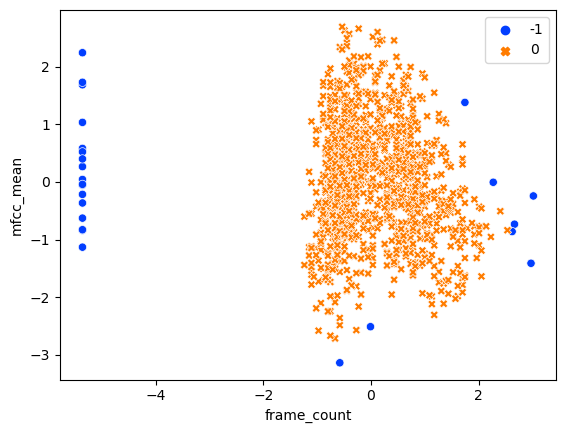

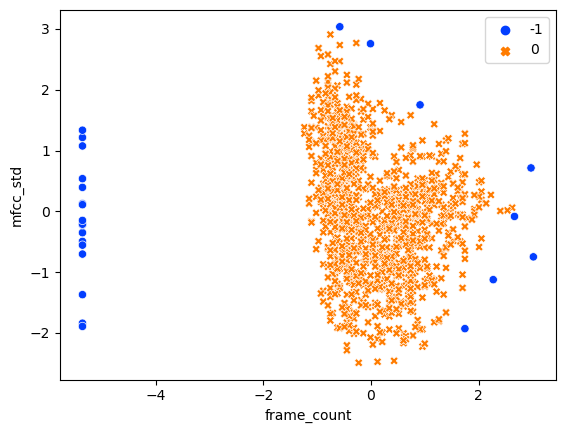

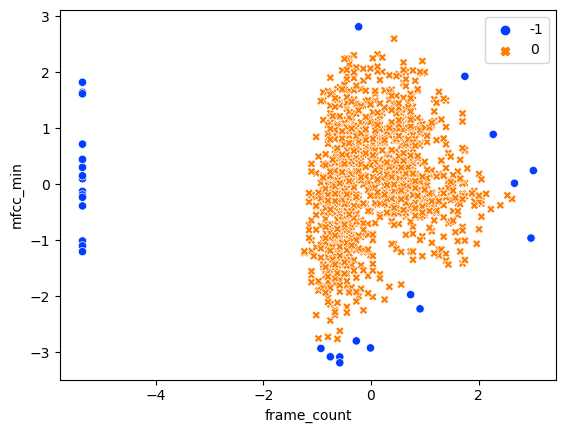

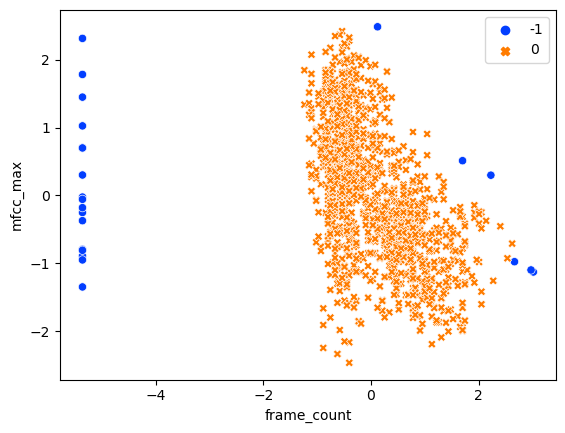

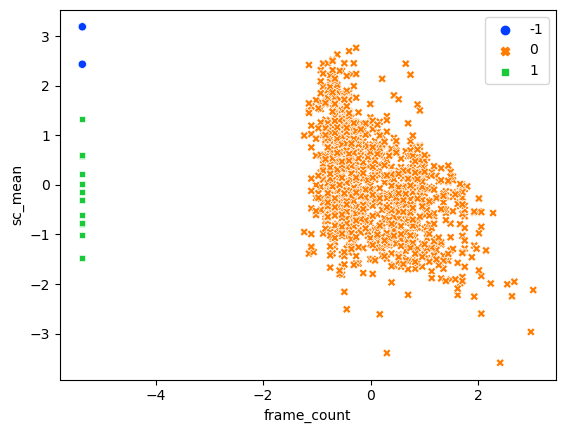

...

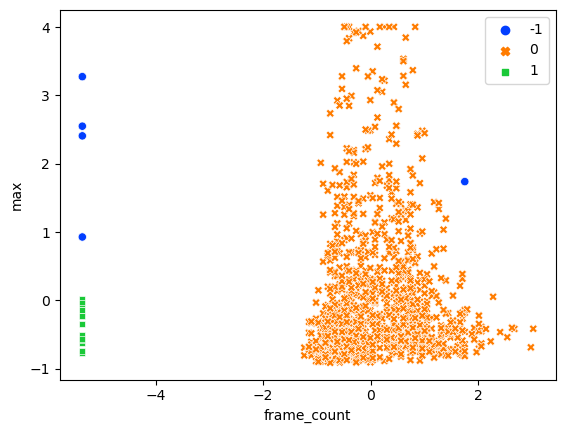

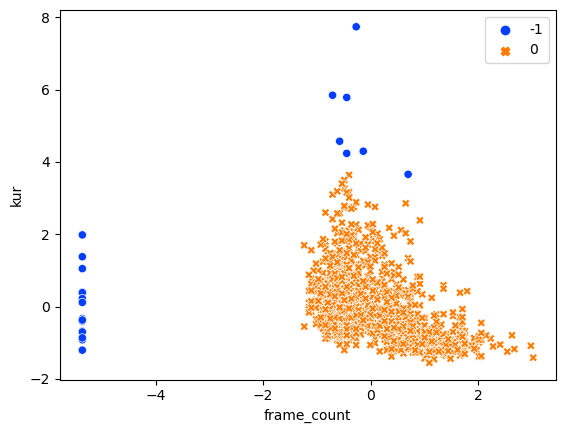

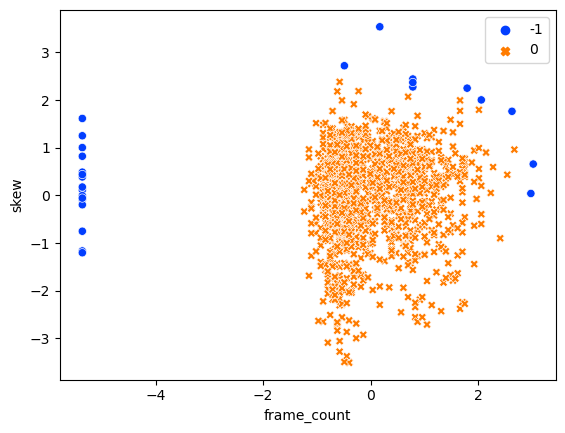

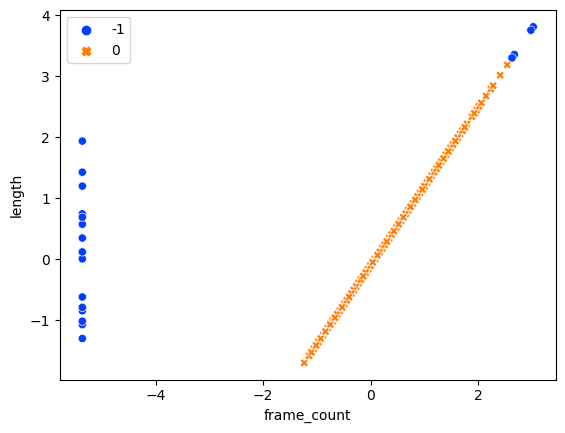

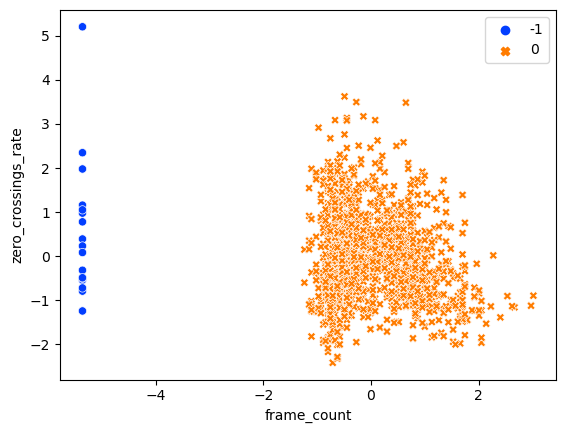

In [128]:
for i in range(22) :
    DBScanTest(pairs[i][0],pairs[i][1],EpsMinP_values[i][2],EpsMinP_values[i][1])

#### 1. Analysis for mfcc_mean 

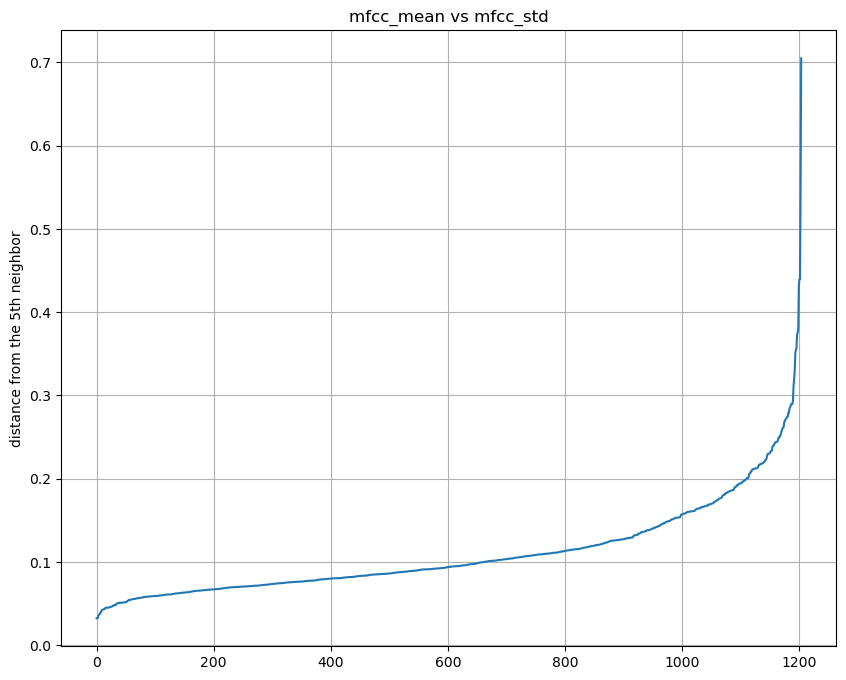

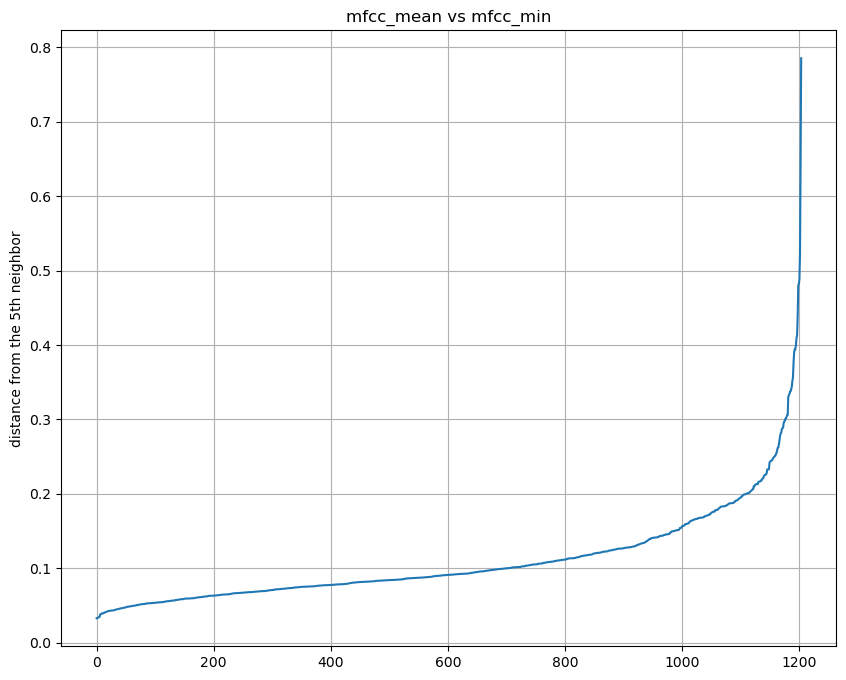

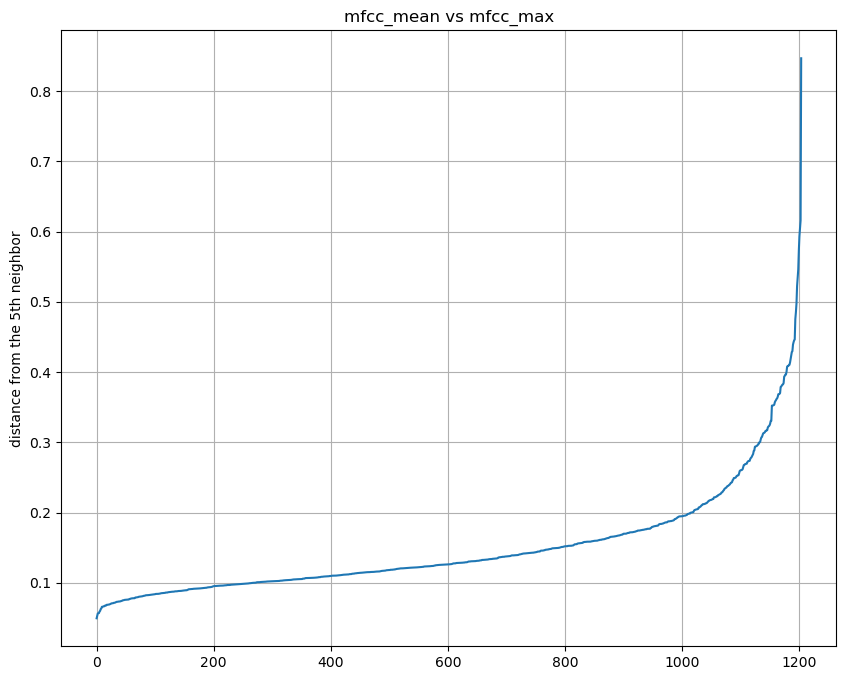

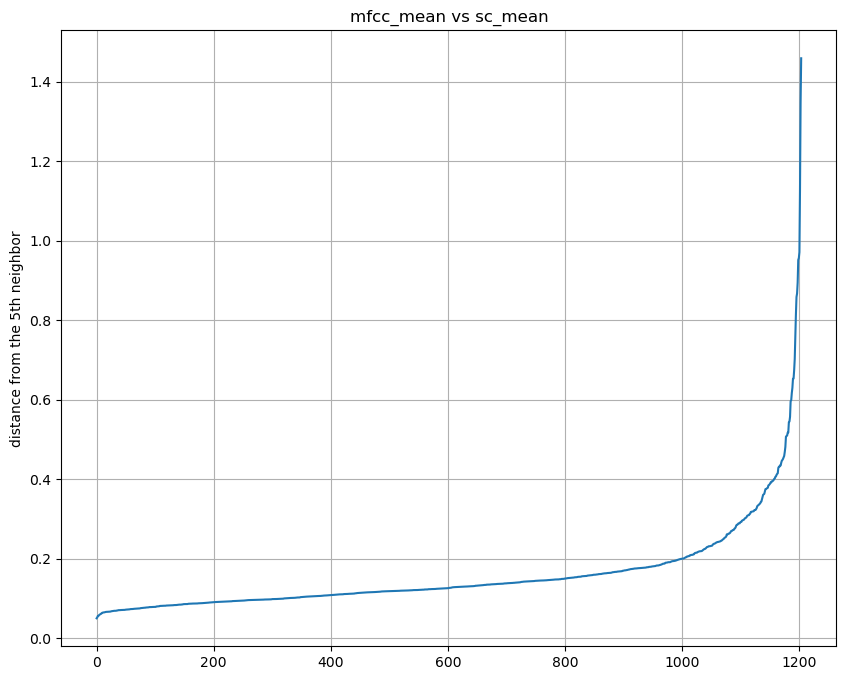

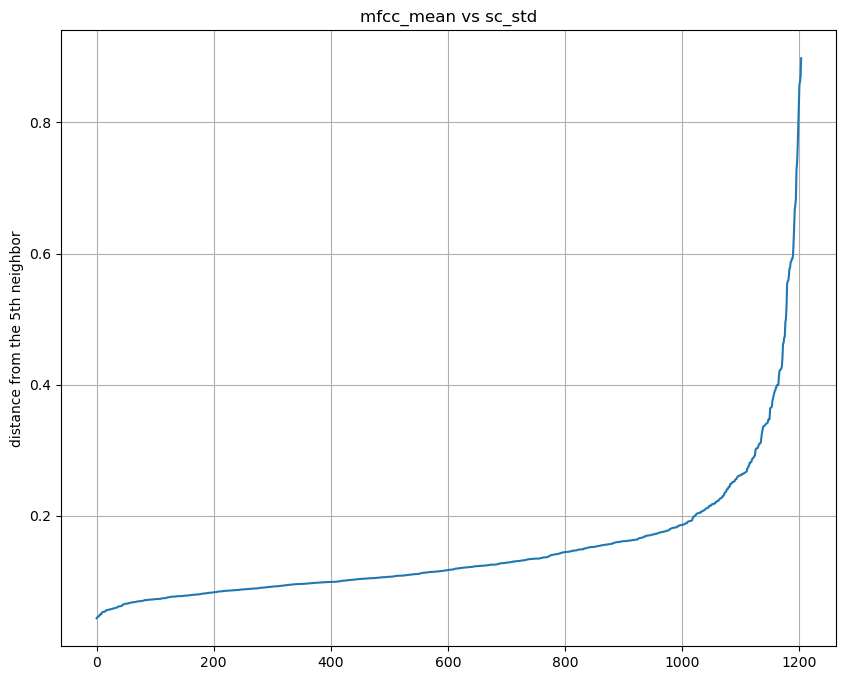

...

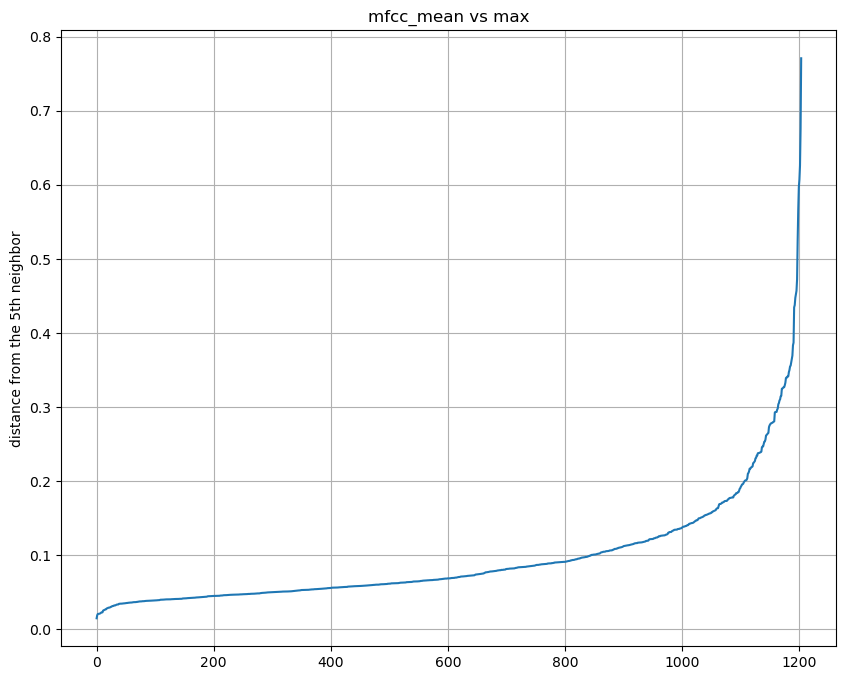

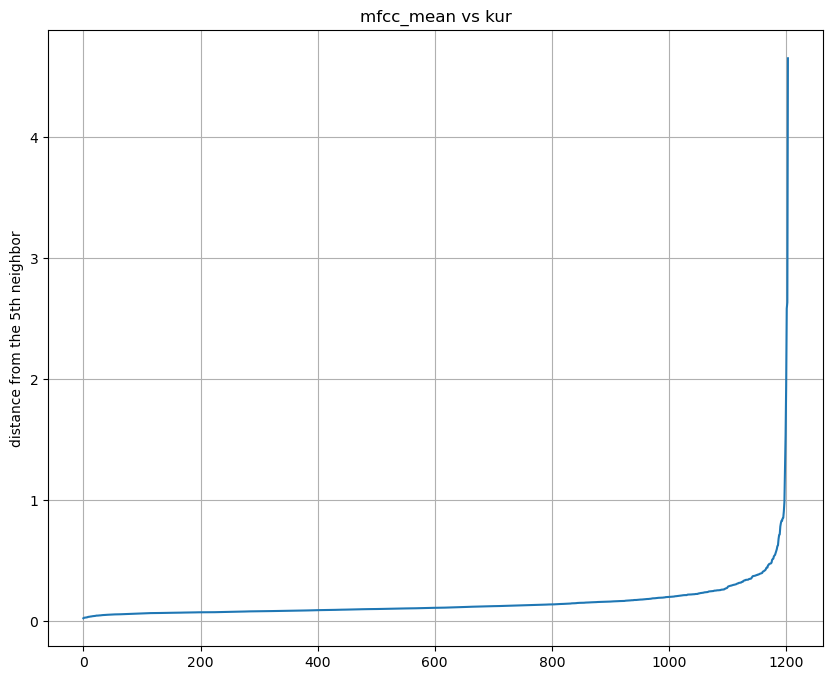

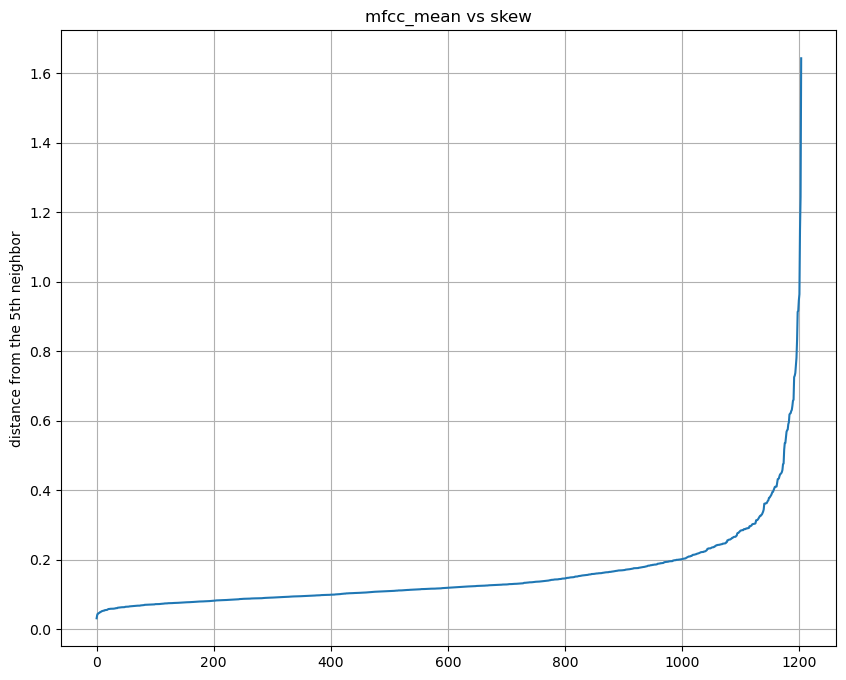

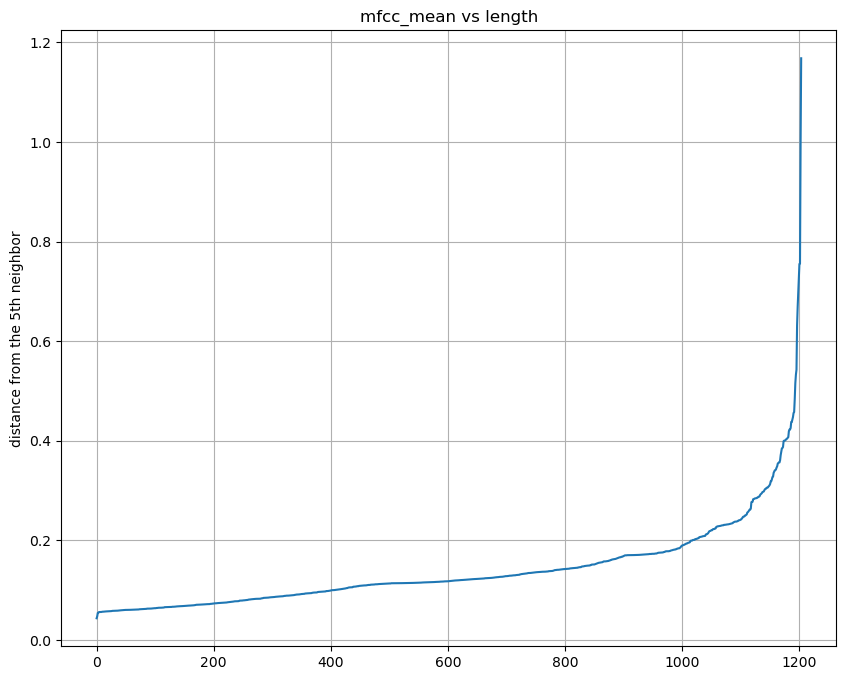

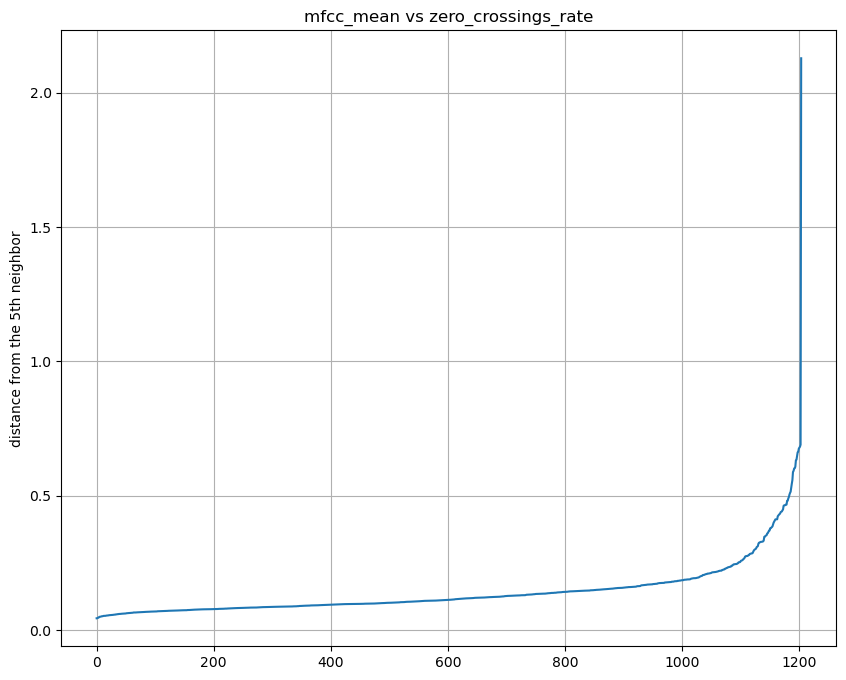

In [130]:
for pairs_ in pairs[22:43]:
    df_train=df_F[pairs_]
    SilCurve(pairs_,df_train,5)

In [229]:
EpsMinP_values2 =[]
for var_ in pairs[22:43]:
    l = Optimal_EpsMinP(3,13,0.2,0.5,0.1,df_F[var_])
    print(l)
    EpsMinP_values2.append(l)

(0.5689836088473699, 8, 0.4)
(0.5832129326833798, 3, 0.4)
(0.42049435229705373, 3, 0.4)
(0.29496935325567214, 8, 0.2)
(0.4533162284056901, 8, 0.4)
(0.5058948913789115, 8, 0.4)
(0.5310283210176563, 8, 0.4)
(0.5631905773902317, 8, 0.3)
(0.4958545968403539, 3, 0.4)
(0.4478343627332579, 3, 0.4)
(0.4148853576492689, 8, 0.4)
(0.6939831822845872, 8, 0.4)
(0.5463635285905577, 8, 0.4)
(0.4456250209109901, 8, 0.4)
(0.5782128075154677, 8, 0.3)
(0.6157166544795779, 8, 0.4)
(0.5524250254785459, 8, 0.3)
(0.5367140608693113, 8, 0.4)
(0.44145008528097013, 8, 0.4)
(0.43681454462988306, 8, 0.4)
(0.4991343581427352, 8, 0.4)


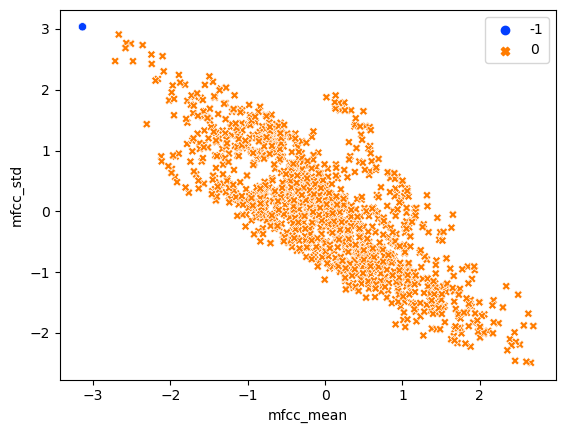

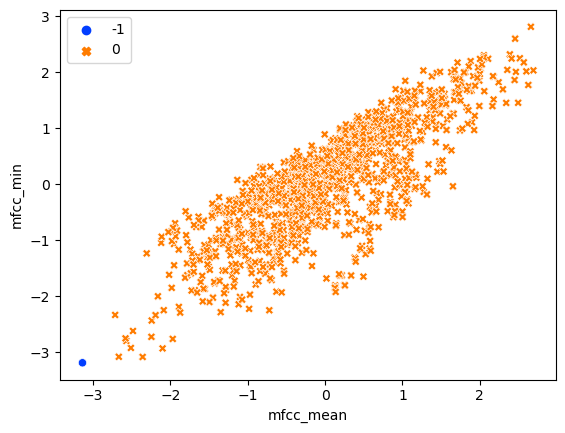

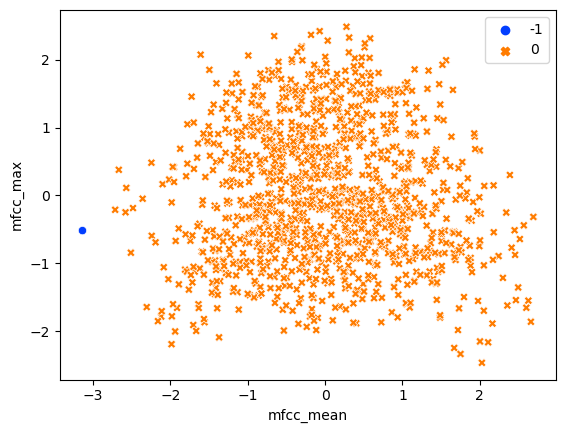

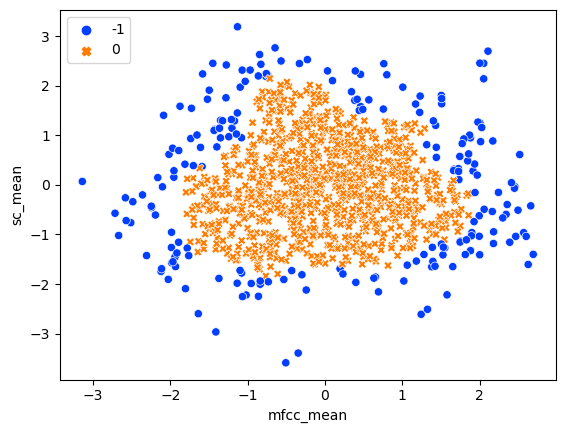

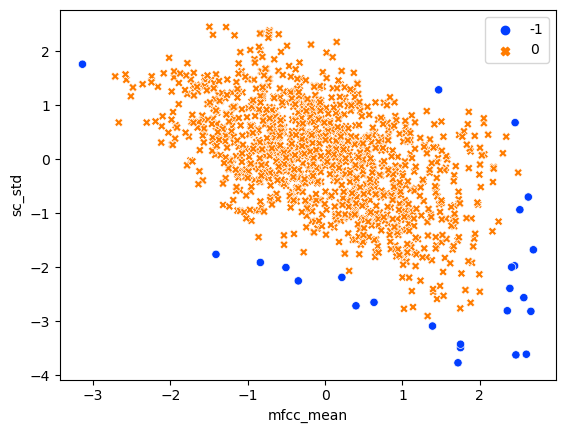

...

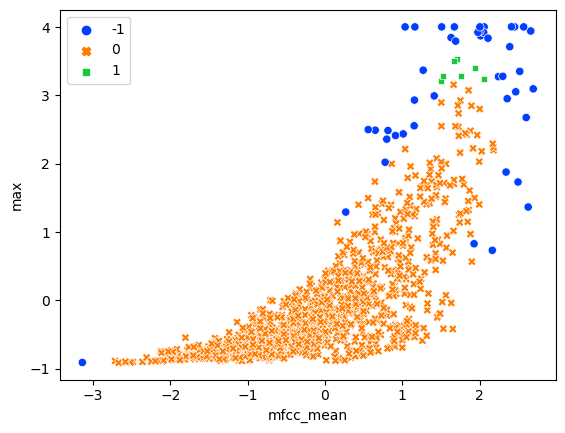

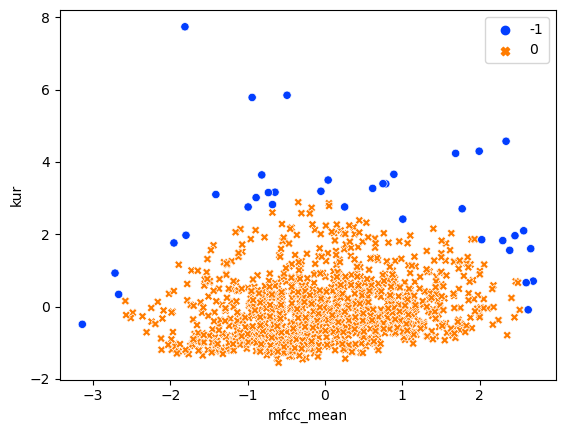

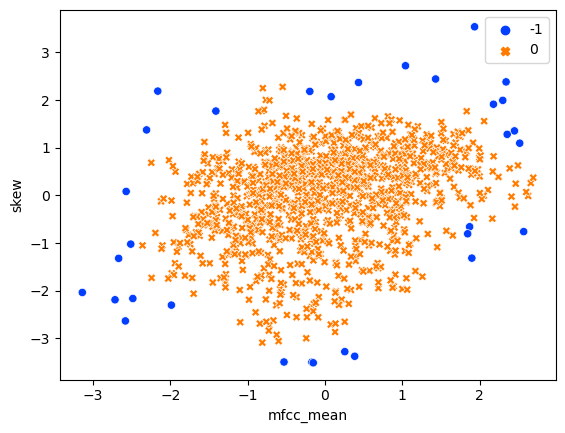

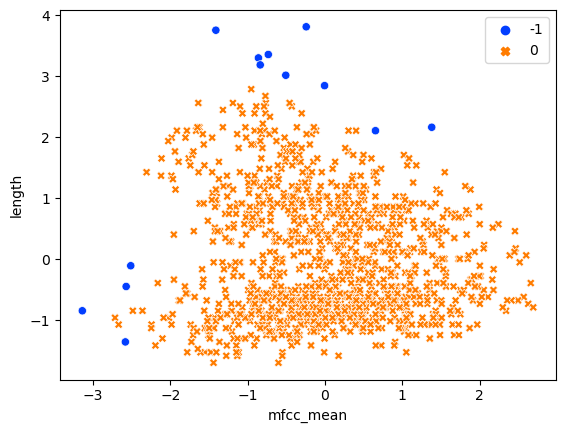

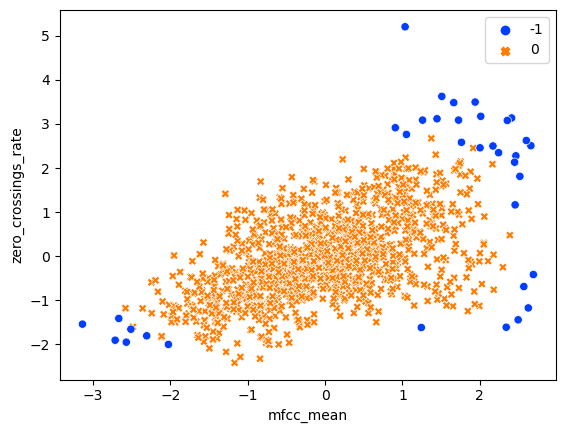

In [231]:
for i in range(21) :
    DBScanTest(pairs[22+i][0],pairs[22+i][1],EpsMinP_values2[i][2],EpsMinP_values2[i][1])

#### 1. Analysis for mfcc_min 

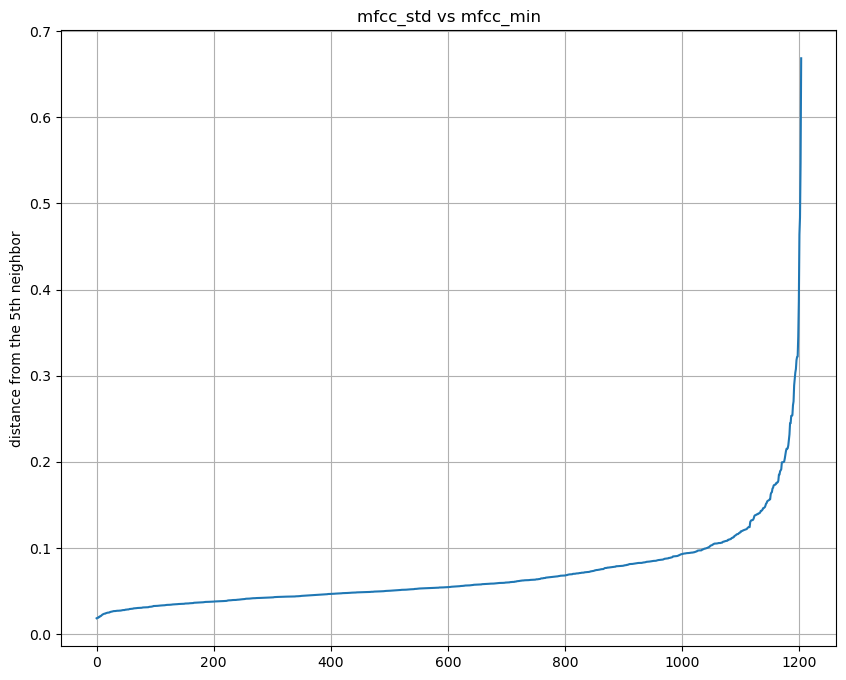

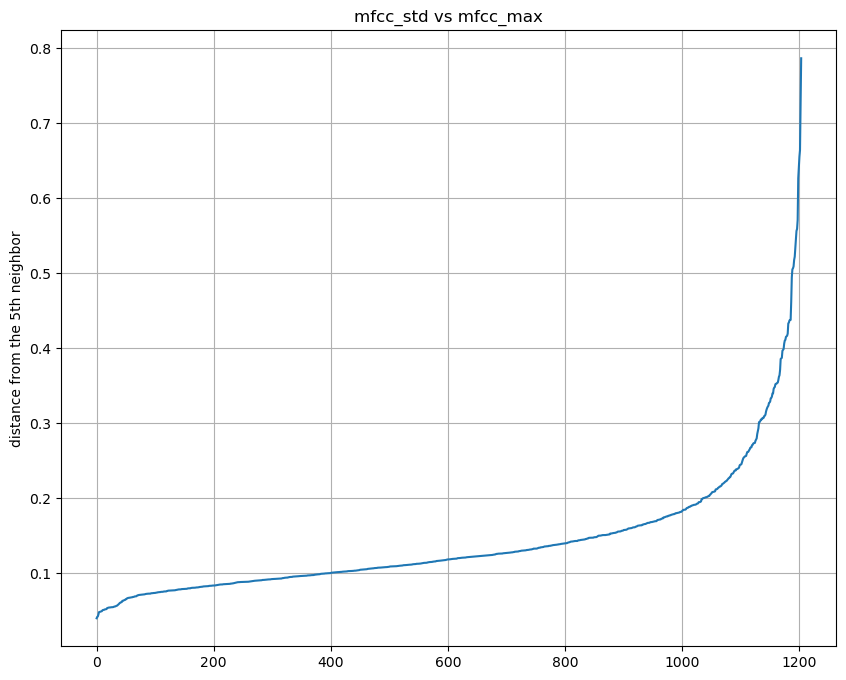

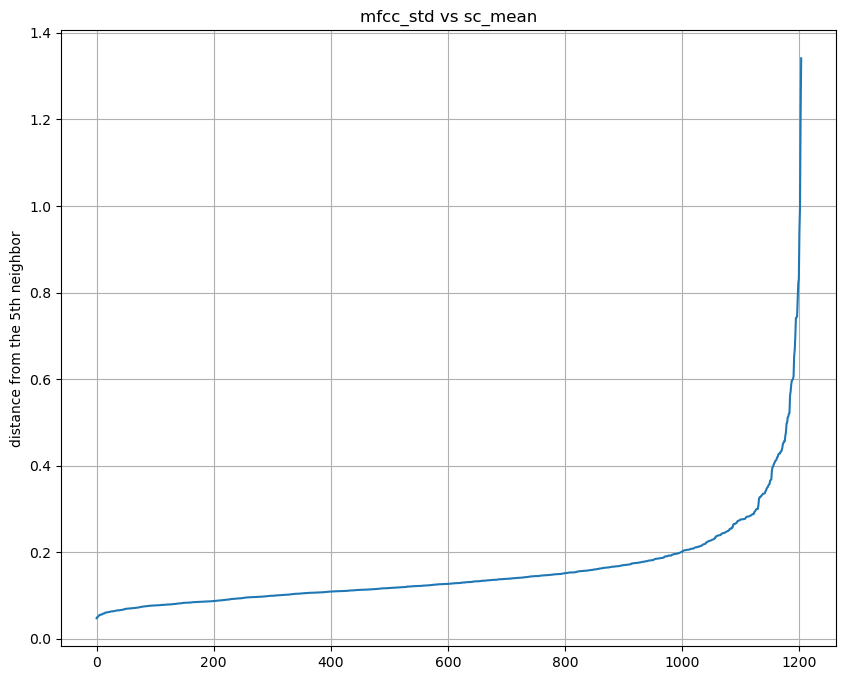

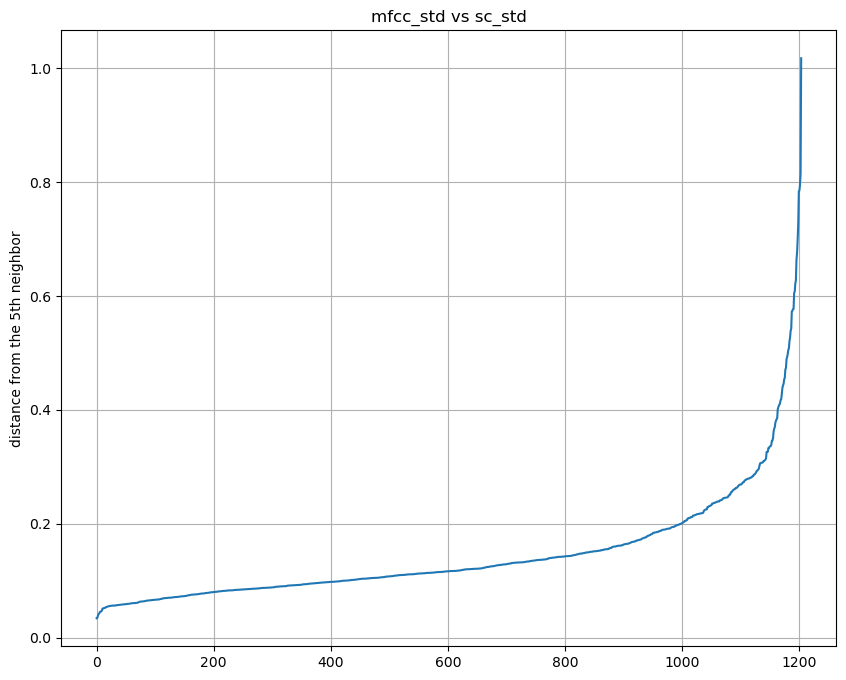

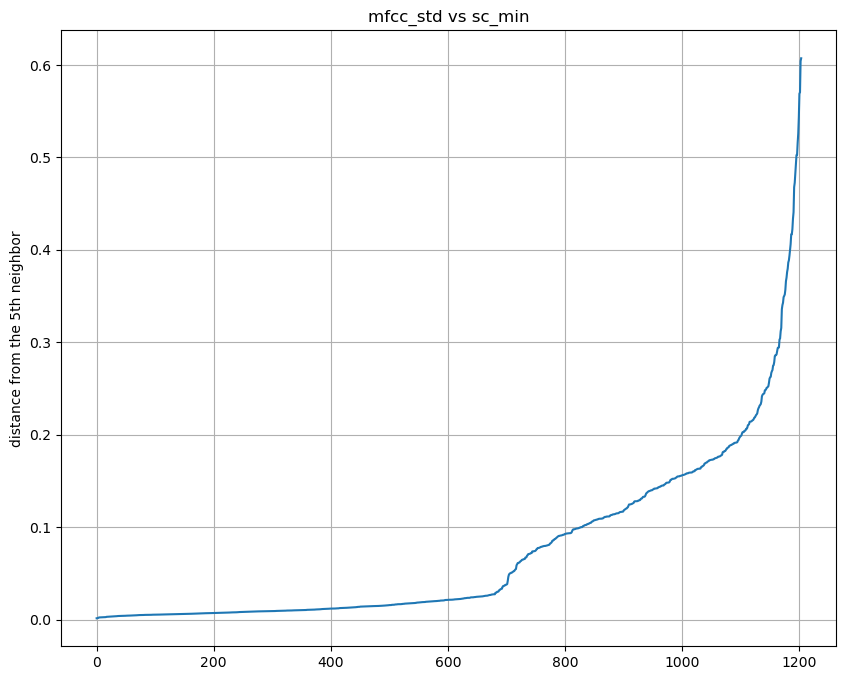

...

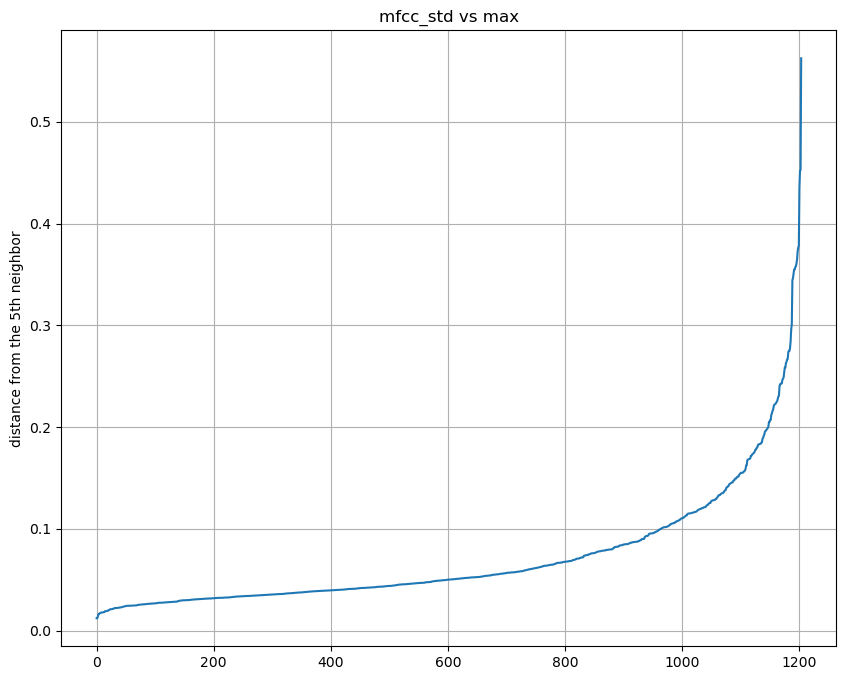

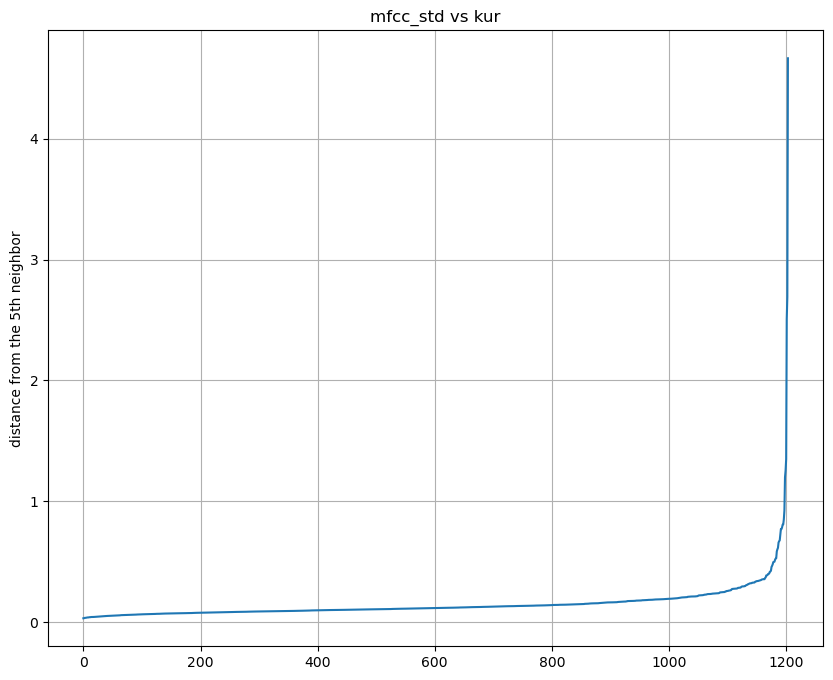

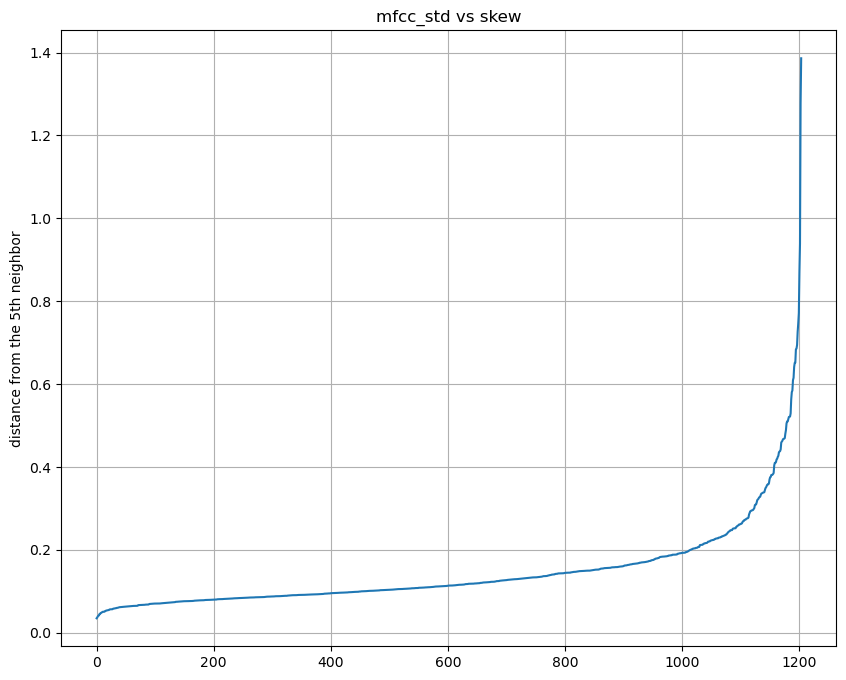

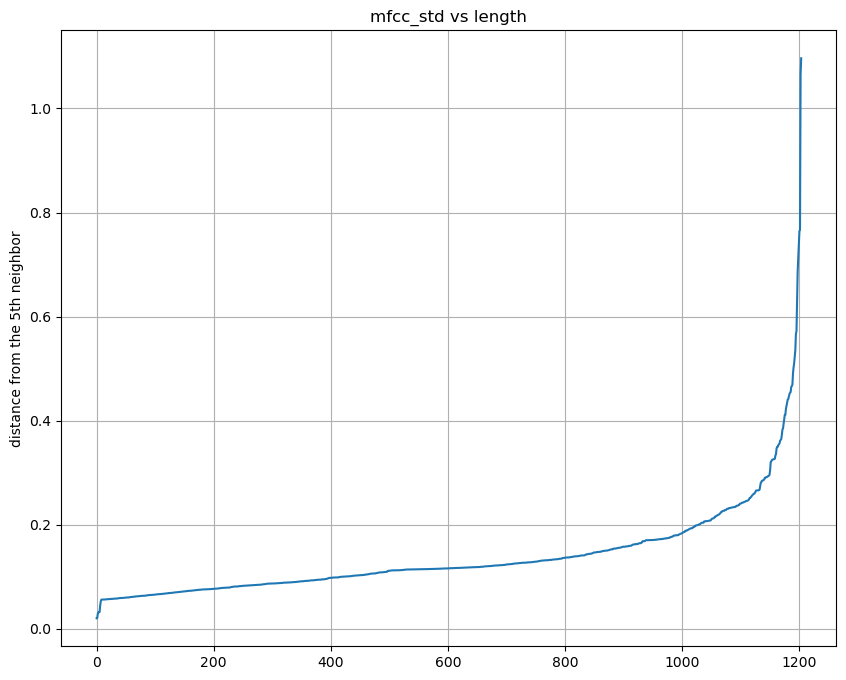

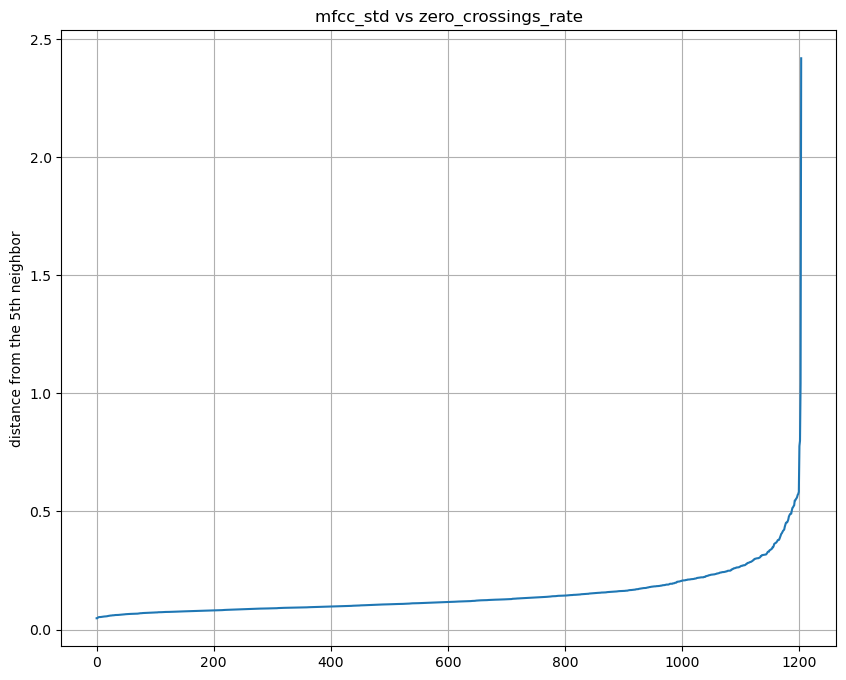

In [236]:
for pairs_ in pairs[43:63]:
    df_train=df_F[pairs_]
    SilCurve(pairs_,df_train,5)

In [282]:
#EpsMinP_values3[12]
#EpsMinP_values3.append(Optimal_EpsMinP(5,15,0.15,0.6,0.02,df_F[pairs[62]]))
EpsMinP_values3

[(0.5754824624451216, 5, 0.31),
 (0.39414951047866476, 3, 0.45),
 (0.4826893879761654, 5, 0.6),
 (0.5231899364543693, 8, 0.55),
 (0.47828300609255453, 5, 0.3),
 (0.6777919356933056, 8, 0.99),
 (0.789652058232783, 3, 0.98),
 (0.6133357277372419, 8, 0.74),
 (0.4431812691689737, 3, 0.59),
 (0.46328381011176784, 5, 0.51),
 (0.8301736256193484, 10, 0.98),
 (0.7810853075123787, 5, 0.98),
 (0.5086136622586998, 5, 0.74),
 (0.6114957670341096, 10, 0.18),
 (0.6491177485242392, 5, 0.38),
 (0.5721106784848918, 5, 0.24),
 (0.6874773358436602, 5, 0.78),
 (0.5161717182239597, 5, 0.58),
 (0.4814394852340919, 5, 0.59),
 (0.5228470489449759, 10, 0.53)]

In [239]:
EpsMinP_values3 =[]
for var_ in pairs[43:63]:
    l = Optimal_EpsMinP(5,15,0.08,0.2,0.01,df_F[var_])
    print(l)
    EpsMinP_values3.append(l)

(0.5754824624451216, 5, 0.31)
(0.38148615016182985, 5, 0.29)
(0.3845144226029064, 10, 0.34)
(0.45331215800440555, 5, 0.34)
(0.47828300609255453, 5, 0.3)
(0.2684153678975968, 10, 0.18)
(0.6411132940722457, 5, 0.34)
(0.4034209140357011, 10, 0.34)
(0.38260175585169093, 5, 0.34)
(0.41220616711897884, 5, 0.32)
(0.4864280250765224, 10, 0.23)
(0.5338886451075802, 5, 0.29)
(0.3923622716110532, 10, 0.34)


ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

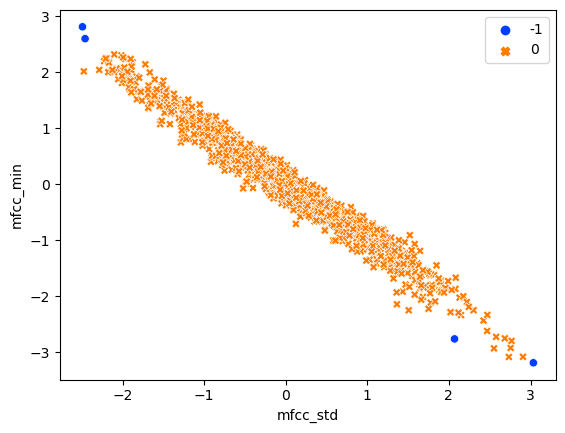

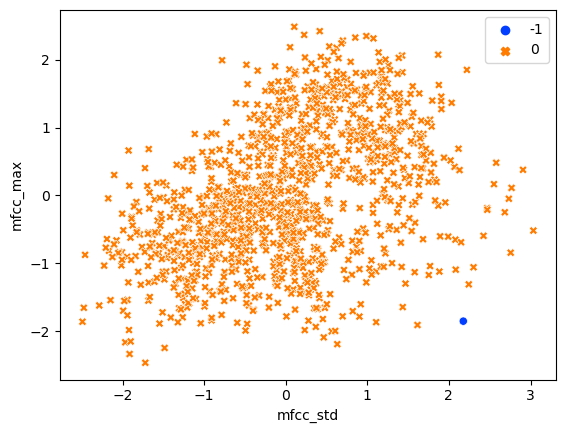

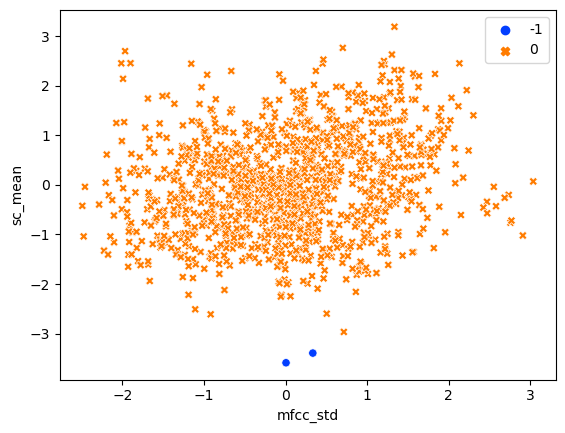

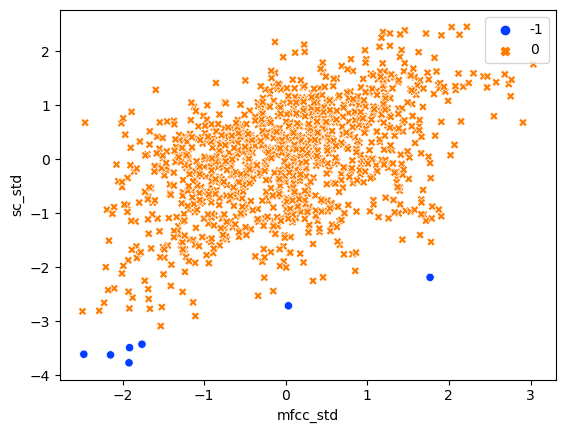

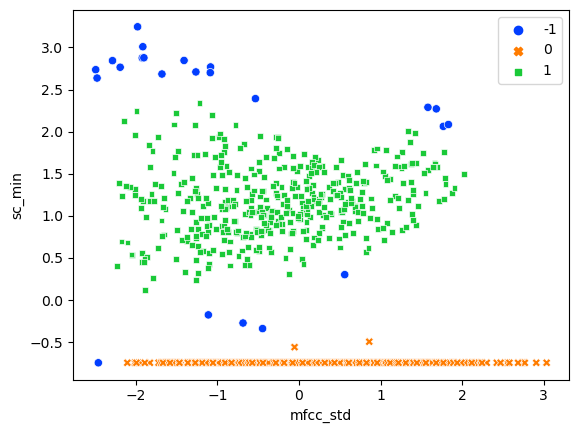

...

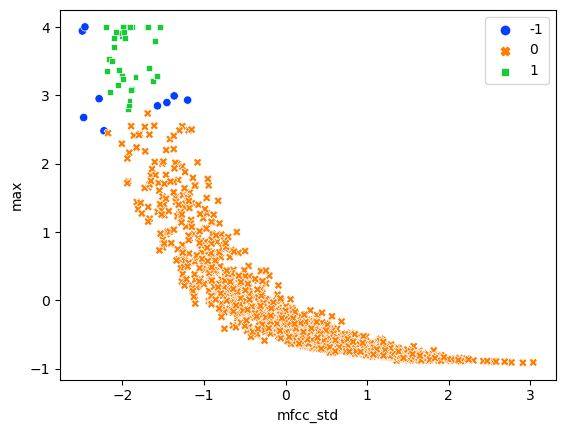

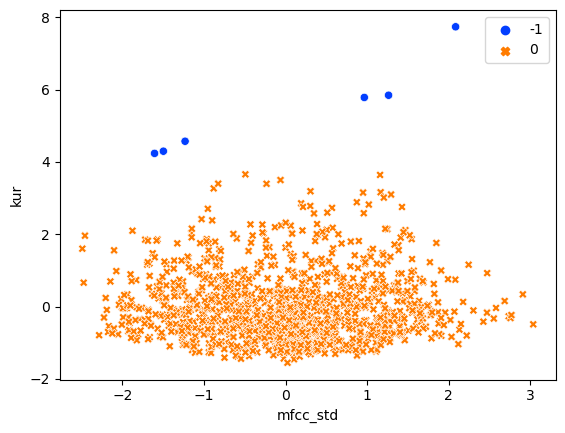

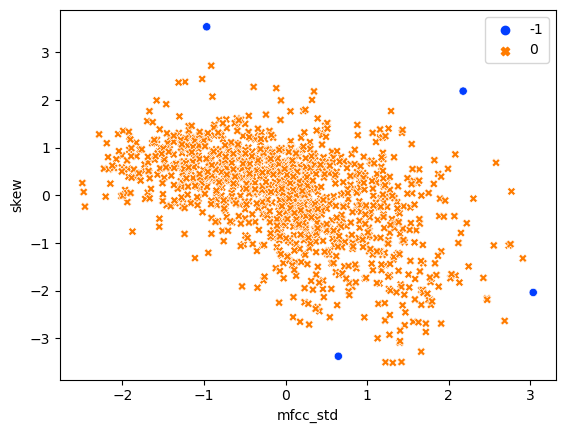

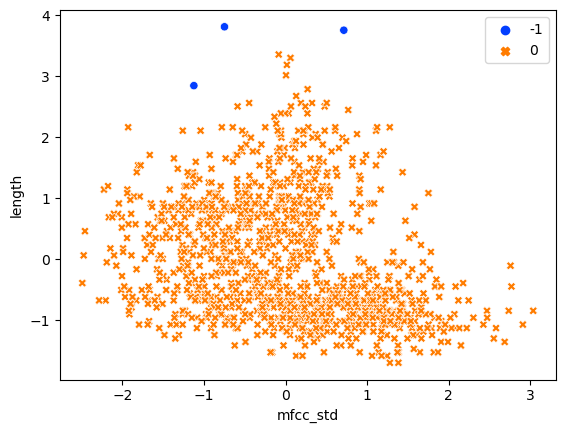

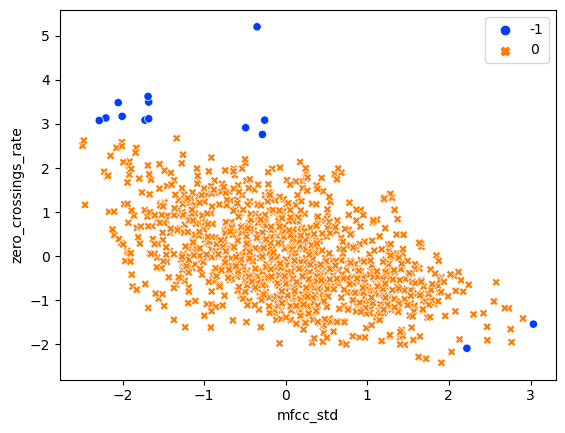

In [284]:
for i in range(20) :
    DBScanTest(pairs[43+i][0],pairs[43+i][1],EpsMinP_values3[i][2],EpsMinP_values3[i][1])

#### Analysis for sc_max

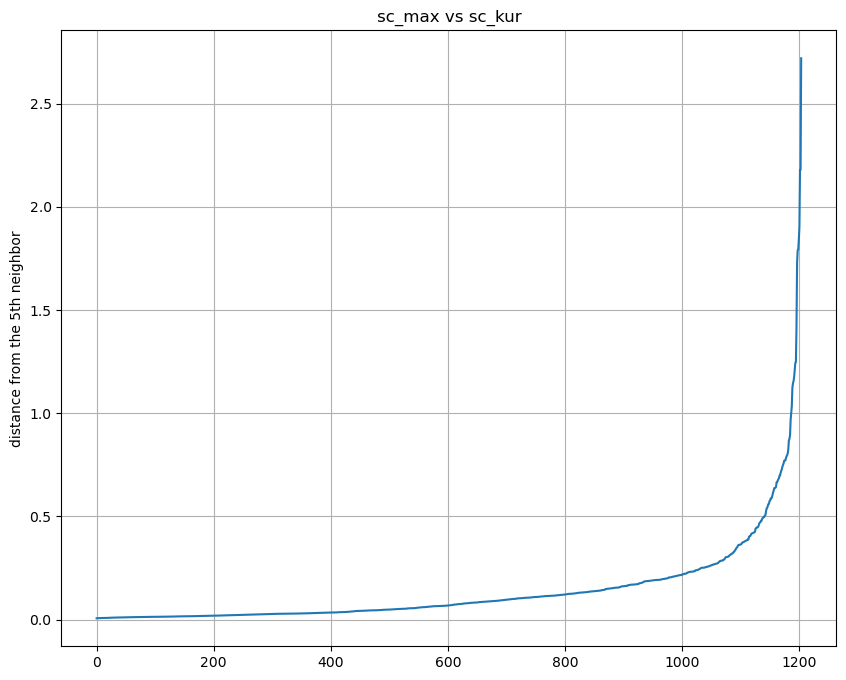

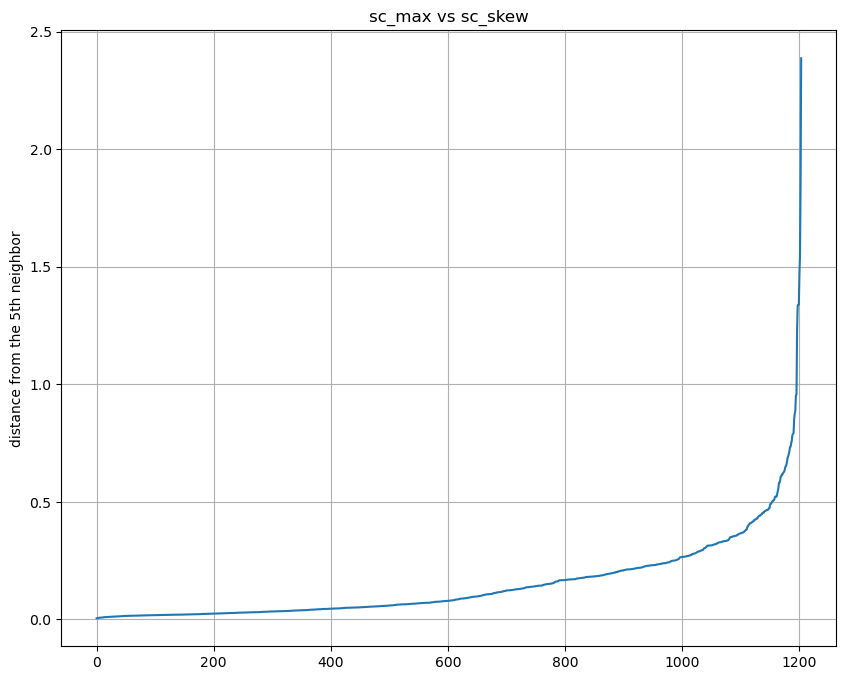

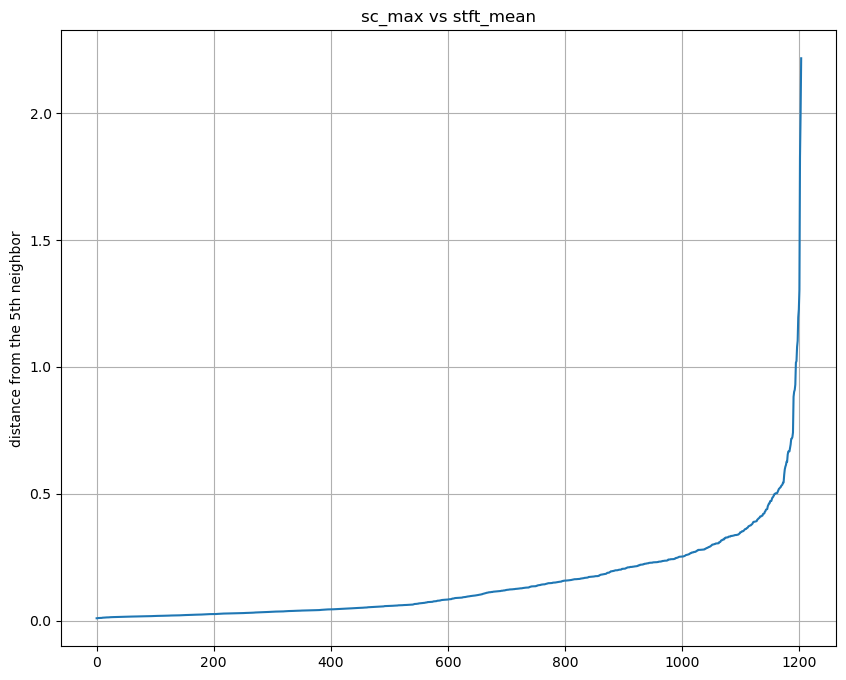

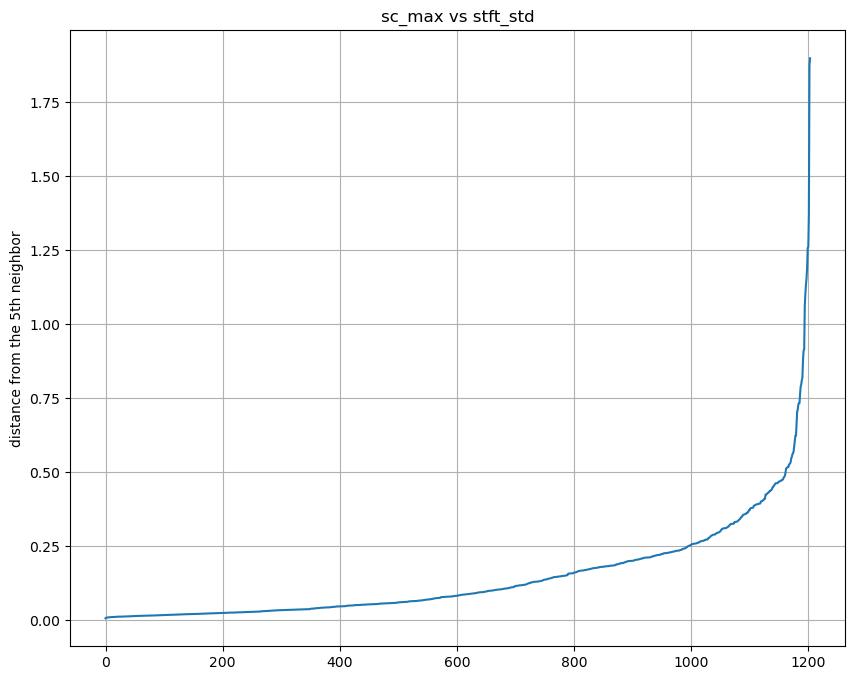

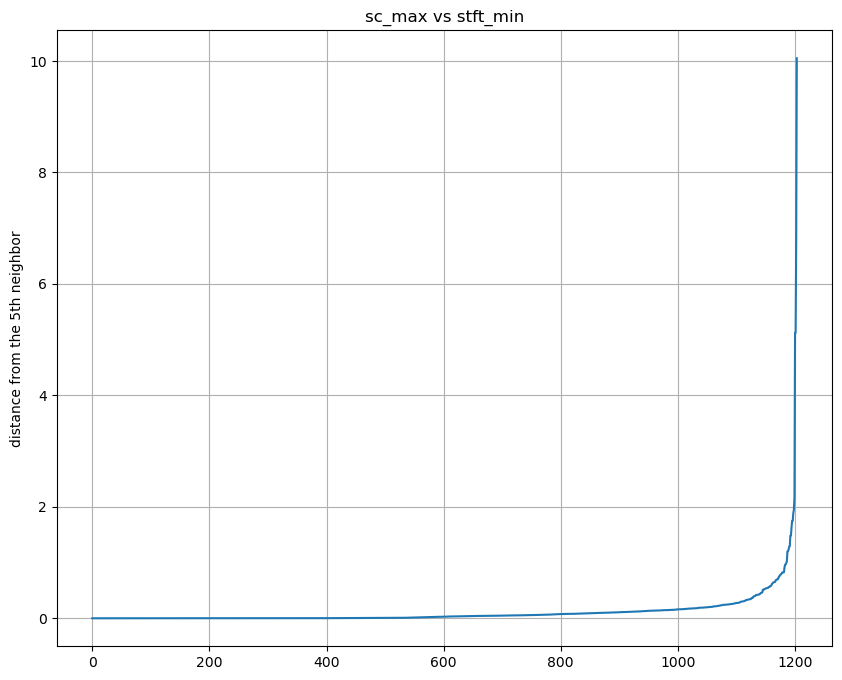

...

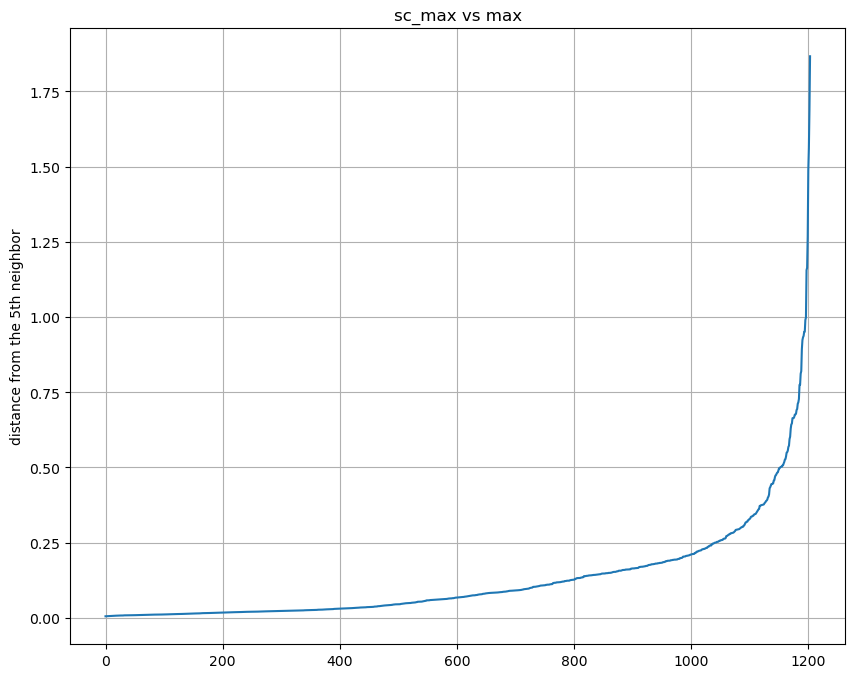

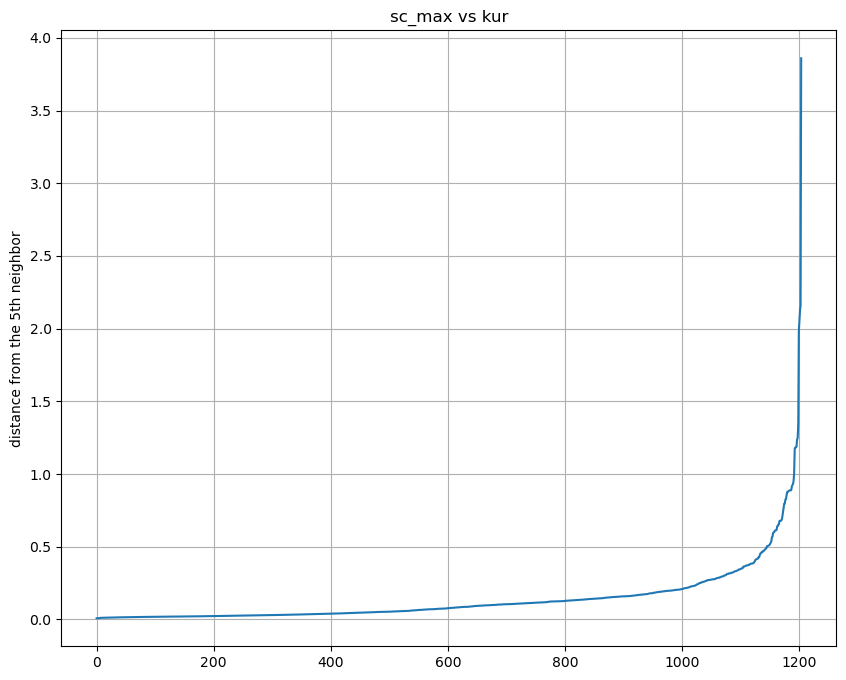

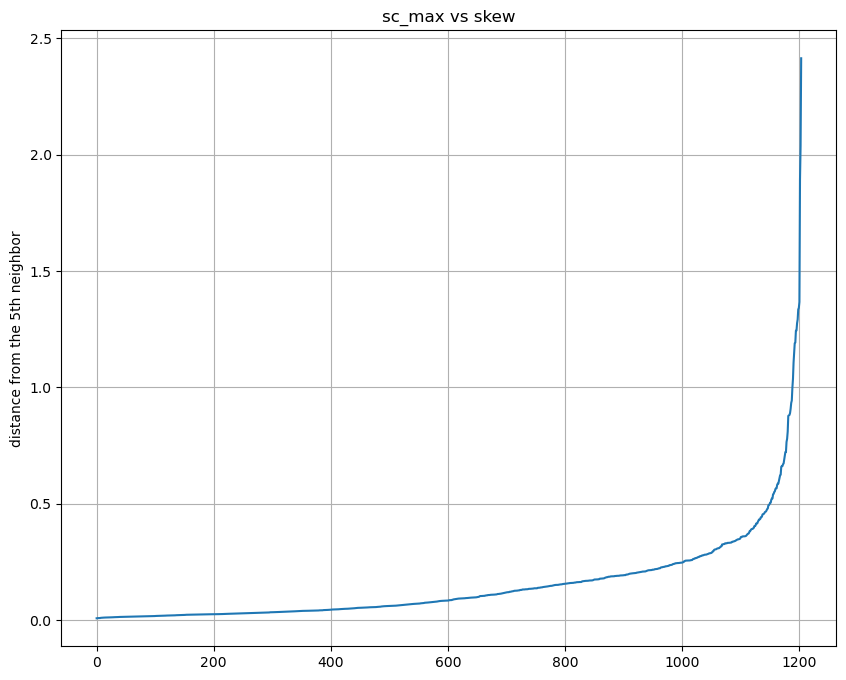

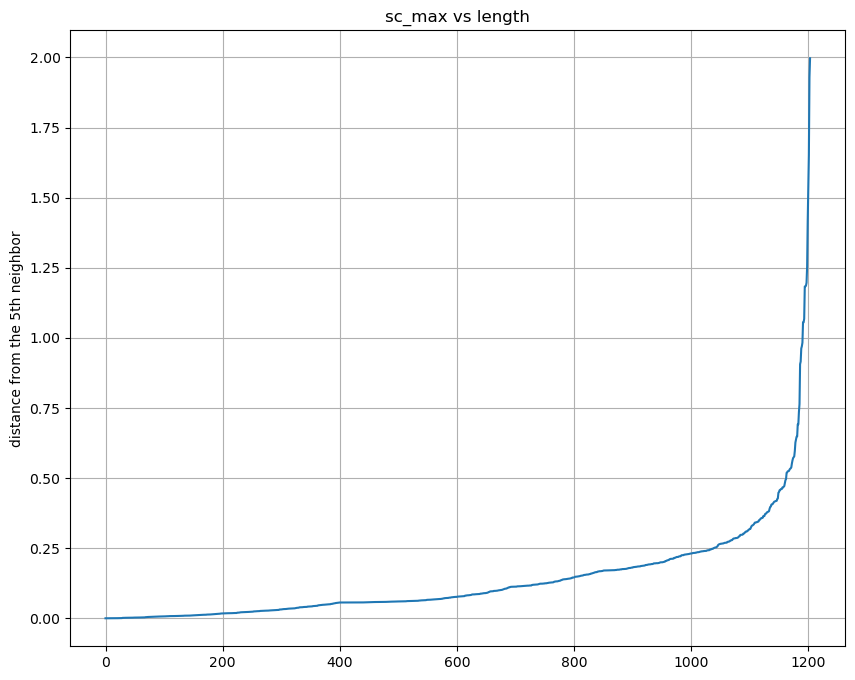

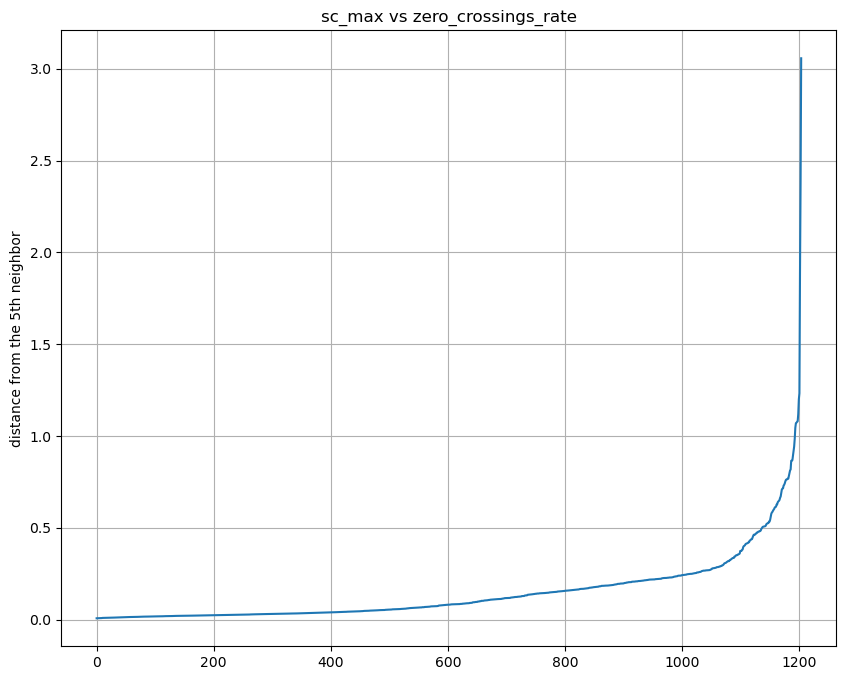

In [297]:
for pairs_ in pairs[148:162]:
    df_train=df_F[pairs_]
    SilCurve(pairs_,df_train,5)

In [301]:
EpsMinP_values4 =[]
for var_ in pairs[148:162]:
    l = Optimal_EpsMinP(3,15,0.1,2,0.02,df_F[var_])
    print(l)
    EpsMinP_values4.append(l)

(0.7816263543935013, 5, 0.98)
(0.6623718495487234, 10, 0.98)
(0.6570929138934739, 10, 0.98)
(0.6667011292906044, 10, 0.92)
(0.8280558176083886, 5, 0.98)
(0.778985337731327, 5, 0.98)
(0.6626666158372577, 10, 0.96)
(0.6696079065879542, 5, 0.94)
(0.6605029332884235, 10, 0.62)
(0.6579278472846779, 10, 0.78)
(0.7256091137873938, 5, 0.98)
(0.6494805363233906, 10, 0.92)
(0.6422478285171676, 5, 0.98)
(0.7045962011567851, 5, 0.98)


In [312]:
#EpsMinP_values4[-4]=Optimal_EpsMinP(3,15,0.25,1.25,0.02,df_F[pairs[159]])

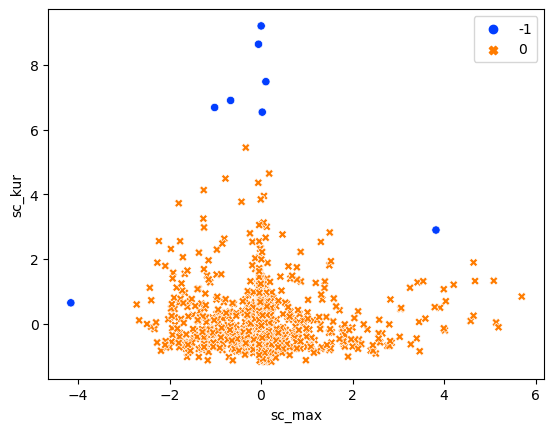

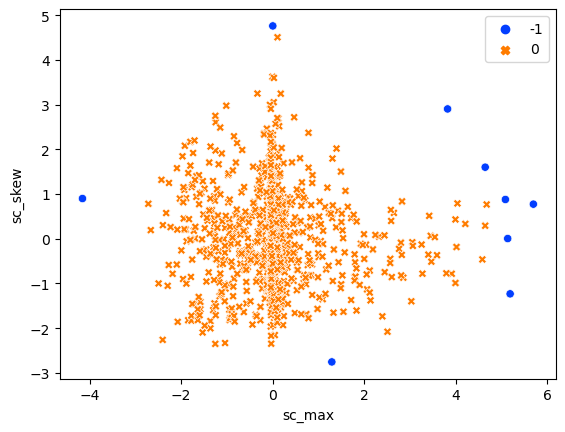

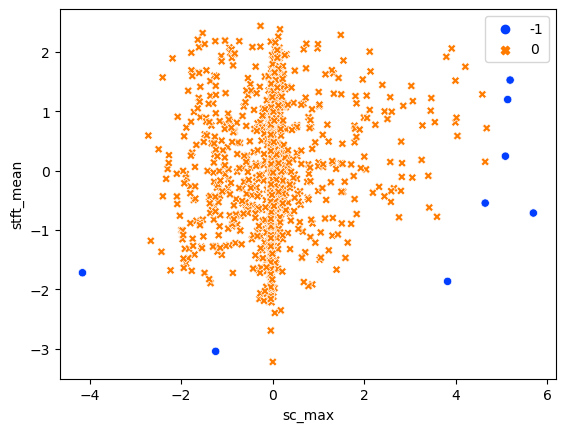

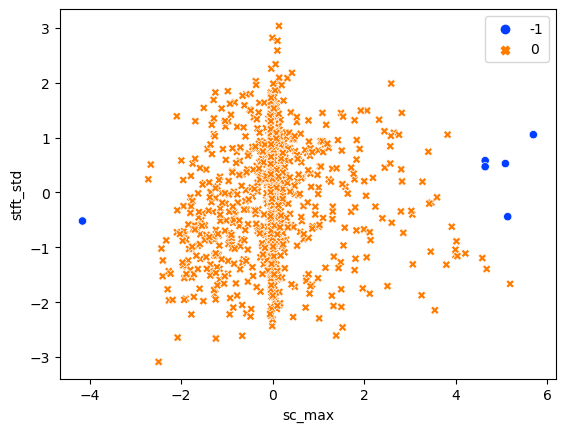

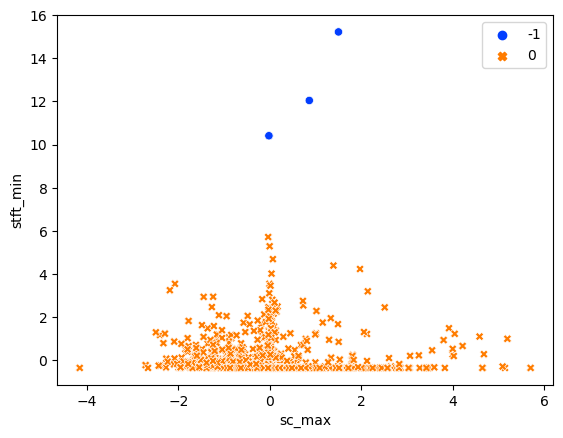

...

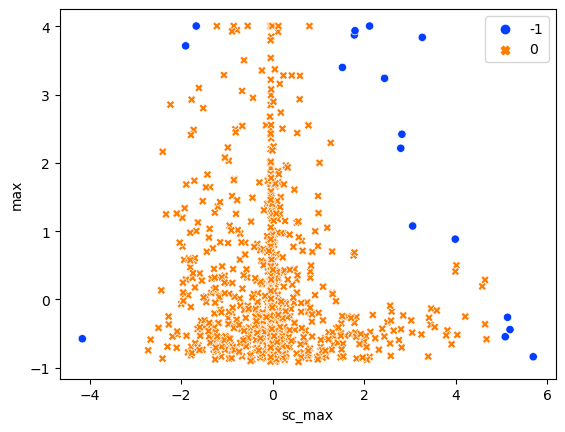

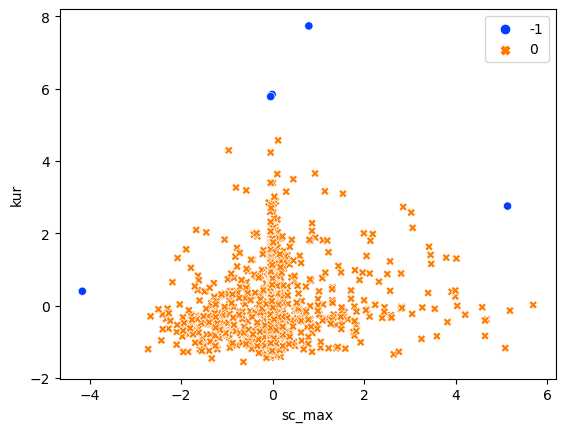

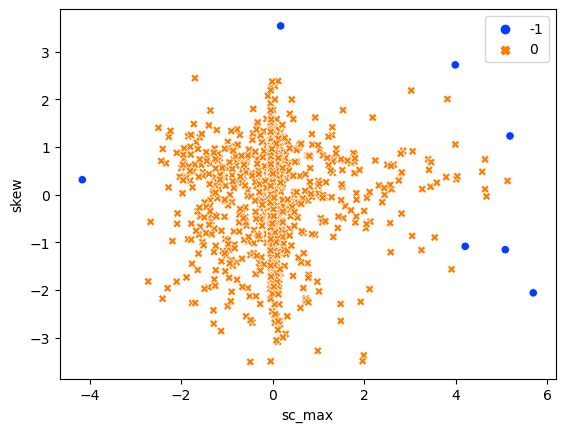

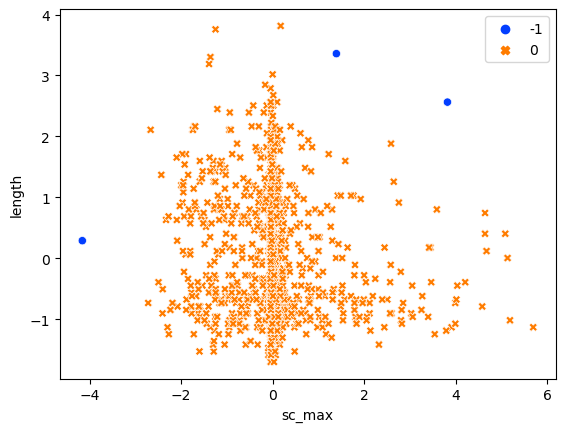

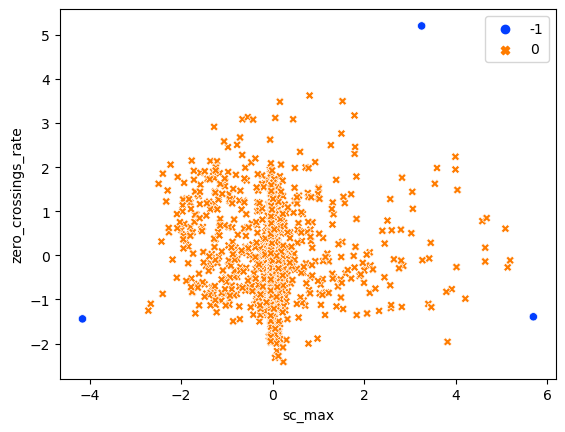

In [311]:
for i in range(14) :
    DBScanTest(pairs[148+i][0],pairs[148+i][1],EpsMinP_values4[i][2],EpsMinP_values4[i][1])

#### Analysis for stft_kur

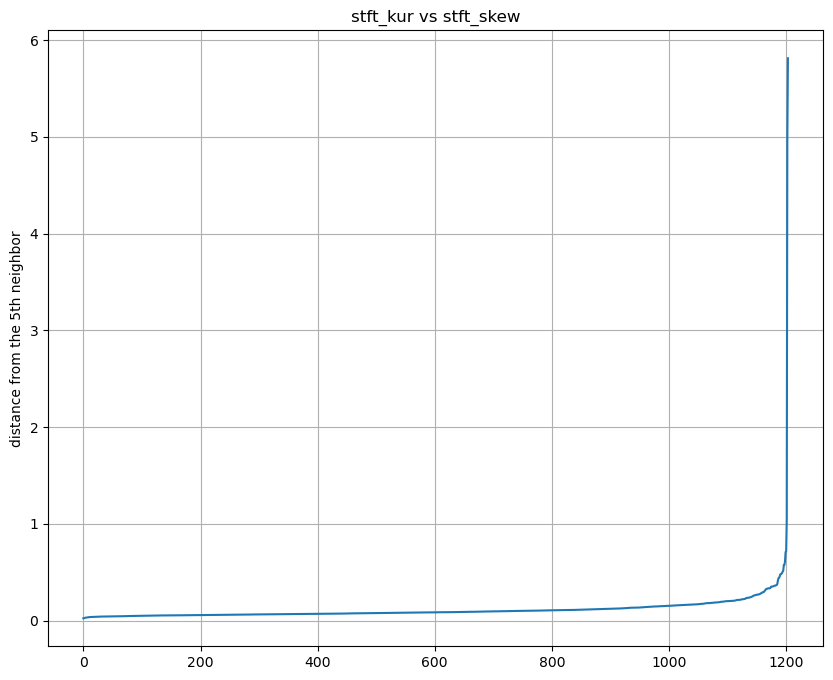

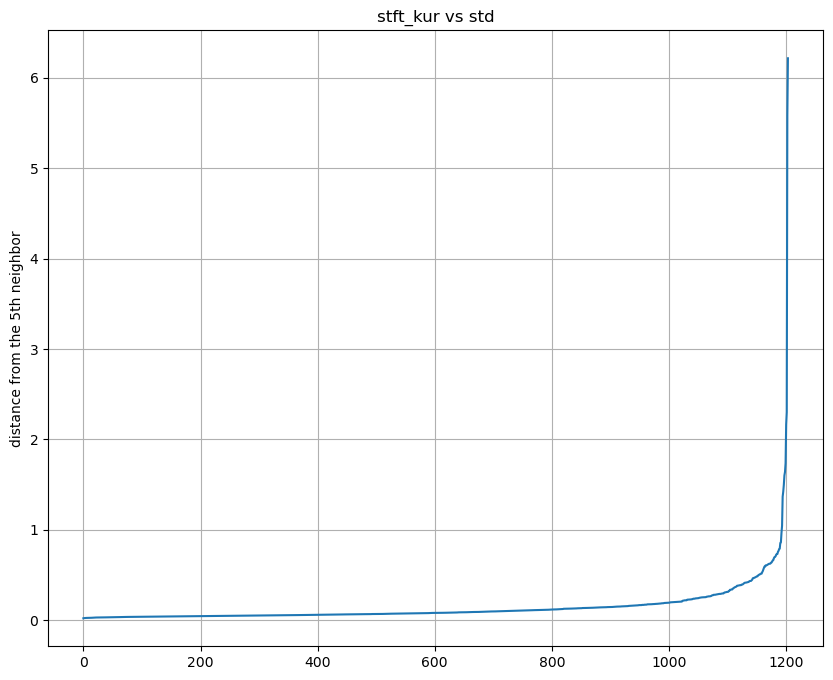

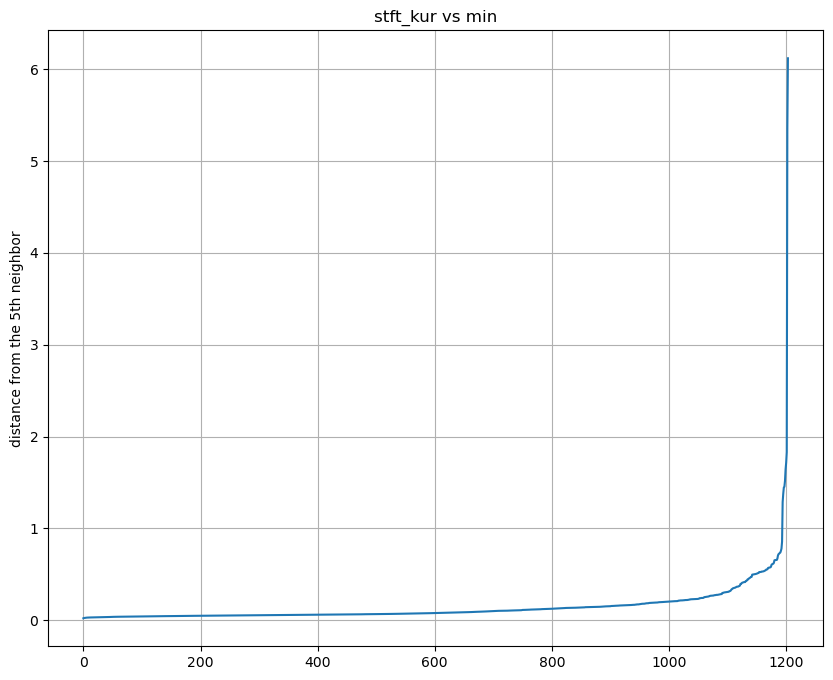

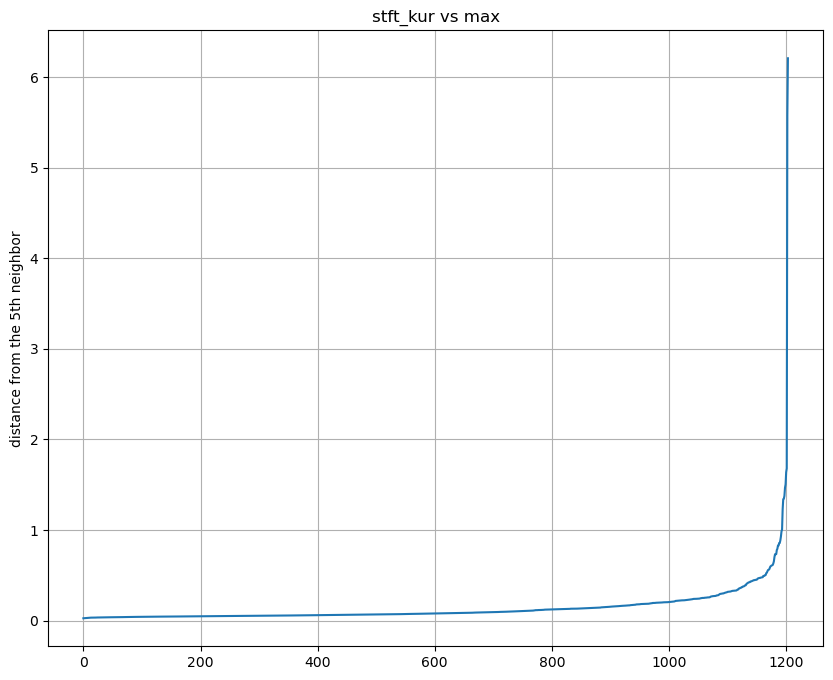

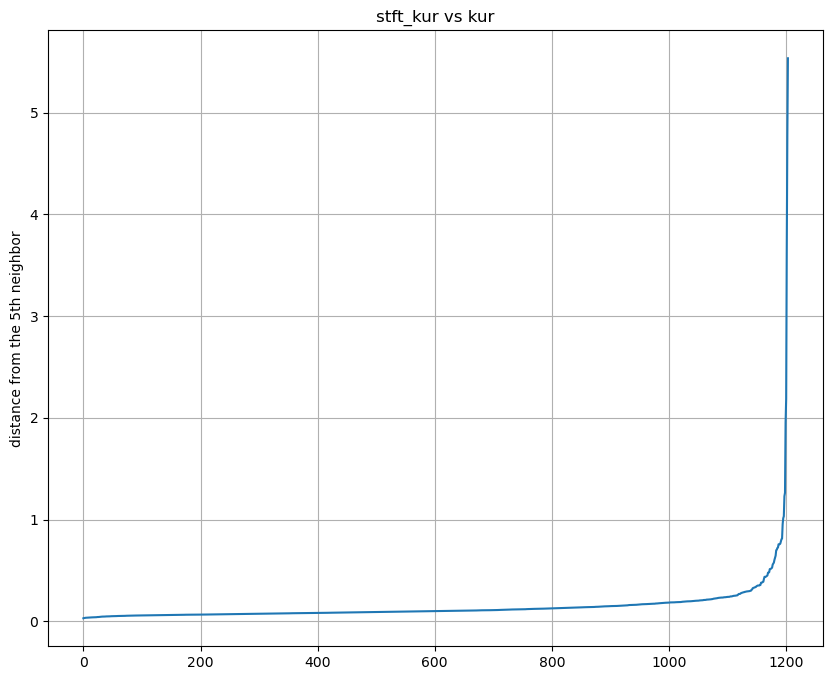

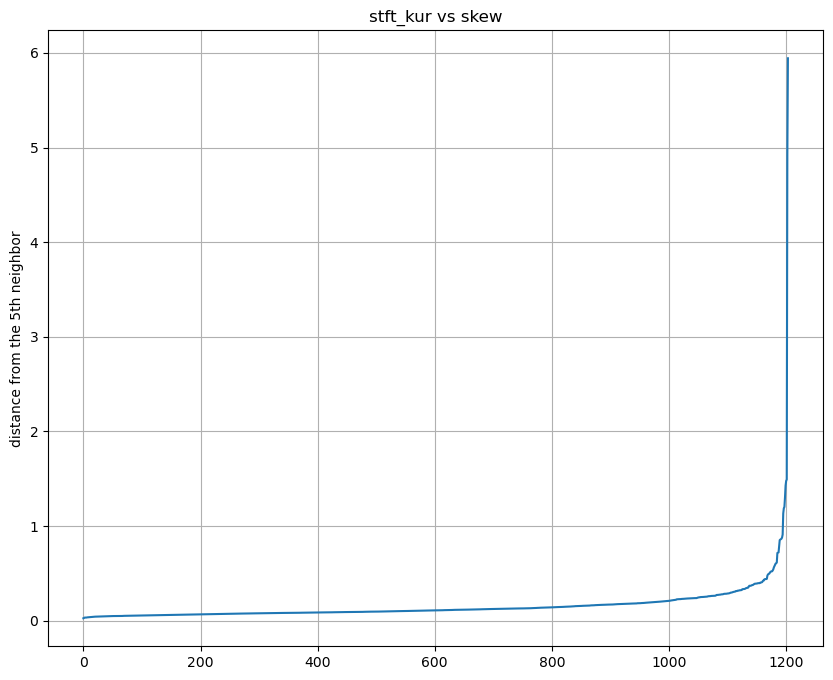

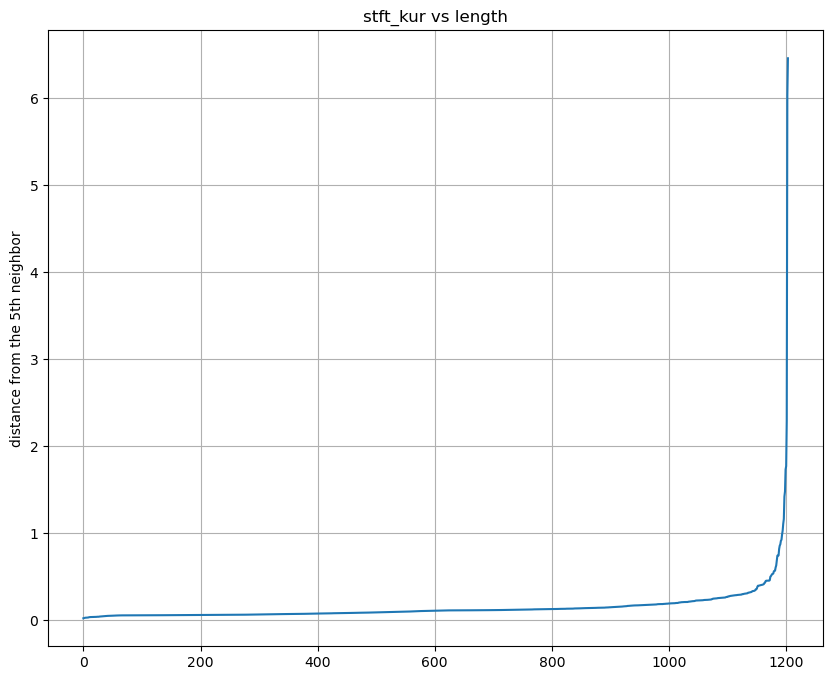

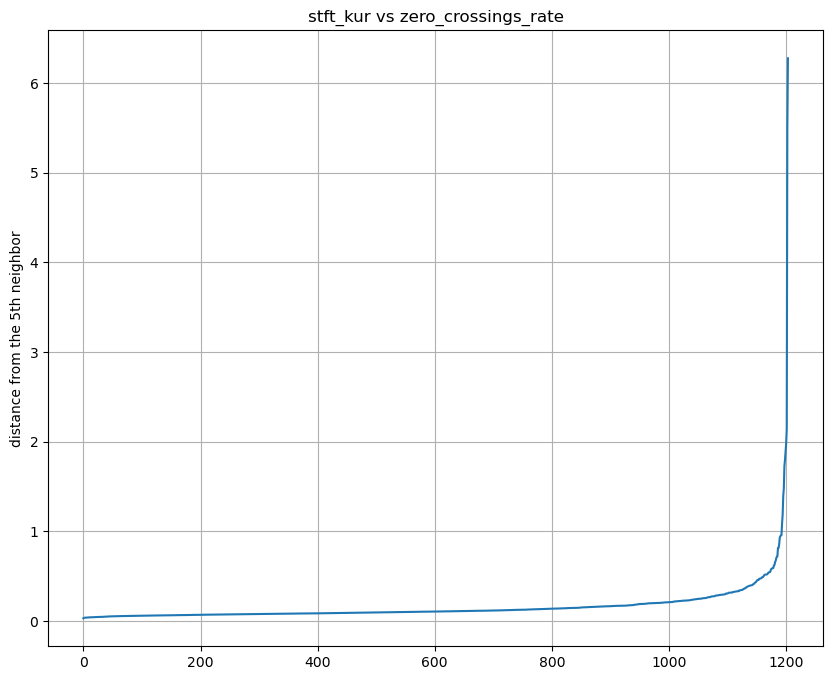

In [324]:
for pairs_ in pairs[217:225]:
    df_train=df_F[pairs_]
    SilCurve(pairs_,df_train,5)

In [326]:
EpsMinP_values5 =[]
for var_ in pairs[217:225]:
    l = Optimal_EpsMinP(3,15,0.1,1.3,0.02,df_F[var_])
    print(l)
    EpsMinP_values5.append(l)

(0.8376296475046549, 13, 1.28)
(0.83133763850166, 3, 1.28)
(0.8005776058498445, 3, 1.28)
(0.830714675582454, 3, 1.28)
(0.8159387235776298, 3, 1.28)
(0.819975417604973, 13, 1.28)
(0.7804984535960104, 3, 1.28)
(0.7288625083132139, 13, 1.28)


In [312]:
#EpsMinP_values4[-4]=Optimal_EpsMinP(3,15,0.25,1.25,0.02,df_F[pairs[159]])

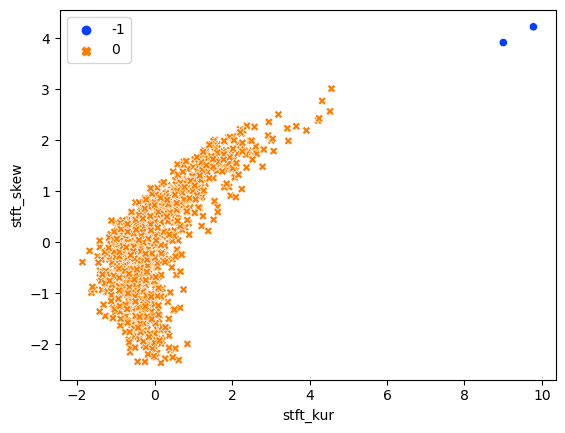

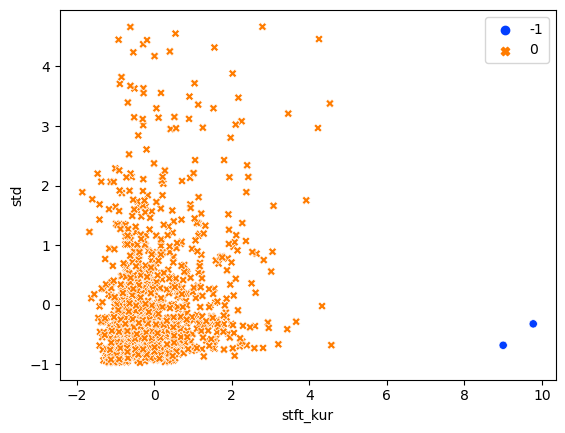

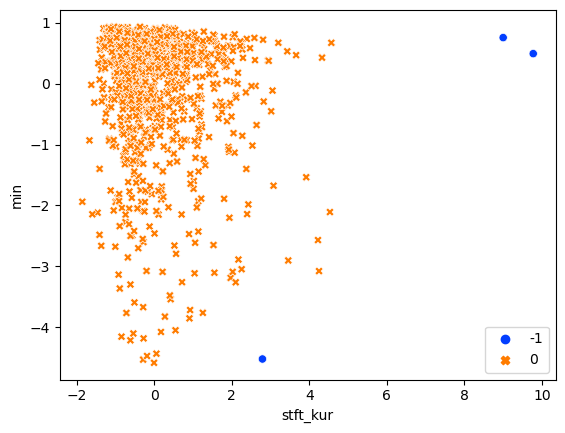

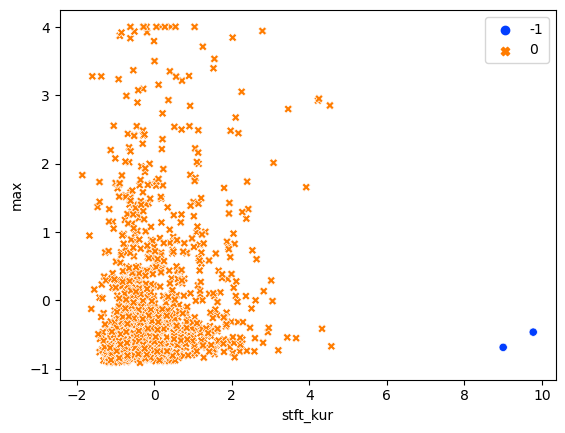

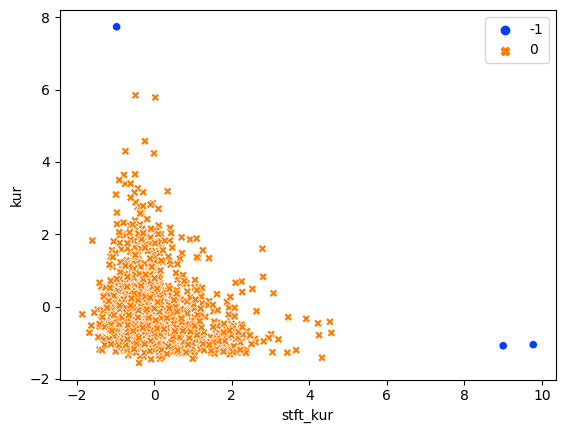

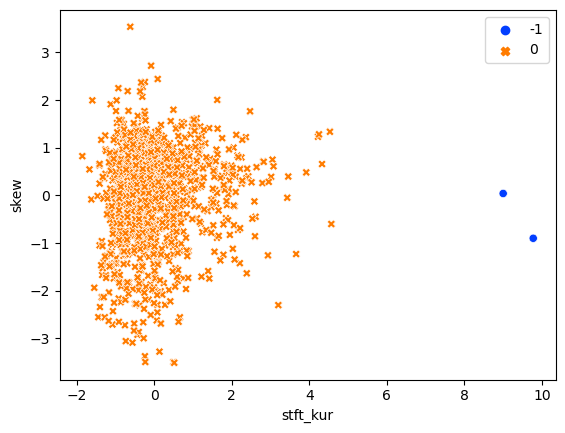

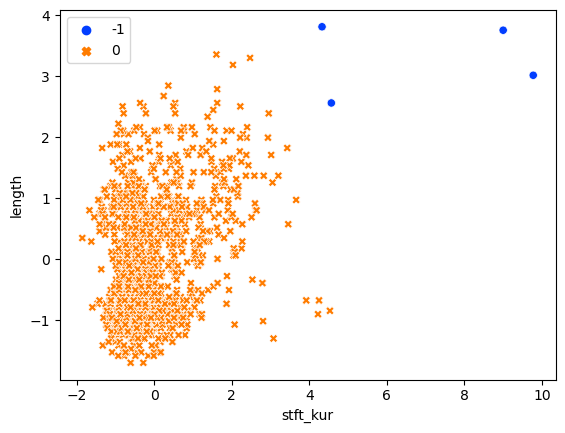

In [327]:
for i in range(7) :
    DBScanTest(pairs[217+i][0],pairs[217+i][1],EpsMinP_values5[i][2],EpsMinP_values5[i][1])

#### Analysis for std

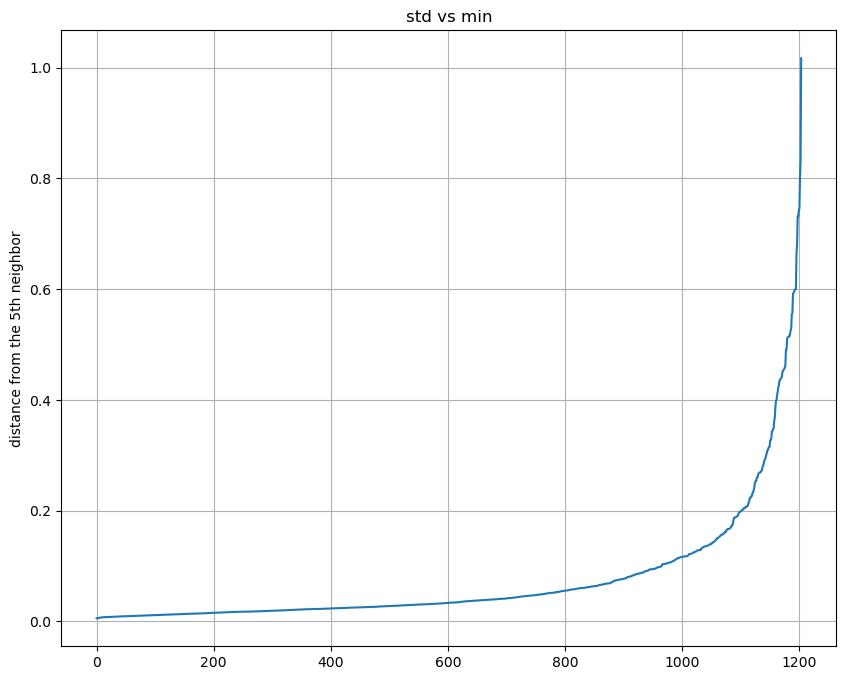

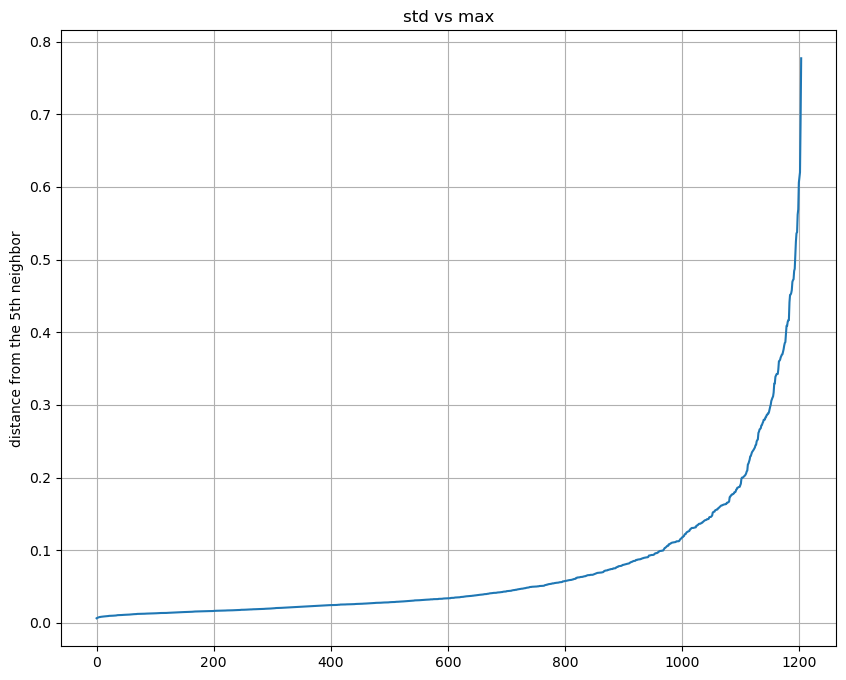

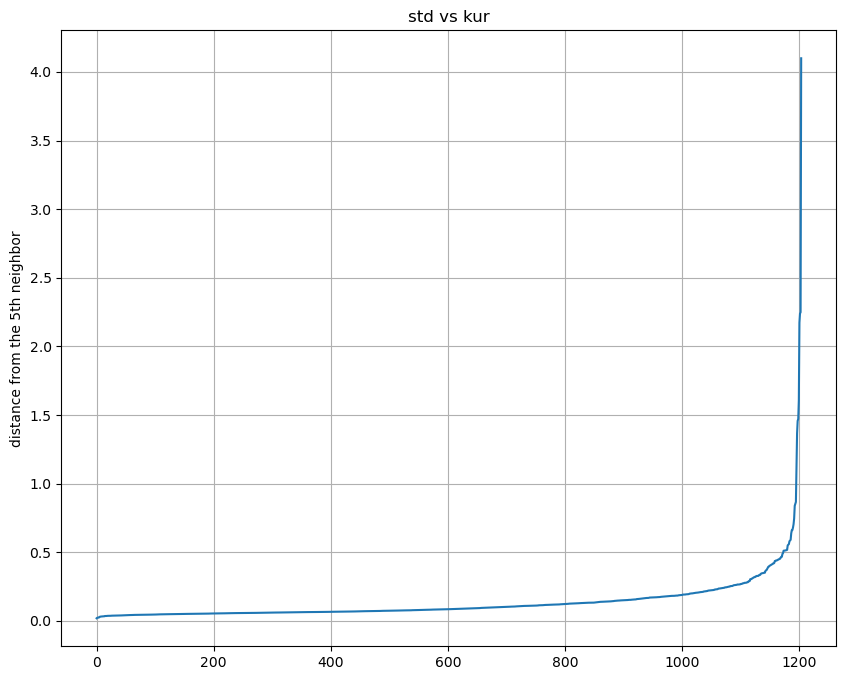

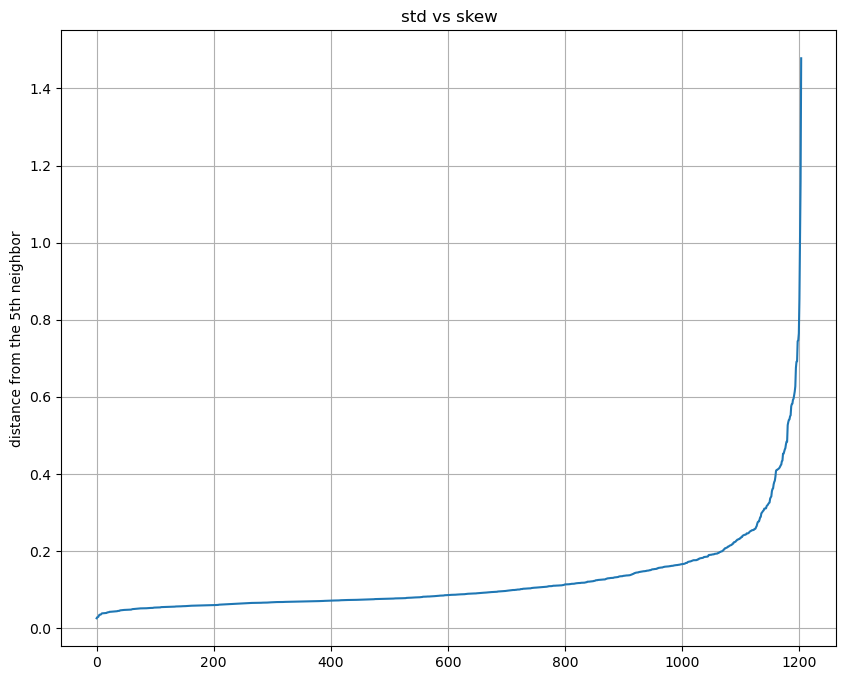

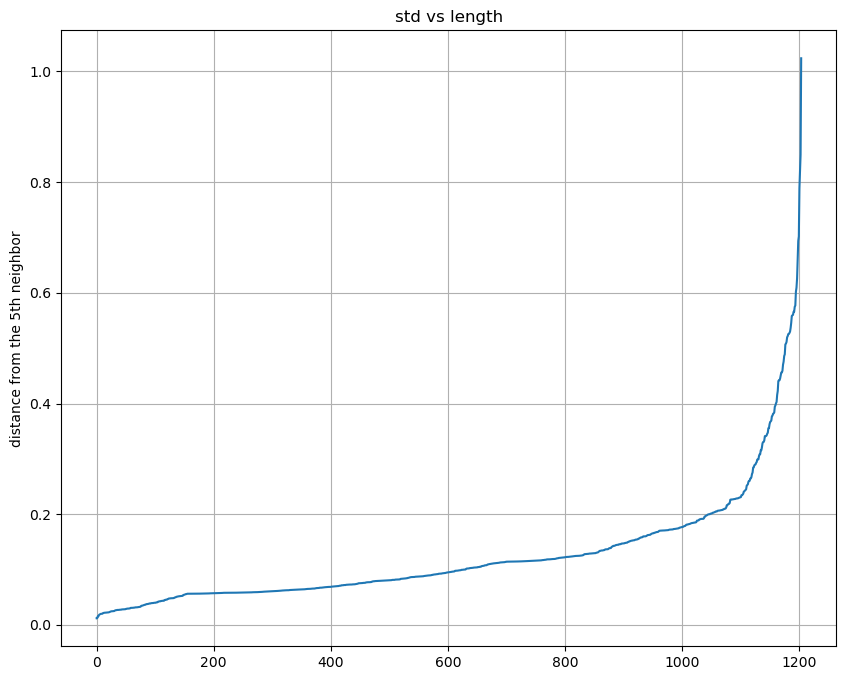

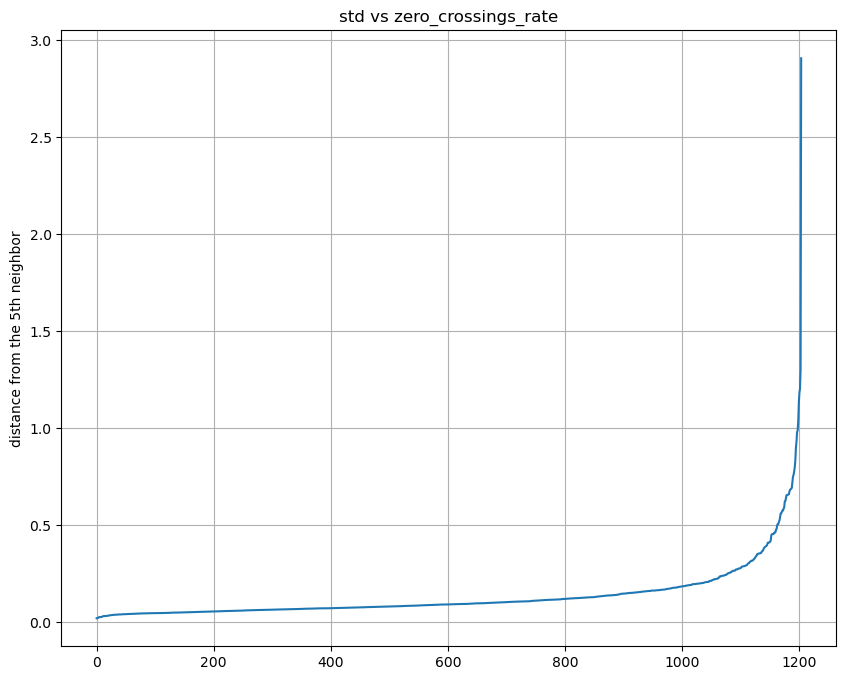

In [354]:
for pairs_ in pairs[232:238]:
    df_train=df_F[pairs_]
    SilCurve(pairs_,df_train,5)

In [358]:
EpsMinP_values6=[0 for i in range(len(pairs[232:238]))]

In [383]:
EpsMinP_values6[3]= Optimal_EpsMinP(3,15,0.18,0.65,0.02,df_F[pairs[235]])

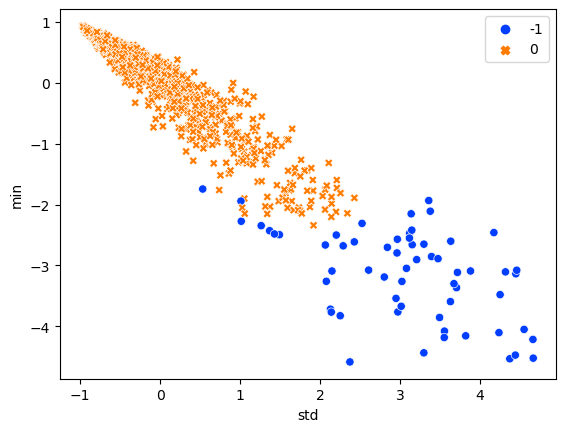

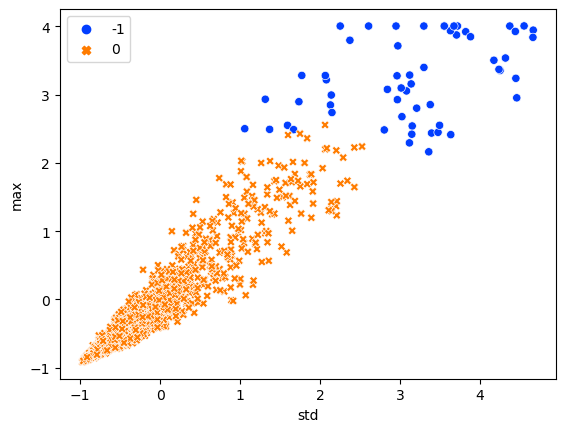

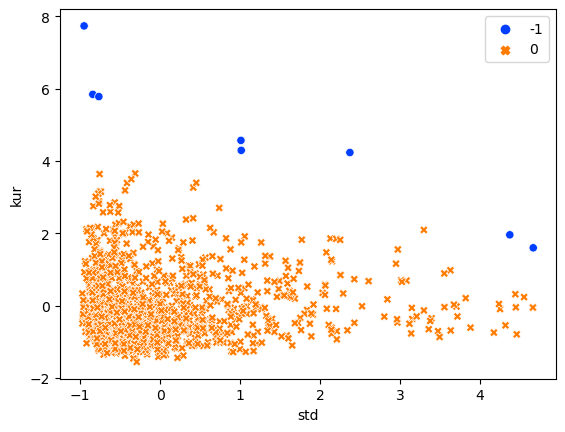

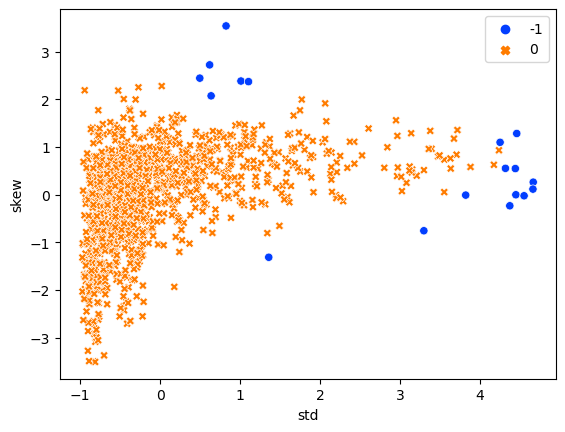

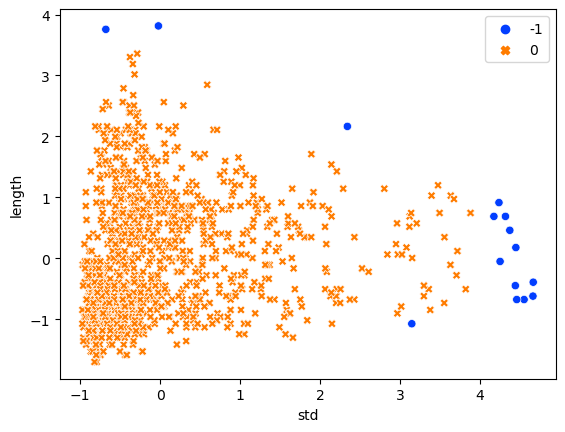

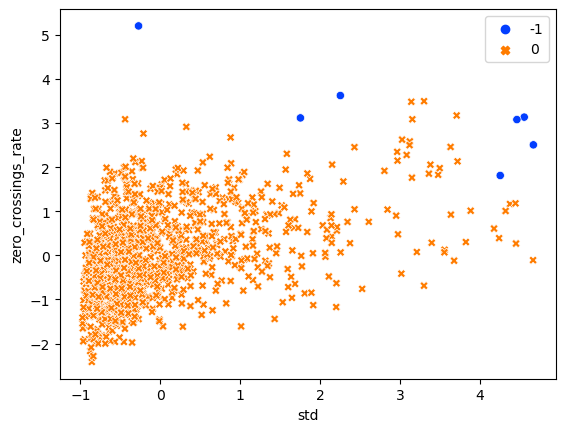

In [385]:
for i in range(6) :
    DBScanTest(pairs[232+i][0],pairs[232+i][1],EpsMinP_values6[i][2],EpsMinP_values6[i][1])

### Partition Emotion Positivity - sex 

In [391]:
to_ignore = ["intensity"]

#attr_part = "emotional_intensity"
#val = "normal"
#attr = "intensity"

attr_part1 = "emotion_positivity"
val1 = 1

attr_part2 = "sex"
val2 = "M"

#attr_part3 = "vocal_channel"
#val3 = "speech"

x = partition_df(df, attr_part1, False, False)[val1]
x = partition_df(x, attr_part2)[val2]
#x = partition_df(x, attr_part3)[val3]
df_cleaned = x.drop(columns=to_ignore)
df_cleaned = df_cleaned.drop(columns=correlation_drop_cols)

In [393]:
df_1_M=df_cleaned

In [426]:
def DBScanTest2(var1,var2,eps_,minP):
    df_train = df_1_M[[var1,var2]]
    
    dbscan = DBSCAN(eps=eps_, min_samples=minP, metric='euclidean')
    dbscan.fit(df_train)

    hist, bins = np.histogram(dbscan.labels_, bins=range(-1, len(set(dbscan.labels_)) + 1))

    labels_c = dict(zip(bins, hist))
    
    df_clusters = df_train.copy()
    df_clusters['Labels'] = dbscan.labels_

    sns.scatterplot(data=df_clusters, x=var1, y=var2, hue=dbscan.labels_, 
    style=dbscan.labels_, palette="bright")
    plt.show()

#### P2: Analysis for kur. 

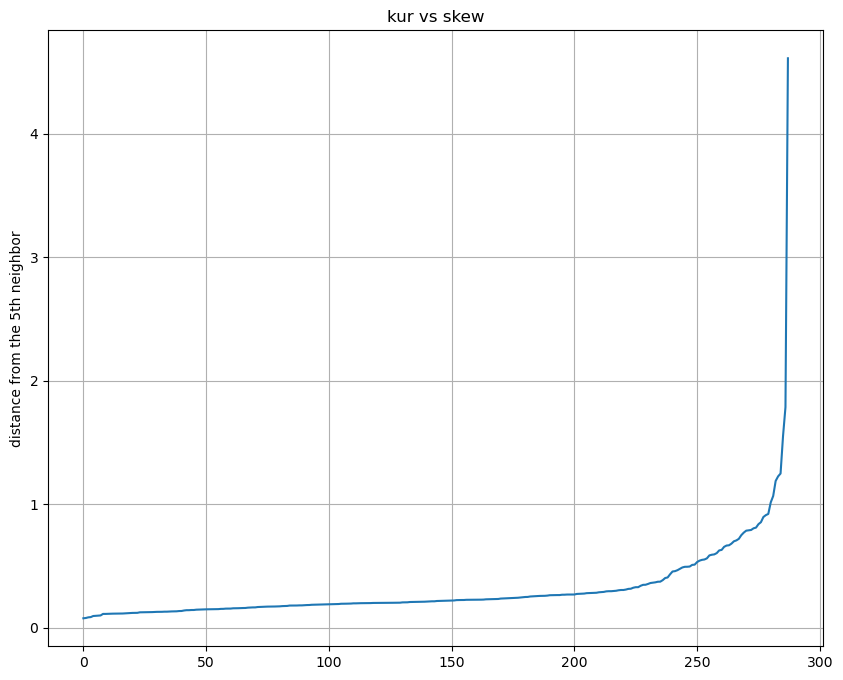

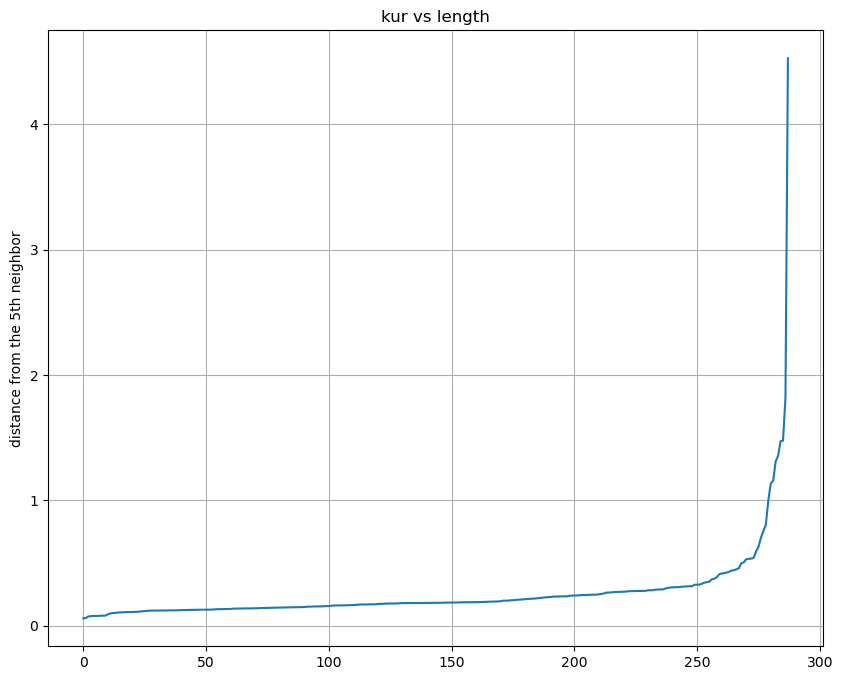

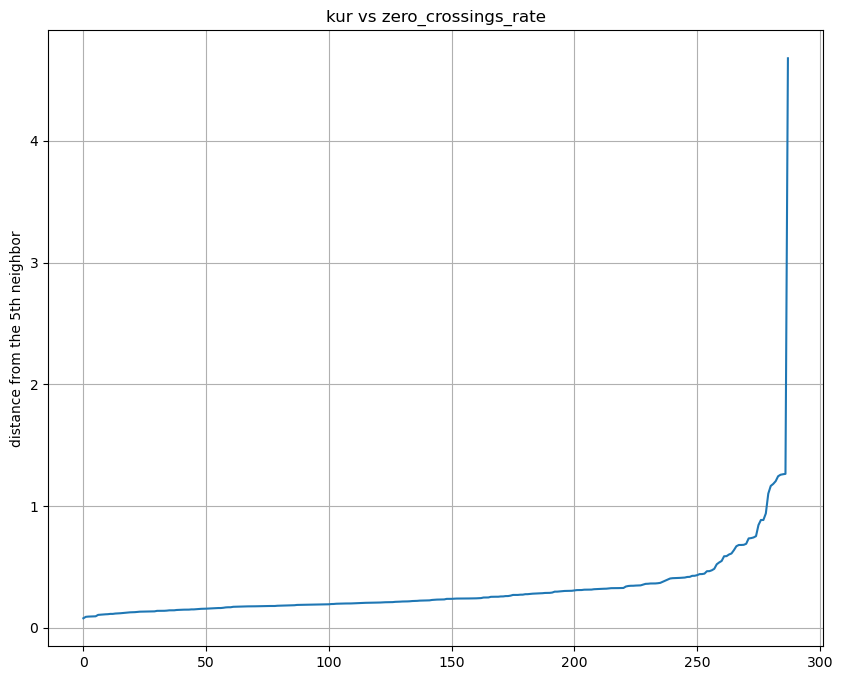

In [399]:
for pairs_ in pairs[247:250]:
    df_train=df_1_M[pairs_]
    SilCurve(pairs_,df_train,5)

In [400]:
EpsMinP_values20 =[0 for i in range(3)]

In [453]:
EpsMinP_values20[2]=Optimal_EpsMinP(2,15,0.2,0.7,0.005,df_1_M[pairs[249]])

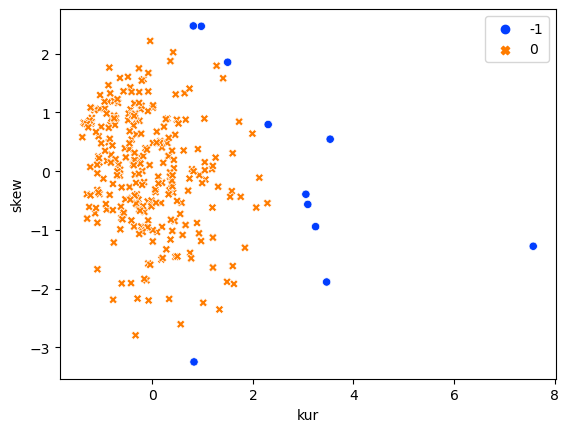

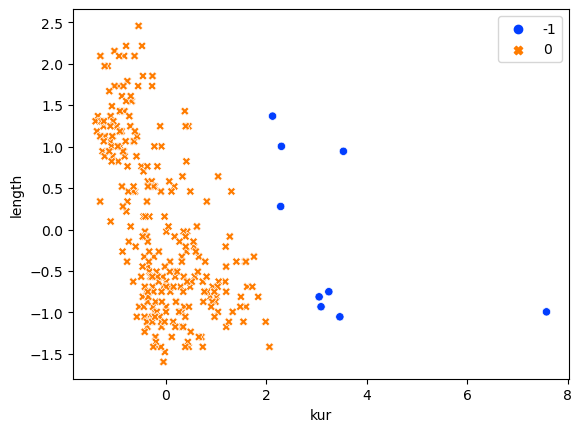

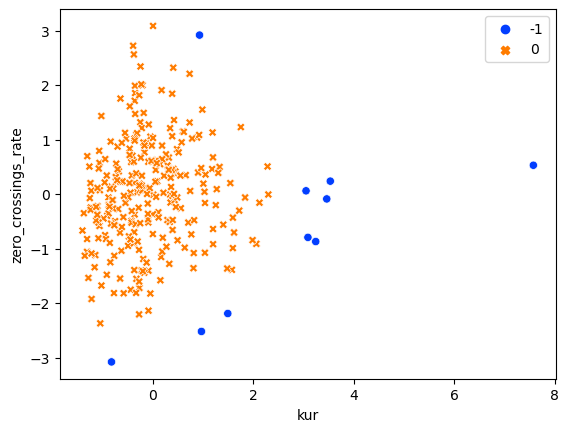

In [454]:
for i in range(3) :
    DBScanTest2(pairs[247+i][0],pairs[247+i][1],EpsMinP_values20[i][2],EpsMinP_values20[i][1])

###  mfcc_max - stft_std

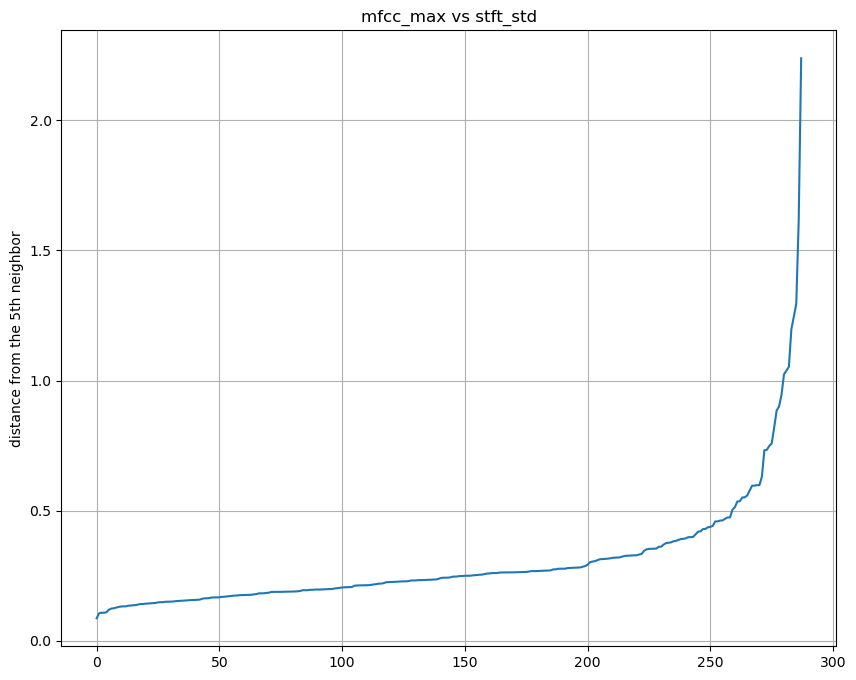

In [428]:
SilCurve(['mfcc_max', 'stft_std'],df_1_M[['mfcc_max', 'stft_std']],5)

In [436]:
Optimal_EpsMinP(3,20,0.355,0.7,0.05,df_1_M[['mfcc_max', 'stft_std']])

(0.4279552219781942, 8, 0.65)

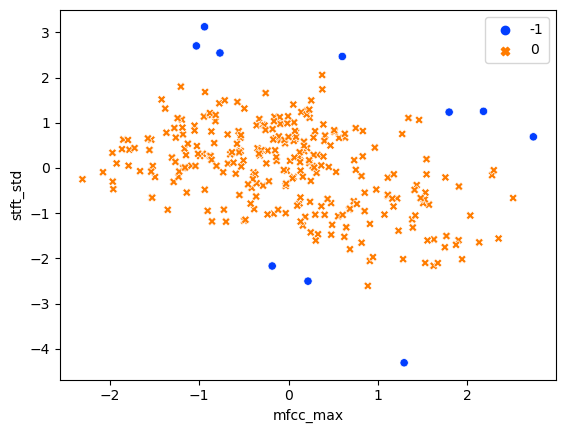

In [437]:
DBScanTest2('mfcc_max', 'stft_std',0.65,8)

### OPTICS

In [ ]:
from sklearn.cluster import OPTICS

In [ ]:
df_train = df_copy[["stft_std","mfcc_std"]]

In [ ]:
optics = OPTICS(eps=0.3, min_samples=10, metric='euclidean')
optics.fit(df_train)

hist, bins = np.histogram(optics.labels_, bins=range(-1, len(set(dbscan.labels_)) + 1))

print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(df_train, optics.labels_))

In [ ]:
df_clusters = df_train.copy()
df_clusters['Labels'] = optics.labels_

In [ ]:
sns.scatterplot(data=df_clusters, x="stft_std", y="mfcc_std", hue=optics.labels_, 
                style=optics.labels_, palette="bright")
plt.show()